# Cluster and Cloud Computing Assignment 2 - Big Data Analytics on the Cloud
**Note**: Before executing this notebook's code, you must first run:

```bash
kubectl port-forward service/router -n fission 8080:80
```
## Scenario 1: AFL Analysis
#### Data: Reddit and Bluesky
#### Analytics：
- Overall Comparative Analytics of Posts from Reddit and Bluesky
- Cross-Platform Sentiment Comparison: Top/Bottom 5 Teams by Total Sentiment Score
- Cross-Platform Feedback Comparison
- Cross-Platform Sentiment Trends and Match Results Comparison after 2024 (by week) for Top/Bottom 5 Team
- Cross-Platform Sentiment Trends and Match Win Rates Comparison in 2024 for Top/Bottom 5 Team
- Home Advantage Analytics
- Cross-Platform Subscribers Comparison: Top/Bottom 5 Teams by Number of Subscribers
- Sentiments and Subscribers Analytics after 2025-05-01 (by day) for Top/Bottom 5 Team

In [761]:
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from adjustText import adjust_text
from wordcloud import WordCloud
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

### 1. Overall Comparative Analytics of Posts from Reddit and Bluesky
#### 1.1 Comparison of Post Volumes

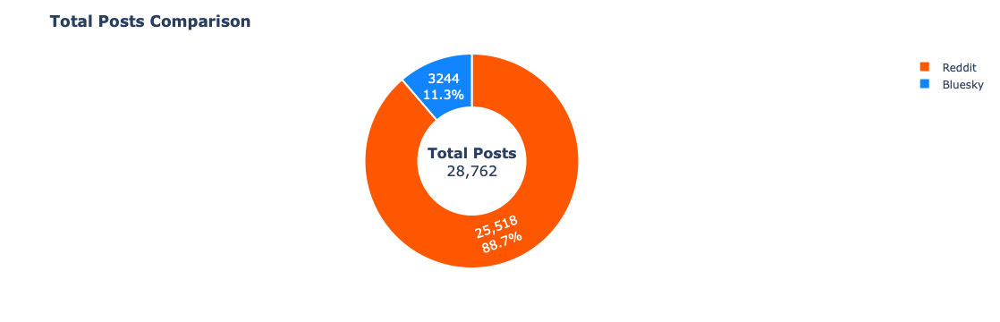

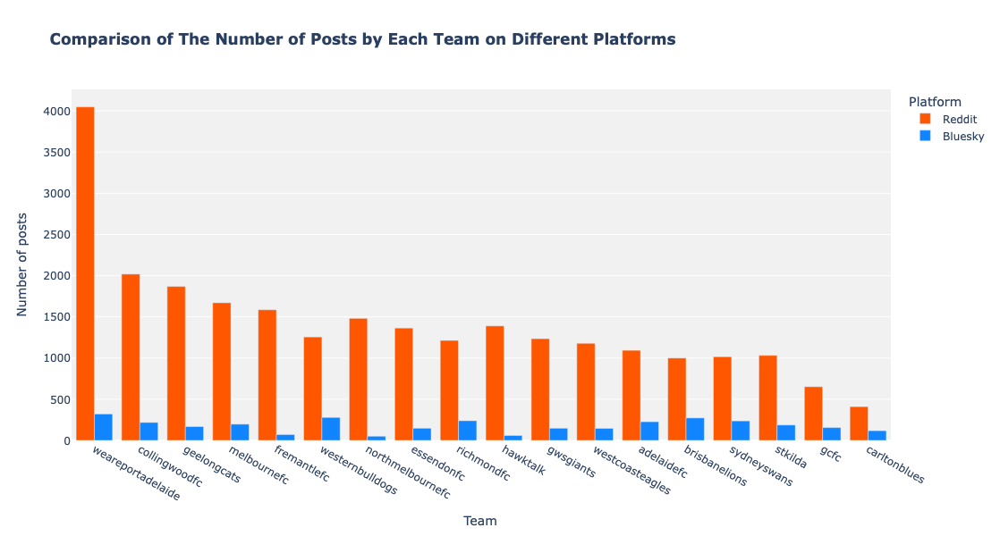

In [763]:
response = requests.get('http://localhost:8080/afl/post/comparison')
data = response.json()

# Prepare data
total_posts = pd.DataFrame({
    'Platform': ['Reddit', 'Bluesky'],
    'Posts': [data['total_posts']['reddit'], data['total_posts']['bluesky']]
})

team_comparison = pd.DataFrame(data['team_comparison'])
all_teams = team_comparison['name'].tolist()

# Total posts comparison ring chart

fig1 = px.pie(total_posts, values='Posts', names='Platform', 
             title='<b>Total Posts Comparison</b>',
             color='Platform', color_discrete_map={'Reddit': '#FF5700', 'Bluesky': '#1184FF'},
             hole=0.5)

fig1.update_traces(
    textposition='inside', 
    textinfo='percent+value',
    marker=dict(line=dict(color='#FFFFFF', width=2)),
    textfont=dict(size=14) 
)

fig1.update_layout(
    uniformtext_minsize=12, 
    uniformtext_mode='hide',
    annotations=[
        dict(
            text=f"<b>Total Posts</b><br>{total_posts['Posts'].sum():,}",
            x=0.5, 
            y=0.5, 
            font_size=16,
            showarrow=False,
            align='center',
            xanchor='center',
            yanchor='middle',
        )
    ],
    margin=dict(t=60, b=60, l=60, r=60)
)

fig1.show()


# Comparison of post volume of each team - grouped bar chart
team_comparison_melted = team_comparison.melt(
    id_vars='name', 
    value_vars=['reddit_posts', 'bluesky_posts'],
    var_name='Platform', 
    value_name='Posts'
)
team_comparison_melted['Platform'] = team_comparison_melted['Platform'].str.replace('_posts', '').str.capitalize()

fig2 = px.bar(team_comparison_melted, x='name', y='Posts', color='Platform',
             barmode='group', 
             title='<b>Comparison of The Number of Posts by Each Team on Different Platforms</b>',
             color_discrete_map={'Reddit': '#FF5700', 'Bluesky': '#1184FF'},
             labels={'name': 'Team', 'Posts': 'Number of posts'},
             height=600)
fig2.update_layout(plot_bgcolor='rgba(240,240,240,0.9)', xaxis={'categoryorder':'total descending'})
fig2.show()

#### 1.2 Comparison of Sentiment Scores

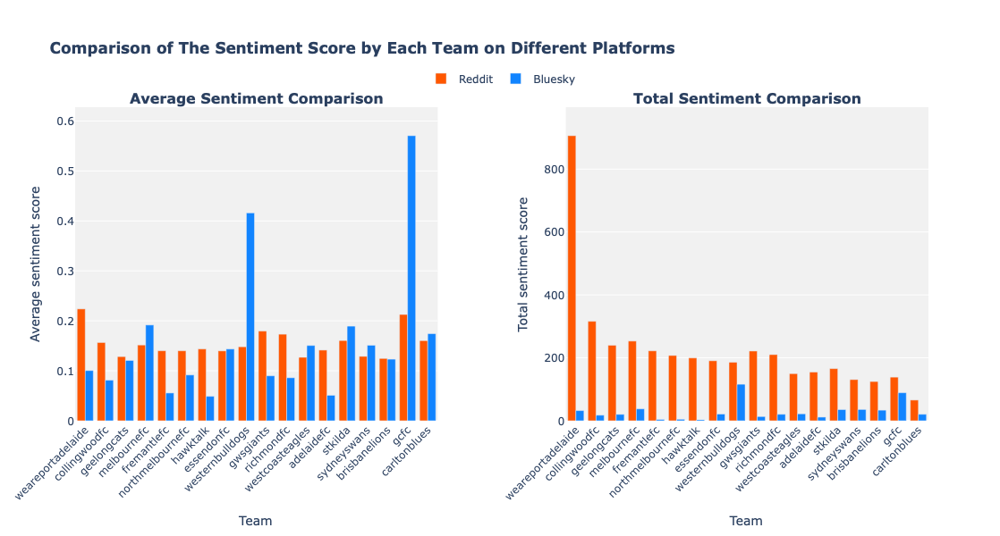

In [765]:
# Create a comparative bar chart (the horizontal axis is the team name)
fig3 = make_subplots(rows=1, cols=2, 
                    subplot_titles=('<b>Average Sentiment Comparison</b>', '<b>Total Sentiment Comparison</b>'),
                    horizontal_spacing=0.15)  

# Sort teams by total posts
team_comparison_sorted = team_comparison.sort_values(
    by=['reddit_posts', 'bluesky_posts'], 
    ascending=False
)

# Add average sentiment data (Reddit)
fig3.add_trace(
    go.Bar(
        x=team_comparison_sorted['name'],
        y=team_comparison_sorted['reddit_avg_sentiment'],
        name='Reddit',
        marker_color='#FF5700',
        hoverinfo='y+name',
        hoverlabel=dict(namelength=-1),
        hovertemplate='%{x}<br>Avg: %{y:.2f}<extra></extra>'
    ),
    row=1, col=1
)

# Add average sentiment data (Bluesky)
fig3.add_trace(
    go.Bar(
        x=team_comparison_sorted['name'],
        y=team_comparison_sorted['bluesky_avg_sentiment'],
        name='Bluesky',
        marker_color='#1184FF',
        hoverinfo='y+name',
        hoverlabel=dict(namelength=-1),
        hovertemplate='%{x}<br>Avg: %{y:.2f}<extra></extra>'
    ),
    row=1, col=1
)

# Add total sentiment data (Reddit)
fig3.add_trace(
    go.Bar(
        x=team_comparison_sorted['name'],
        y=team_comparison_sorted['reddit_total_sentiment'],
        name='Reddit',
        marker_color='#FF5700',
        showlegend=False, 
        hoverinfo='y+name',
        hoverlabel=dict(namelength=-1),
        hovertemplate='%{x}<br>Total: %{y:.0f}<extra></extra>'
    ),
    row=1, col=2
)

# Add total sentiment data (Bluesky)
fig3.add_trace(
    go.Bar(
        x=team_comparison_sorted['name'],
        y=team_comparison_sorted['bluesky_total_sentiment'],
        name='Bluesky',
        marker_color='#1184FF',
        showlegend=False, 
        hoverinfo='y+name',
        hoverlabel=dict(namelength=-1),
        hovertemplate='%{x}<br>Total: %{y:.0f}<extra></extra>'
    ),
    row=1, col=2
)

# Update layout
fig3.update_layout(
    plot_bgcolor='rgba(240,240,240,0.9)',
    title_text='<b>Comparison of The Sentiment Score by Each Team on Different Platforms</b>',
    height=600,
    barmode='group',
    xaxis_title="Team",
    xaxis2_title="Team",
    yaxis_title="Average sentiment score",
    yaxis2_title="Total sentiment score",
    margin=dict(t=120, b=120, l=80, r=80),  
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.05,  
        xanchor="center",
        x=0.5
    )
)

# Adjust the X-axis label angle to prevent overlap
fig3.update_xaxes(tickangle=-45, row=1, col=1)
fig3.update_xaxes(tickangle=-45, row=1, col=2)

# Set different Y-axis ranges
avg_max = team_comparison[['reddit_avg_sentiment', 'bluesky_avg_sentiment']].max().max() * 1.1
total_max = team_comparison[['reddit_total_sentiment', 'bluesky_total_sentiment']].max().max() * 1.1

fig3.update_yaxes(range=[0, avg_max], row=1, col=1)
fig3.update_yaxes(range=[0, total_max], row=1, col=2)

fig3.show()

### 2. Cross-Platform Sentiment Comparison: Top/Bottom 5 Teams by Total Sentiment Score
#### Reddit

==== The top 5 teams with the highest total sentiments on Reddit ====
             name  Total-sentiment  Average-sentiment  Number of posts
weareportadelaide       906.142001           0.223794             4049
    collingwoodfc       316.096400           0.156561             2019
      melbournefc       253.267501           0.151566             1671
      geelongcats       239.931600           0.128374             1869
      fremantlefc       222.150500           0.140070             1586

==== The top 5 teams with the lowest total sentiments on Reddit ====
           name  Total-sentiment  Average-sentiment  Number of posts
   carltonblues          65.7625           0.160006              411
  brisbanelions         124.6672           0.124667             1000
    sydneyswans         130.8964           0.128835             1016
           gcfc         138.6633           0.212674              652
westcoasteagles         149.7030           0.126975             1179


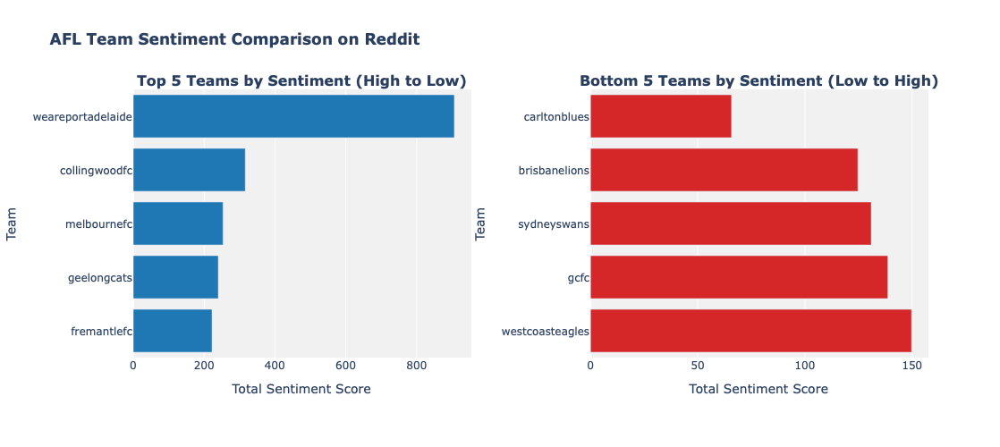

In [767]:
response = requests.get('http://localhost:8080/afl/sentiment/reddit')
sentiment_data = response.json()

if 'top_5_teams_reddit' not in sentiment_data:
    print("API Error:", sentiment_data.get('error', 'Unknown data error'))
else:
    # Create and sort DataFrames
    top_teams_df = pd.DataFrame(sentiment_data['top_5_teams_reddit']).sort_values('total_sentiment_reddit', ascending=False)
    bottom_teams_df = pd.DataFrame(sentiment_data['bottom_5_teams_reddit']).sort_values('total_sentiment_reddit', ascending=True)

        # Print result
    print("==== The top 5 teams with the highest total sentiments on Reddit ====")
    print(top_teams_df[['name', 'total_sentiment_reddit', 'avg_sentiment_reddit', 'doc_count_reddit']]
          .rename(columns={
              'total_sentiment_reddit': 'Total-sentiment',
              'avg_sentiment_reddit': 'Average-sentiment',
              'doc_count_reddit': 'Number of posts'
          }).to_string(index=False))
    
    print("\n==== The top 5 teams with the lowest total sentiments on Reddit ====")
    print(bottom_teams_df[['name', 'total_sentiment_reddit', 'avg_sentiment_reddit', 'doc_count_reddit']]
          .rename(columns={
              'total_sentiment_reddit': 'Total-sentiment',
              'avg_sentiment_reddit': 'Average-sentiment',
              'doc_count_reddit': 'Number of posts'
          }).to_string(index=False))
    
    # Top/Bottom Teams Comparison - Grouped Bar Chart
    fig4 = make_subplots(
        rows=1, 
        cols=2, 
        subplot_titles=(
            '<b>Top 5 Teams by Sentiment (High to Low)</b>', 
            '<b>Bottom 5 Teams by Sentiment (Low to High)</b>'
        ),
        horizontal_spacing=0.15
    )
    
    # Add top teams data (sorted high to low)
    fig4.add_trace(
        go.Bar(
            y=top_teams_df['name'],
            x=top_teams_df['total_sentiment_reddit'],
            name='Highest Sentiment',
            orientation='h',
            marker_color='#1f77b4',
            hovertemplate=(
                '<b>%{y}</b><br>'
                'Total Sentiment: %{x:.0f}<br>'
                'Avg Sentiment: %{customdata:.2f}<extra></extra>'
            ),
            customdata=top_teams_df['avg_sentiment_reddit']
        ),
        row=1, 
        col=1
    )
    
    # Add bottom teams data (sorted low to high)
    fig4.add_trace(
        go.Bar(
            y=bottom_teams_df['name'],
            x=bottom_teams_df['total_sentiment_reddit'],
            name='Lowest Sentiment',
            orientation='h',
            marker_color='#d62728',
            hovertemplate=(
                '<b>%{y}</b><br>'
                'Total Sentiment: %{x:.0f}<br>'
                'Avg Sentiment: %{customdata:.2f}<extra></extra>'
            ),
            customdata=bottom_teams_df['avg_sentiment_reddit']
        ),
        row=1, 
        col=2
    )
    
    # Update layout
    fig4.update_layout(
        plot_bgcolor='rgba(240,240,240,0.9)',
        title_text='<b>AFL Team Sentiment Comparison on Reddit</b>',
        height=500,
        showlegend=False,
        margin=dict(t=100, b=100, l=80, r=80),
        xaxis_title="Total Sentiment Score",
        xaxis2_title="Total Sentiment Score",
        yaxis_title="Team",
        yaxis2_title="Team",
        yaxis={'categoryorder':'total ascending'},  # Sort top chart high to low
        yaxis2={'categoryorder':'total descending'}  # Sort bottom chart low to high
    )
    
    fig4.show()

#### Bluesky

==== The top 5 teams with the highest total sentiments on Bluesky ====
           name  Total-sentiment  Average-sentiment  Number of posts
westernbulldogs       116.064003           0.416000              279
           gcfc        89.003001           0.570532              156
    melbournefc        37.753000           0.191640              197
    sydneyswans        35.796000           0.151038              237
        stkilda        35.407000           0.189342              187

==== The top 5 teams with the lowest total sentiments on Bluesky ====
            name  Total-sentiment  Average-sentiment  Number of posts
        hawktalk            2.933           0.048883               60
     fremantlefc            3.947           0.055592               71
northmelbournefc            4.673           0.091627               51
      adelaidefc           11.557           0.050912              227
       gwsgiants           13.308           0.089919              148


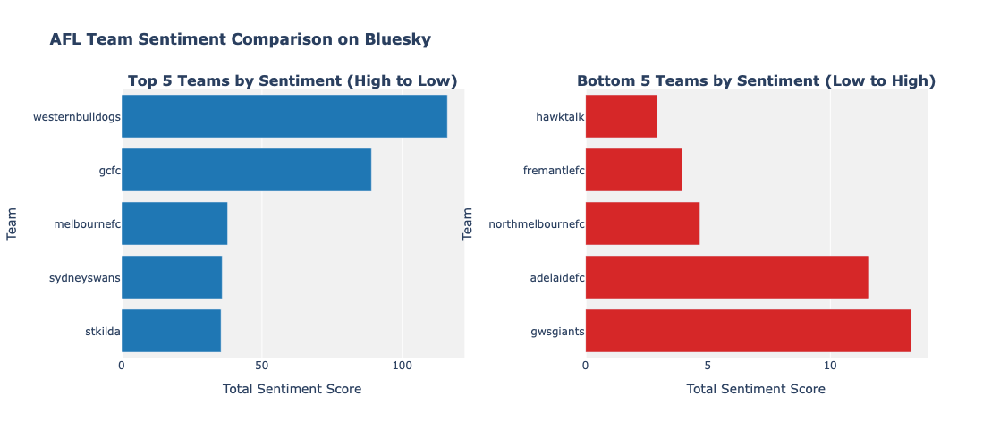

In [769]:
response = requests.get('http://localhost:8080/afl/sentiment/bluesky')
sentiment_data = response.json()

# Check if data was received successfully
if 'top_5_teams_bluesky' not in sentiment_data:
    print("API Error:", sentiment_data.get('error', 'Unknown data error'))
else:
    # Create DataFrames from the response data
    top_teams_df = pd.DataFrame(sentiment_data['top_5_teams_bluesky']).sort_values('total_sentiment_bluesky', ascending=False)
    bottom_teams_df = pd.DataFrame(sentiment_data['bottom_5_teams_bluesky']).sort_values('total_sentiment_bluesky', ascending=True)

    # Print result
    print("==== The top 5 teams with the highest total sentiments on Bluesky ====")
    print(top_teams_df[['name', 'total_sentiment_bluesky', 'avg_sentiment_bluesky', 'doc_count_bluesky']]
          .rename(columns={
              'total_sentiment_bluesky': 'Total-sentiment',
              'avg_sentiment_bluesky': 'Average-sentiment',
              'doc_count_bluesky': 'Number of posts'
          }).to_string(index=False))
    
    print("\n==== The top 5 teams with the lowest total sentiments on Bluesky ====")
    print(bottom_teams_df[['name', 'total_sentiment_bluesky', 'avg_sentiment_bluesky', 'doc_count_bluesky']]
          .rename(columns={
              'total_sentiment_bluesky': 'Total-sentiment',
              'avg_sentiment_bluesky': 'Average-sentiment',
              'doc_count_bluesky': 'Number of posts'
          }).to_string(index=False))
    
     # Top/Bottom Teams Comparison - Grouped Bar Chart
    fig5 = make_subplots(
        rows=1, 
        cols=2, 
        subplot_titles=(
            '<b>Top 5 Teams by Sentiment (High to Low)</b>', 
            '<b>Bottom 5 Teams by Sentiment (Low to High)</b>'
        ),
        horizontal_spacing=0.15
    )
    
    # Add top teams data (sorted high to low)
    fig5.add_trace(
        go.Bar(
            y=top_teams_df['name'],
            x=top_teams_df['total_sentiment_bluesky'],
            name='Highest Sentiment',
            orientation='h',
            marker_color='#1f77b4',
            hovertemplate=(
                '<b>%{y}</b><br>'
                'Total Sentiment: %{x:.0f}<br>'
                'Avg Sentiment: %{customdata:.2f}<extra></extra>'
            ),
            customdata=top_teams_df['avg_sentiment_bluesky']
        ),
        row=1, 
        col=1
    )
    
    # Add bottom teams data (sorted low to high)
    fig5.add_trace(
        go.Bar(
            y=bottom_teams_df['name'],
            x=bottom_teams_df['total_sentiment_bluesky'],
            name='Lowest Sentiment',
            orientation='h',
            marker_color='#d62728',
            hovertemplate=(
                '<b>%{y}</b><br>'
                'Total Sentiment: %{x:.0f}<br>'
                'Avg Sentiment: %{customdata:.2f}<extra></extra>'
            ),
            customdata=bottom_teams_df['avg_sentiment_bluesky']
        ),
        row=1, 
        col=2
    )
    
    # Update layout
    fig5.update_layout(
        plot_bgcolor='rgba(240,240,240,0.9)',
        title_text='<b>AFL Team Sentiment Comparison on Bluesky</b>',
        height=500,
        showlegend=False,
        margin=dict(t=100, b=100, l=80, r=80),
        xaxis_title="Total Sentiment Score",
        xaxis2_title="Total Sentiment Score",
        yaxis_title="Team",
        yaxis2_title="Team",
        yaxis={'categoryorder':'total ascending'},  # Sort top chart high to low
        yaxis2={'categoryorder':'total descending'}  # Sort bottom chart low to high
    )
    
    fig5.show()

### 3. Cross-Platform Feedback Comparison
#### Reddit

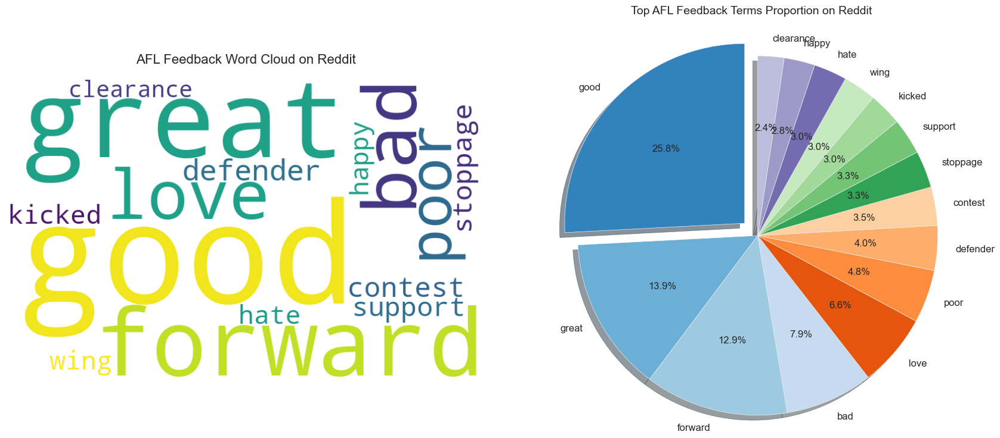

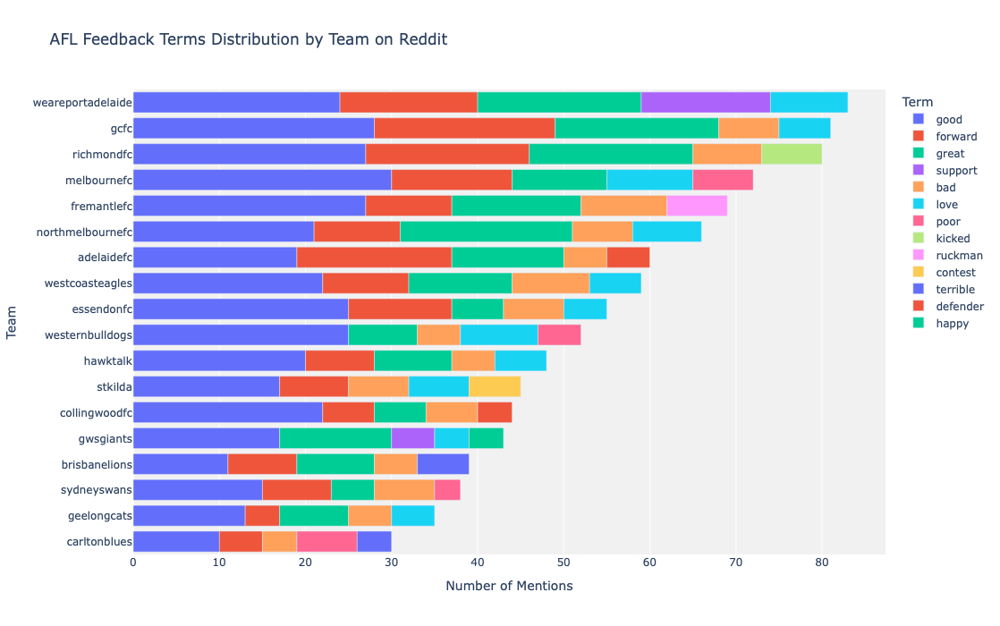

In [771]:
response = requests.get('http://localhost:8080/afl/feedback/reddit')
data = response.json()

# Prepare data
team_data = []
for team, feedback in data['team_feedback'].items():
    for term, count in feedback['top_terms']:
        team_data.append({
            'Team': team,
            'Term': term,
            'Count': count,
            'Total Mentions': feedback['total_mentions']
        })
team_df = pd.DataFrame(team_data)
top_feedback = pd.DataFrame(data['top_feedback'], columns=['Term', 'Count'])

plt.style.use('ggplot')
plt.figure(figsize=(18, 8)) 

# Wordcloud
plt.subplot(1, 2, 1) 
word_freq = dict(zip(top_feedback['Term'], top_feedback['Count']))
wordcloud = WordCloud(width=800, height=500, background_color='white', 
                     colormap='viridis').generate_from_frequencies(word_freq)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('AFL Feedback Word Cloud on Reddit', pad=20, fontsize=16)

# Pie chart
plt.subplot(1, 2, 2)  
pie_data = top_feedback.sort_values('Count', ascending=False)
explode = [0.1] + [0]*(len(pie_data)-1)  
colors = plt.cm.tab20c(range(len(pie_data)))  
plt.pie(pie_data['Count'], labels=pie_data['Term'], autopct='%1.1f%%',
        startangle=90, explode=explode, shadow=True, colors=colors,
        textprops={'fontsize': 12})
plt.title('Top AFL Feedback Terms Proportion on Reddit', pad=20, fontsize=14)
plt.axis('equal')

plt.tight_layout(pad=3.0)
plt.show()

# Interactive bar chart
fig6 = px.bar(team_df.sort_values('Count', ascending=False),
             x='Count', 
             y='Team',  
             color='Term',
             title='AFL Feedback Terms Distribution by Team on Reddit',
             labels={'Count': 'Number of Mentions'},
             height=700)
fig6.update_layout(plot_bgcolor='rgba(240,240,240,0.9)', yaxis={'categoryorder':'total ascending'})
fig6.show()

#### Bluesky

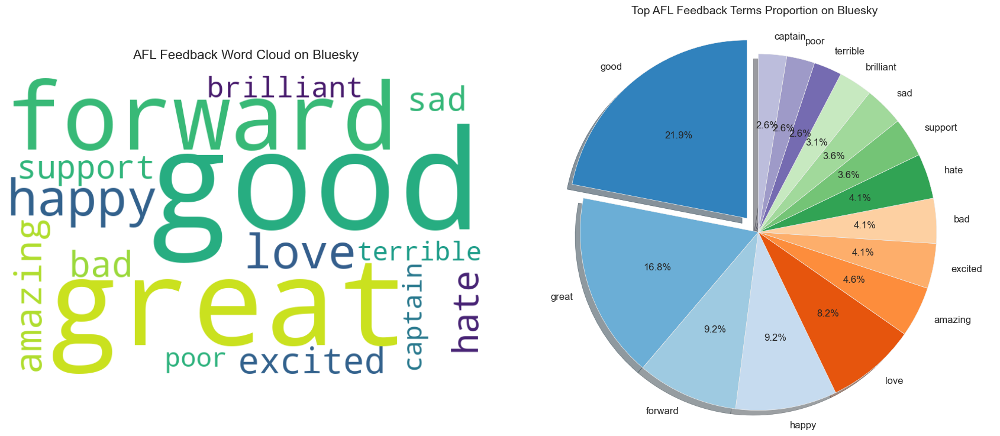

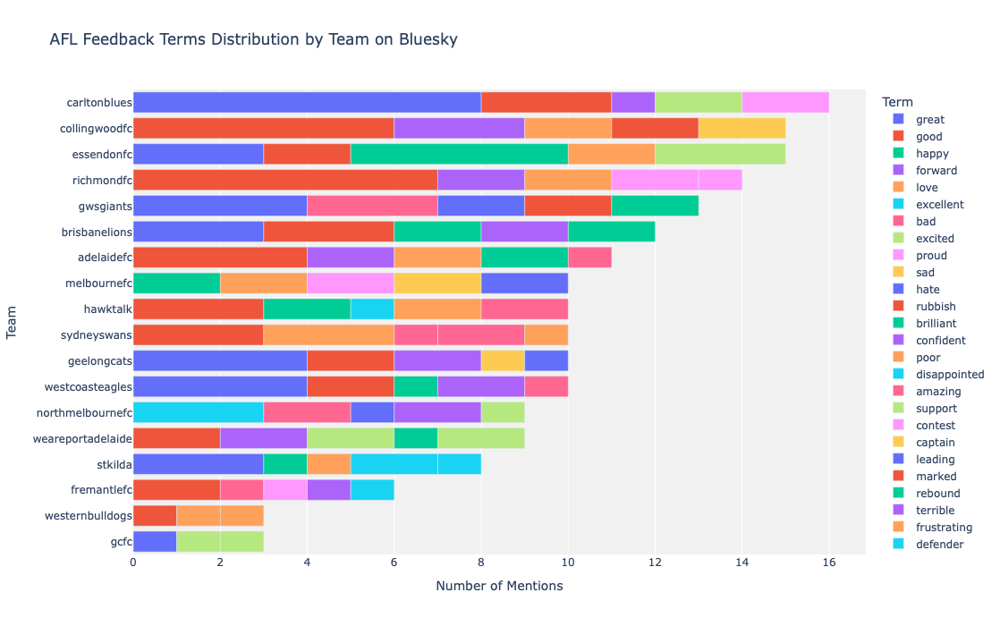

In [773]:
response = requests.get('http://localhost:8080/afl/feedback/bluesky')
data = response.json()

# Prepare data
team_data = []
for team, feedback in data['team_feedback'].items():
    for term, count in feedback['top_terms']:
        team_data.append({
            'Team': team,
            'Term': term,
            'Count': count,
            'Total Mentions': feedback['total_mentions']
        })
team_df = pd.DataFrame(team_data)
top_feedback = pd.DataFrame(data['top_feedback'], columns=['Term', 'Count'])

plt.style.use('ggplot')
plt.figure(figsize=(18, 8)) 

# Wordcloud
plt.subplot(1, 2, 1) 
word_freq = dict(zip(top_feedback['Term'], top_feedback['Count']))
wordcloud = WordCloud(width=800, height=500, background_color='white', 
                     colormap='viridis').generate_from_frequencies(word_freq)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('AFL Feedback Word Cloud on Bluesky', pad=20, fontsize=16)

# Pie chart
plt.subplot(1, 2, 2)  
pie_data = top_feedback.sort_values('Count', ascending=False)
explode = [0.1] + [0]*(len(pie_data)-1)  
colors = plt.cm.tab20c(range(len(pie_data)))  
plt.pie(pie_data['Count'], labels=pie_data['Term'], autopct='%1.1f%%',
        startangle=90, explode=explode, shadow=True, colors=colors,
        textprops={'fontsize': 12})
plt.title('Top AFL Feedback Terms Proportion on Bluesky', pad=20, fontsize=14)
plt.axis('equal')

plt.tight_layout(pad=3.0)
plt.show()

# Interactive bar chart
fig7 = px.bar(team_df.sort_values('Count', ascending=False),
             x='Count', 
             y='Team',
             color='Term',
             title='AFL Feedback Terms Distribution by Team on Bluesky',
             labels={'Count': 'Number of Mentions'},
             height=700)
fig7.update_layout(plot_bgcolor='rgba(240,240,240,0.9)', yaxis={'categoryorder':'total ascending'})
fig7.show()

### 4. Cross-Platform Sentiment Trends and Match Results Comparison after 2024 (by week) for Top/Bottom 5 Team
#### Reddit
- Average sentiment trends and match results after 2024 (by week) for top 5 teams


In [775]:
sns.set_style("whitegrid")

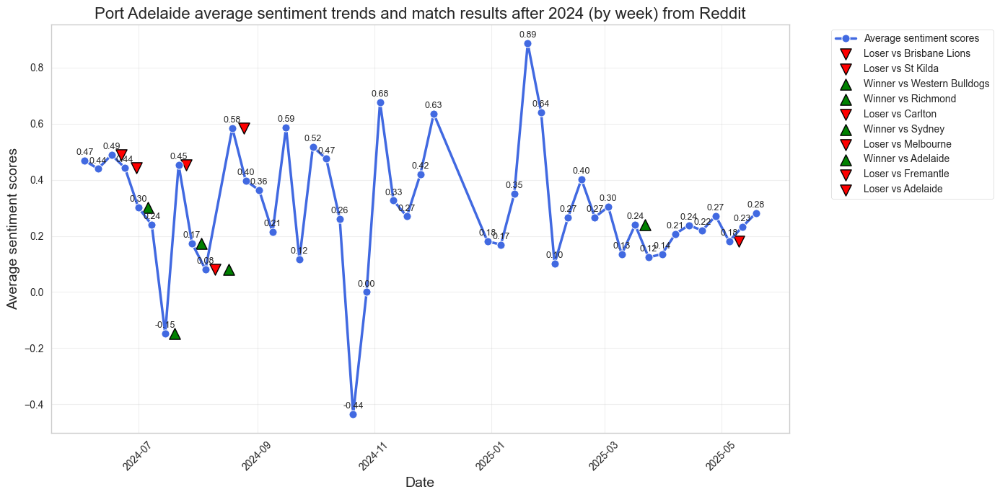

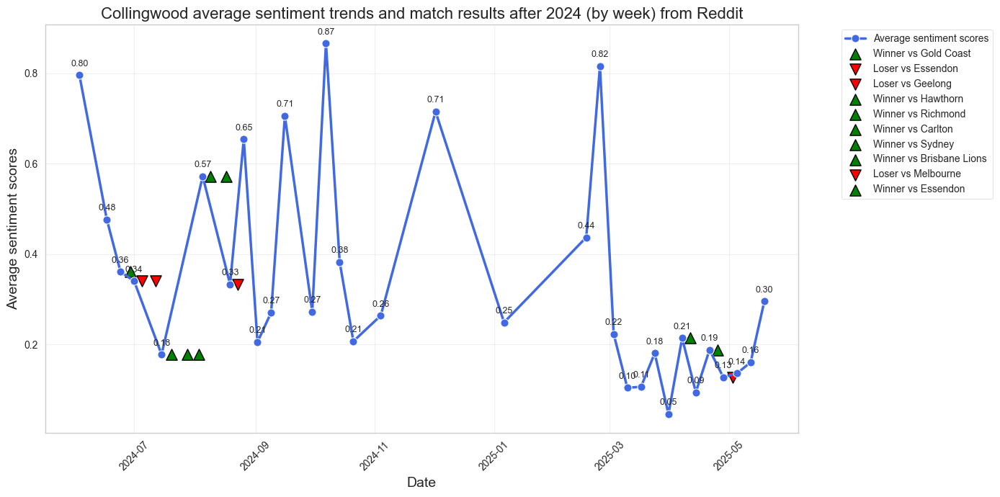

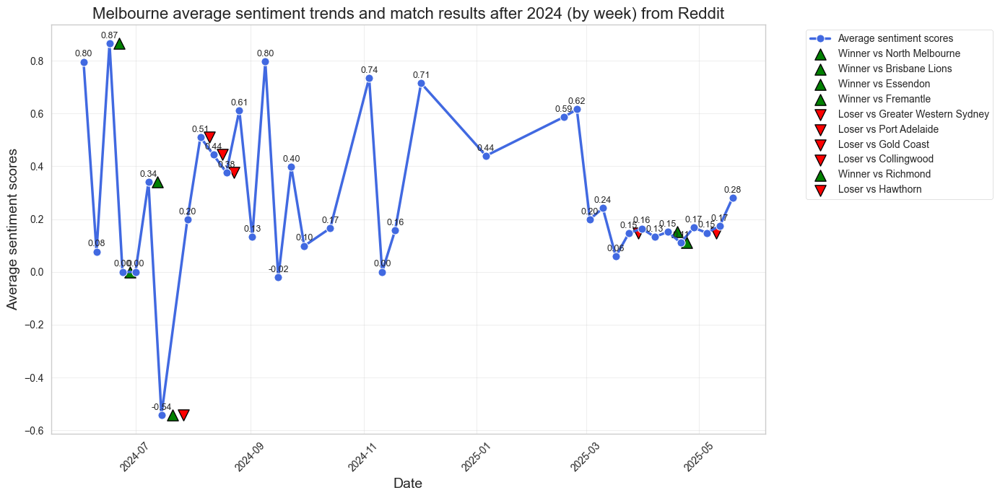

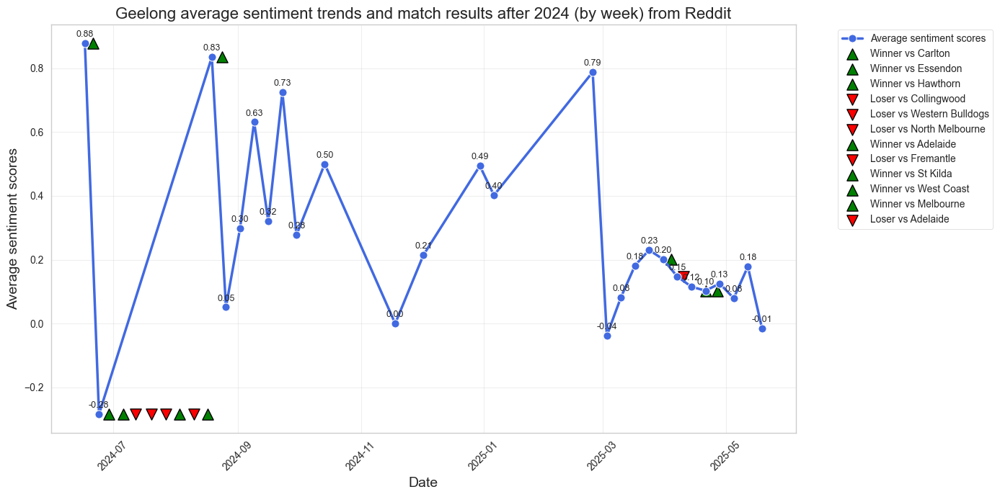

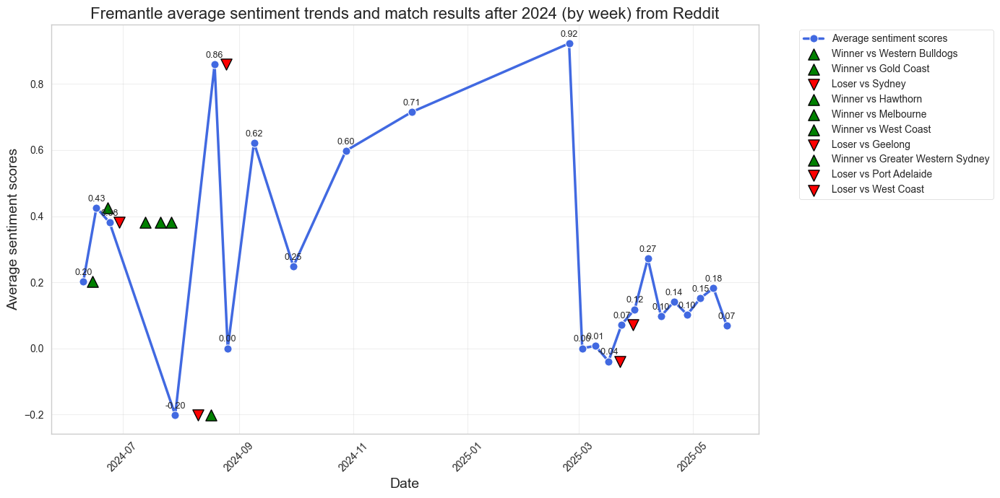

In [776]:
# Average sentiment trends and match results after 2024 (by week) for top 5 teams
response = requests.get('http://localhost:8080/afl/result/sentiment/reddit', headers={'X-Date-Format': 'week'})
data = response.json()

# Extract data
sentiment_data = data['sentiment_data']
all_teams = sentiment_data['all_teams']
top_teams_data = sentiment_data['top_5']
TEAM_MAPPING = data['team_mapping']
top_teams = [TEAM_MAPPING.get(t['name'], t['name']) for t in top_teams_data]

# Create a sentiment time series DataFrame and standardise the team names
time_dfs = []
for team in all_teams:
    df = pd.DataFrame(team['time_series'])
    standardised_name = TEAM_MAPPING.get(team['name'], team['name'])
    df['team'] = standardised_name
    time_dfs.append(df)
time_df = pd.concat(time_dfs)
time_df['date'] = pd.to_datetime(time_df['date'])
time_df = time_df[time_df['date'] >= '2024-01-01']

# Prepare match data and standardise team names
matches_df = pd.DataFrame(data['match_data'])
matches_df['date'] = pd.to_datetime(matches_df['date'].str.split().str[0])
matches_df['team'] = matches_df['team'].apply(lambda x: TEAM_MAPPING.get(x, x))

# Create a chart for each top 5 team
for team in top_teams:
    plt.figure(figsize=(14, 7))

    team_sentiment = time_df[time_df['team'] == team]
    if team_sentiment.empty:
        print(f"[Warning] cannot find sentiment data of {team}, skip.")
        continue

    sns.lineplot(x='date', y='avg_sentiment', 
                 data=team_sentiment, 
                 color='royalblue',
                 linewidth=2.5,
                 marker='o',
                 markersize=8,
                 label='Average sentiment scores')

    team_matches = matches_df[matches_df['team'] == team].sort_values('date')
    for _, match in team_matches.iterrows():
        # Find the sentiment data point closest to the date before the game
        past_data = team_sentiment[team_sentiment['date'] <= match['date']]
        if past_data.empty:
            continue
        closest_idx = past_data['date'].idxmax()
        sentiment_value = team_sentiment.loc[closest_idx, 'avg_sentiment']

        # Mark the results of the match
        if match['result'] == "Winner":
            marker = '^'
            color = 'green'
            label = f"Winner vs {match['opponent']}"
        elif match['result'] == "Loser":
            marker = 'v'
            color = 'red'
            label = f"Loser vs {match['opponent']}"
        else:
            marker = 'o'
            color = 'gray'
            label = f"Draw vs {match['opponent']}"

        plt.scatter(match['date'], sentiment_value,
                    marker=marker, color=color, s=120,
                    edgecolors='black', linewidths=1,
                    label=label)

    # Marking Values
    for _, row in team_sentiment.iterrows():
        plt.text(row['date'], row['avg_sentiment'] + 0.02,
                 f"{row['avg_sentiment']:.2f}",
                 fontsize=9, ha='center')

    plt.title(f'{team} average sentiment trends and match results after 2024 (by week) from Reddit', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Average sentiment scores', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)

    # Remove duplicate legends
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),
               bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

- Average sentiment trends and match results after 2024 (by week) for bottom 5 teams

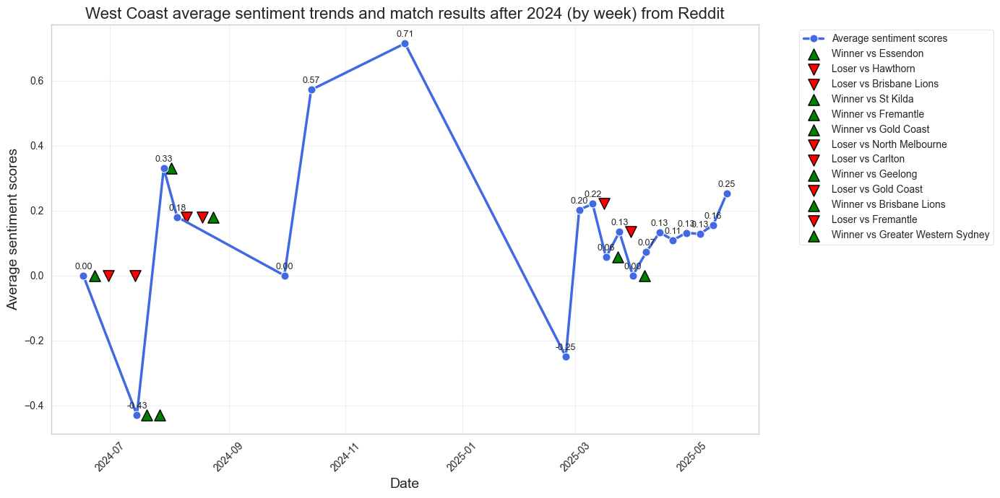

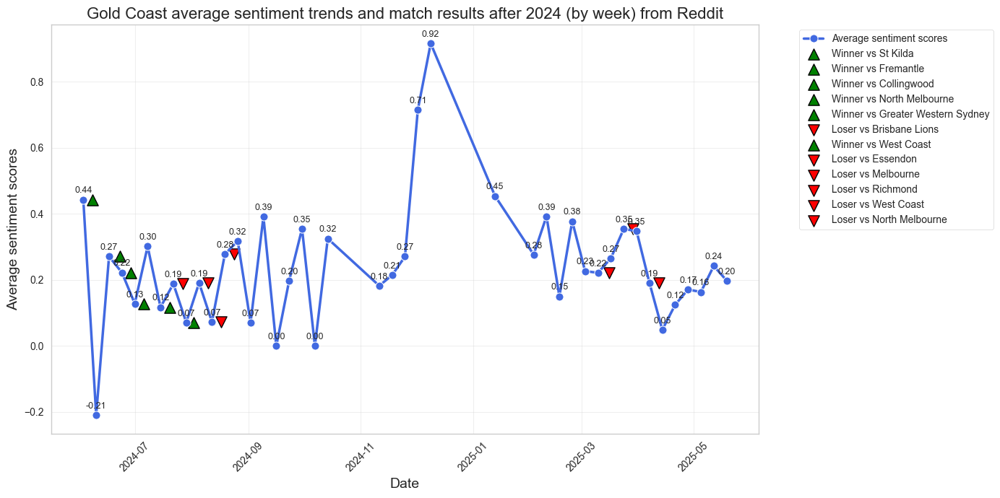

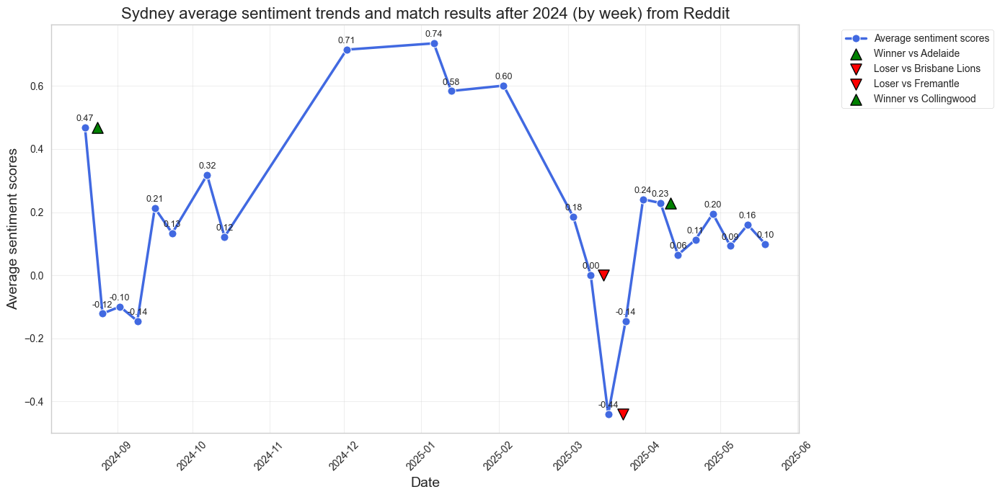

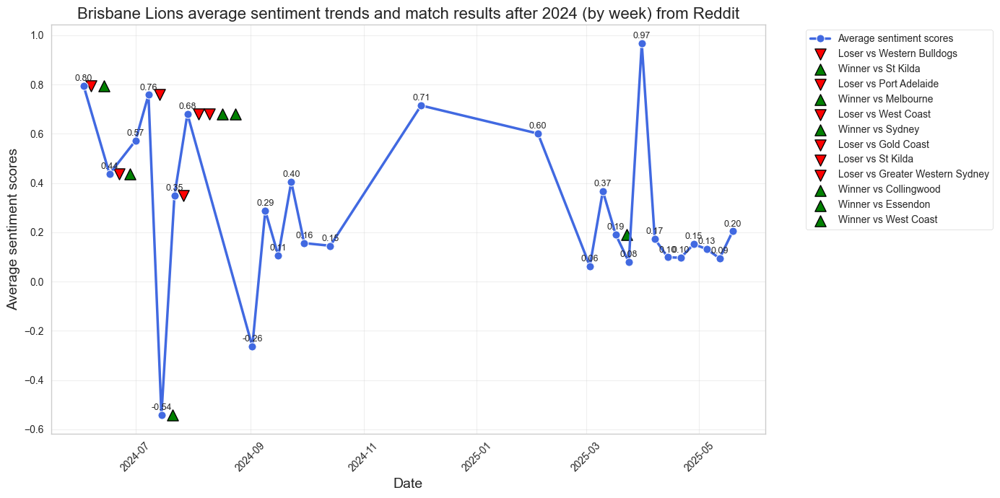

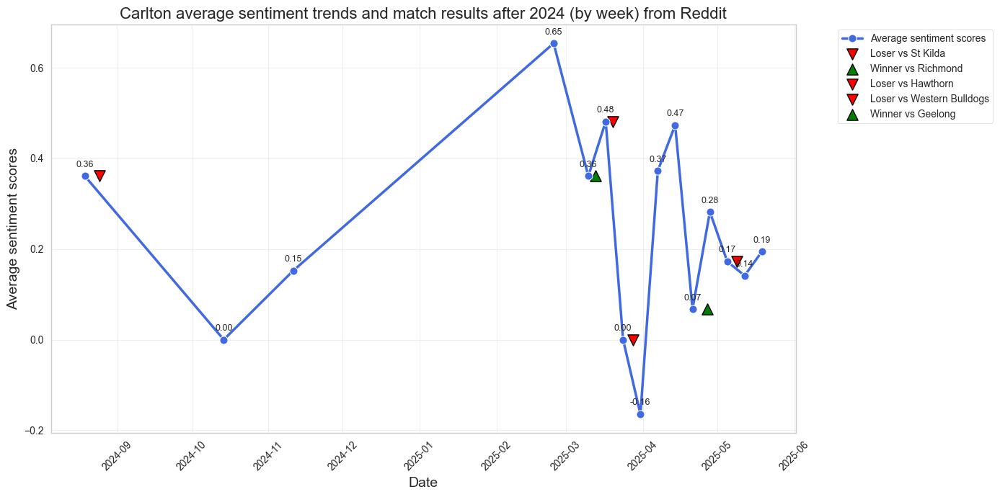

In [778]:
# Average sentiment trends and match results after 2024 (by week) for bottom 5 teams
response = requests.get('http://localhost:8080/afl/result/sentiment/reddit', headers={'X-Date-Format': 'week'})
data = response.json()

# Extract data
sentiment_data = data['sentiment_data']
all_teams = sentiment_data['all_teams']
bottom_teams_data = sentiment_data['bottom_5']
TEAM_MAPPING = data['team_mapping']
bottom_teams = [TEAM_MAPPING.get(t['name'], t['name']) for t in bottom_teams_data]

# Create a sentiment time series DataFrame and standardise the team names
time_dfs = []
for team in all_teams:
    df = pd.DataFrame(team['time_series'])
    standardised_name = TEAM_MAPPING.get(team['name'], team['name'])
    df['team'] = standardised_name
    time_dfs.append(df)
time_df = pd.concat(time_dfs)
time_df['date'] = pd.to_datetime(time_df['date'])
time_df = time_df[time_df['date'] >= '2024-01-01']

# Prepare match data and standardise team names
matches_df = pd.DataFrame(data['match_data'])
matches_df['date'] = pd.to_datetime(matches_df['date'].str.split().str[0])
matches_df['team'] = matches_df['team'].apply(lambda x: TEAM_MAPPING.get(x, x))

# Create a chart for each bottom 5 team
for team in bottom_teams:
    plt.figure(figsize=(14, 7))

    team_sentiment = time_df[time_df['team'] == team]
    if team_sentiment.empty:
        print(f"[Warning] cannot find sentiment data of {team}, skip.")
        continue

    sns.lineplot(x='date', y='avg_sentiment', 
                 data=team_sentiment, 
                 color='royalblue',
                 linewidth=2.5,
                 marker='o',
                 markersize=8,
                 label='Average sentiment scores')

    team_matches = matches_df[matches_df['team'] == team].sort_values('date')
    for _, match in team_matches.iterrows():
        # Find the sentiment data point closest to the date before the game
        past_data = team_sentiment[team_sentiment['date'] <= match['date']]
        if past_data.empty:
            continue
        closest_idx = past_data['date'].idxmax()
        sentiment_value = team_sentiment.loc[closest_idx, 'avg_sentiment']

        # Mark the results of the match
        if match['result'] == "Winner":
            marker = '^'
            color = 'green'
            label = f"Winner vs {match['opponent']}"
        elif match['result'] == "Loser":
            marker = 'v'
            color = 'red'
            label = f"Loser vs {match['opponent']}"
        else:
            marker = 'o'
            color = 'gray'
            label = f"Draw vs {match['opponent']}"

        plt.scatter(match['date'], sentiment_value,
                    marker=marker, color=color, s=120,
                    edgecolors='black', linewidths=1,
                    label=label)

    # Marking Values
    for _, row in team_sentiment.iterrows():
        plt.text(row['date'], row['avg_sentiment'] + 0.02,
                 f"{row['avg_sentiment']:.2f}",
                 fontsize=9, ha='center')

    plt.title(f'{team} average sentiment trends and match results after 2024 (by week) from Reddit', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Average sentiment scores', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)

    # Remove duplicate legends
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),
               bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

- Total sentiment trends and match results after 2024 (by week) for top 5 teams

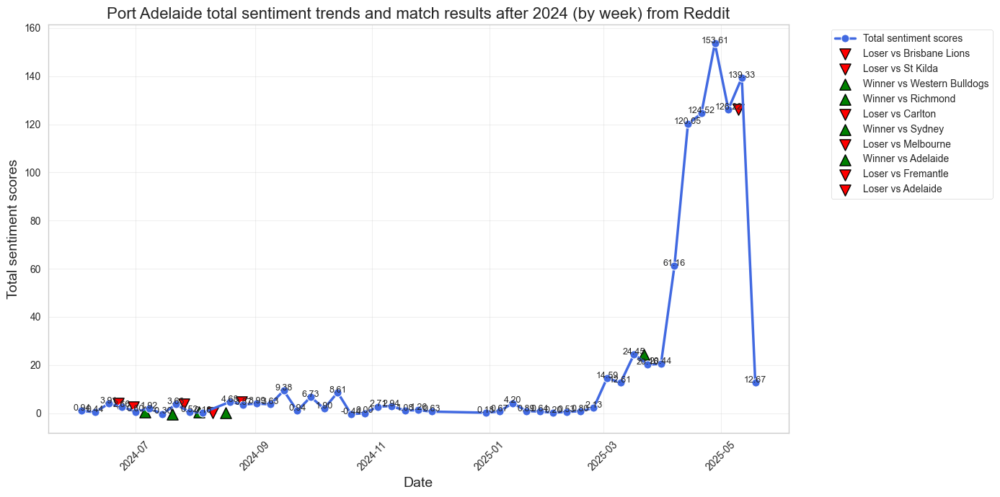

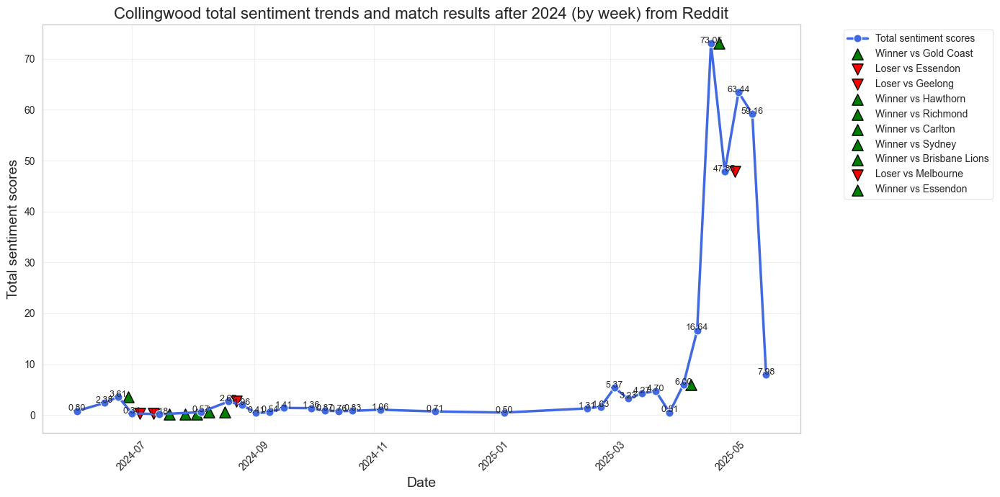

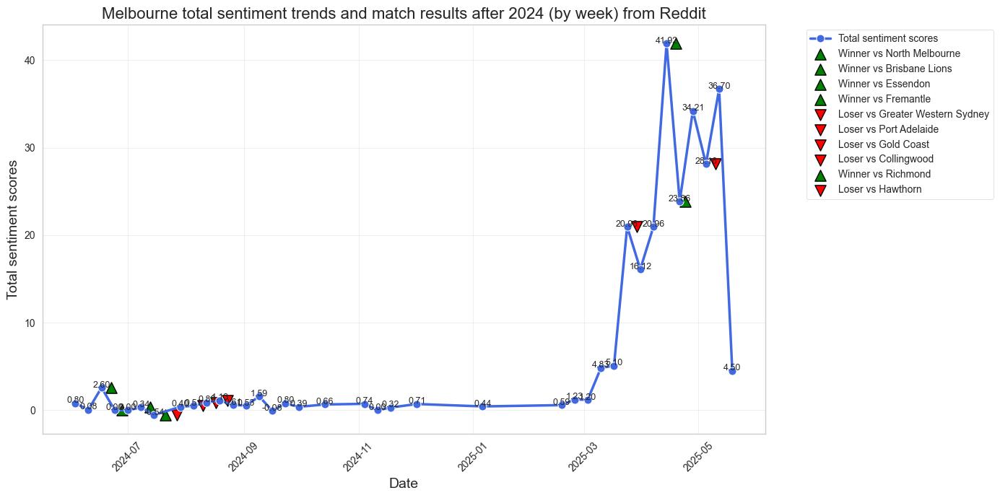

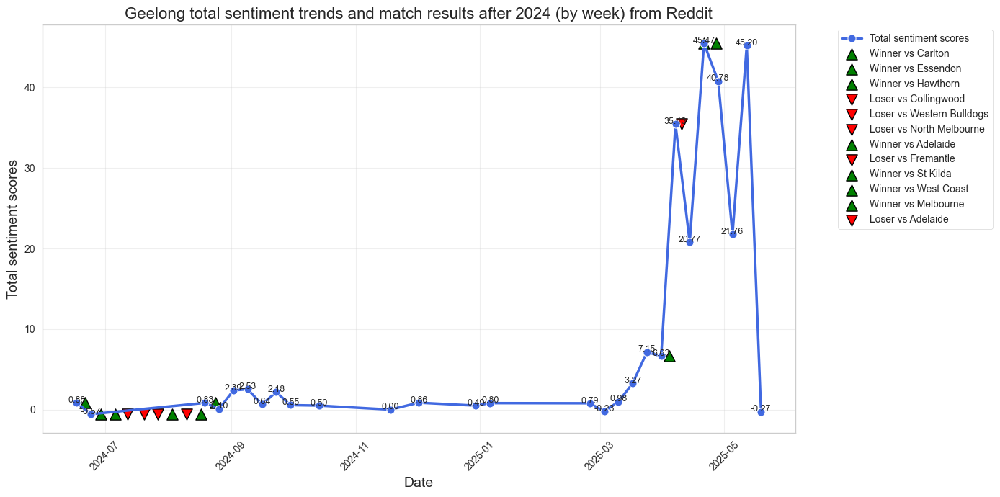

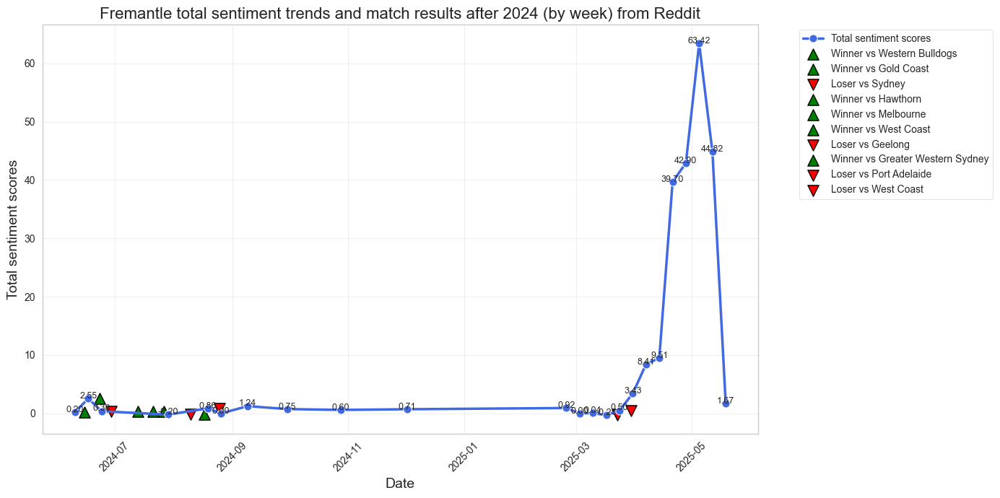

In [780]:
# Total sentiment trends and match results after 2024 (by week) for top 5 teams
response = requests.get('http://localhost:8080/afl/result/sentiment/reddit', headers={'X-Date-Format': 'week'})
data = response.json()

# Extract data
sentiment_data = data['sentiment_data']
all_teams = sentiment_data['all_teams']
top_teams_data = sentiment_data['top_5']
TEAM_MAPPING = data['team_mapping']
top_teams = [TEAM_MAPPING.get(t['name'], t['name']) for t in top_teams_data]

# Create a sentiment time series DataFrame and standardise the team names
time_dfs = []
for team in all_teams:
    df = pd.DataFrame(team['time_series'])
    standardised_name = TEAM_MAPPING.get(team['name'], team['name'])
    df['team'] = standardised_name
    time_dfs.append(df)
time_df = pd.concat(time_dfs)
time_df['date'] = pd.to_datetime(time_df['date'])
time_df = time_df[time_df['date'] >= '2024-01-01']

# Prepare match data and standardise team names
matches_df = pd.DataFrame(data['match_data'])
matches_df['date'] = pd.to_datetime(matches_df['date'].str.split().str[0])
matches_df['team'] = matches_df['team'].apply(lambda x: TEAM_MAPPING.get(x, x))

# Create a chart for each top 5 team
for team in top_teams:
    plt.figure(figsize=(14, 7))

    team_sentiment = time_df[time_df['team'] == team]
    if team_sentiment.empty:
        print(f"[Warning] cannot find sentiment data of {team}, skip.")
        continue

    sns.lineplot(x='date', y='total_sentiment', 
                 data=team_sentiment, 
                 color='royalblue',
                 linewidth=2.5,
                 marker='o',
                 markersize=8,
                 label='Total sentiment scores')

    team_matches = matches_df[matches_df['team'] == team].sort_values('date')
    for _, match in team_matches.iterrows():
        # Find the sentiment data point closest to the date before the game
        past_data = team_sentiment[team_sentiment['date'] <= match['date']]
        if past_data.empty:
            continue
        closest_idx = past_data['date'].idxmax()
        sentiment_value = team_sentiment.loc[closest_idx, 'total_sentiment']

        # Mark the results of the match
        if match['result'] == "Winner":
            marker = '^'
            color = 'green'
            label = f"Winner vs {match['opponent']}"
        elif match['result'] == "Loser":
            marker = 'v'
            color = 'red'
            label = f"Loser vs {match['opponent']}"
        else:
            marker = 'o'
            color = 'gray'
            label = f"Draw vs {match['opponent']}"

        plt.scatter(match['date'], sentiment_value,
                    marker=marker, color=color, s=120,
                    edgecolors='black', linewidths=1,
                    label=label)

    # Marking Values
    for _, row in team_sentiment.iterrows():
        plt.text(row['date'], row['total_sentiment'] + 0.03,
                 f"{row['total_sentiment']:.2f}",
                 fontsize=9, ha='center')

    plt.title(f'{team} total sentiment trends and match results after 2024 (by week) from Reddit', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Total sentiment scores', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)

    # Remove duplicate legends
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),
               bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

- Total sentiment trends and match results after 2024 (by week) for bottom 5 teams

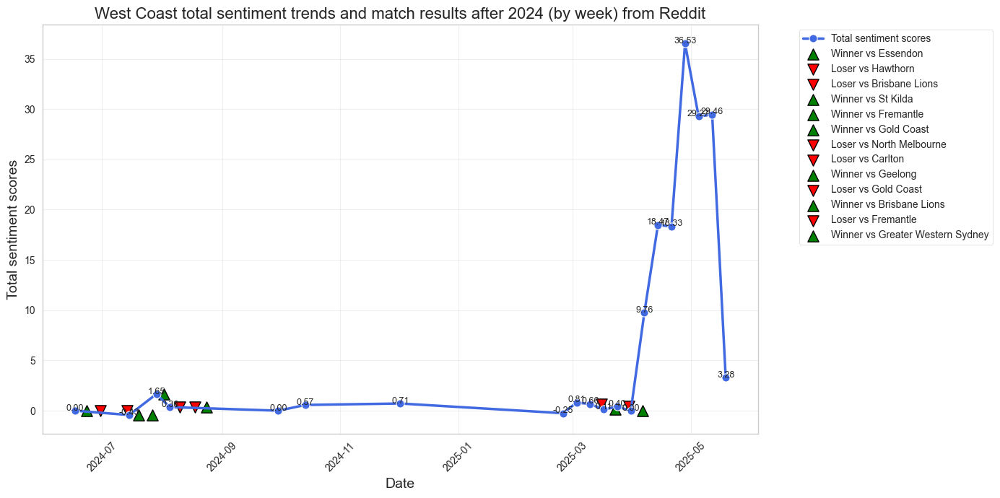

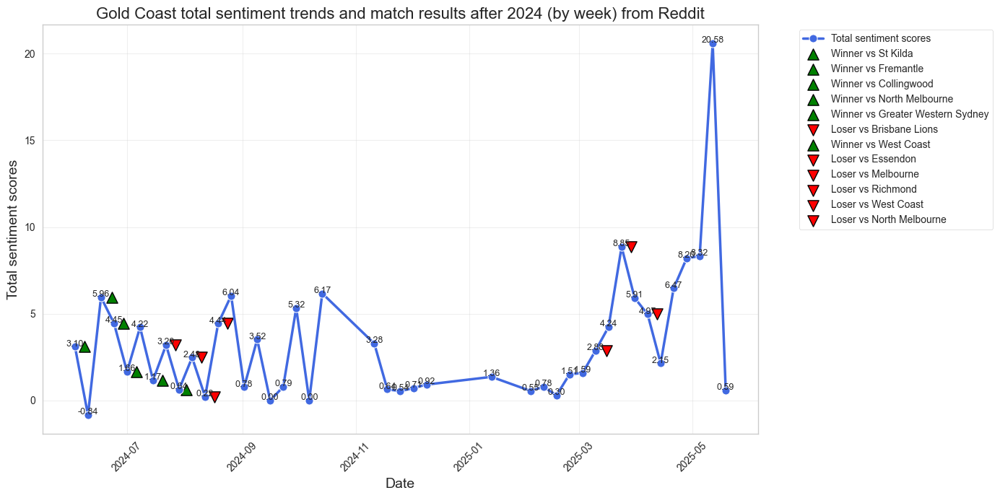

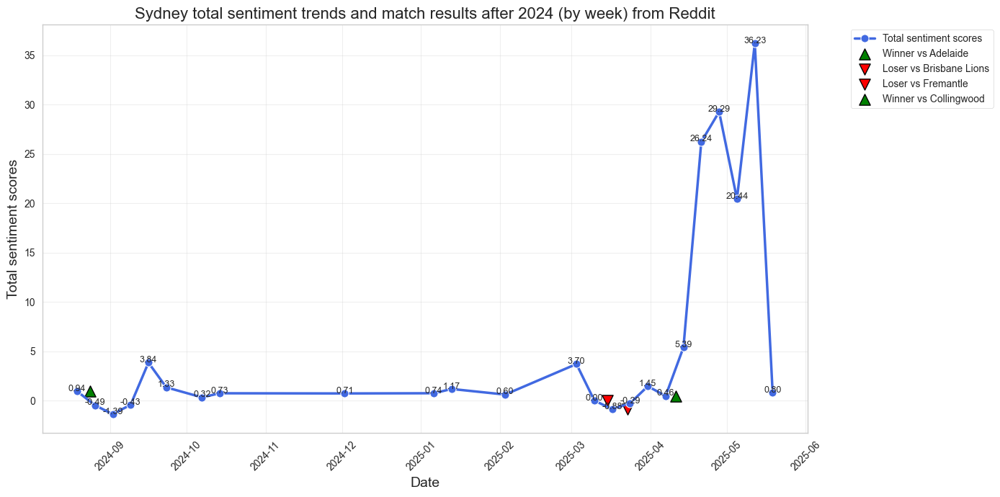

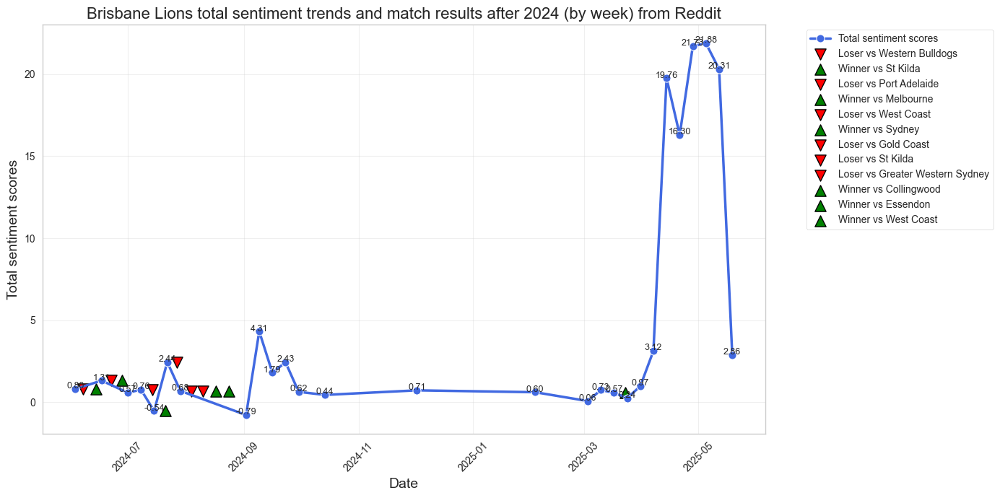

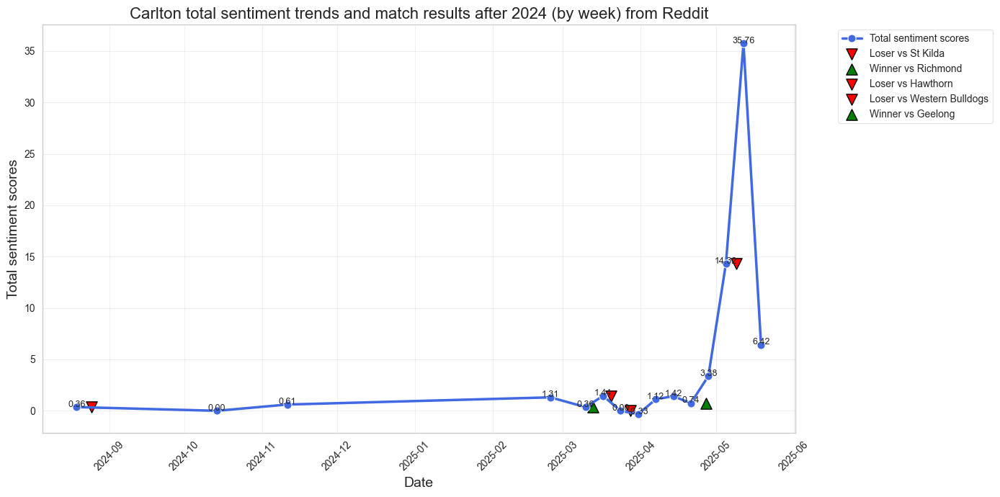

In [782]:
# Total sentiment trends and match results after 2024 (by week) for bottom 5 teams
response = requests.get('http://localhost:8080/afl/result/sentiment/reddit', headers={'X-Date-Format': 'week'})
data = response.json()

# Extract data
sentiment_data = data['sentiment_data']
all_teams = sentiment_data['all_teams']
bottom_teams_data = sentiment_data['bottom_5']
TEAM_MAPPING = data['team_mapping']
bottom_teams = [TEAM_MAPPING.get(t['name'], t['name']) for t in bottom_teams_data]

# Create a sentiment time series DataFrame and standardise the team names
time_dfs = []
for team in all_teams:
    df = pd.DataFrame(team['time_series'])
    standardised_name = TEAM_MAPPING.get(team['name'], team['name'])
    df['team'] = standardised_name
    time_dfs.append(df)
time_df = pd.concat(time_dfs)
time_df['date'] = pd.to_datetime(time_df['date'])
time_df = time_df[time_df['date'] >= '2024-01-01']

# Prepare match data and standardise team names
matches_df = pd.DataFrame(data['match_data'])
matches_df['date'] = pd.to_datetime(matches_df['date'].str.split().str[0])
matches_df['team'] = matches_df['team'].apply(lambda x: TEAM_MAPPING.get(x, x))

# Create a chart for each bottom 5 team
for team in bottom_teams:
    plt.figure(figsize=(14, 7))

    team_sentiment = time_df[time_df['team'] == team]
    if team_sentiment.empty:
        print(f"[Warning] cannot find sentiment data of {team}, skip.")
        continue

    sns.lineplot(x='date', y='total_sentiment', 
                 data=team_sentiment, 
                 color='royalblue',
                 linewidth=2.5,
                 marker='o',
                 markersize=8,
                 label='Total sentiment scores')

    team_matches = matches_df[matches_df['team'] == team].sort_values('date')
    for _, match in team_matches.iterrows():
        # Find the sentiment data point closest to the date before the game
        past_data = team_sentiment[team_sentiment['date'] <= match['date']]
        if past_data.empty:
            continue
        closest_idx = past_data['date'].idxmax()
        sentiment_value = team_sentiment.loc[closest_idx, 'total_sentiment']

        # Mark the results of the match
        if match['result'] == "Winner":
            marker = '^'
            color = 'green'
            label = f"Winner vs {match['opponent']}"
        elif match['result'] == "Loser":
            marker = 'v'
            color = 'red'
            label = f"Loser vs {match['opponent']}"
        else:
            marker = 'o'
            color = 'gray'
            label = f"Draw vs {match['opponent']}"

        plt.scatter(match['date'], sentiment_value,
                    marker=marker, color=color, s=120,
                    edgecolors='black', linewidths=1,
                    label=label)

    # Marking Values
    for _, row in team_sentiment.iterrows():
        plt.text(row['date'], row['total_sentiment'] + 0.03,
                 f"{row['total_sentiment']:.2f}",
                 fontsize=9, ha='center')

    plt.title(f'{team} total sentiment trends and match results after 2024 (by week) from Reddit', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Total sentiment scores', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)

    # Remove duplicate legends
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),
               bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

#### Bluesky
- Average sentiment trends and match results after 2024 (by week) for top 5 teams

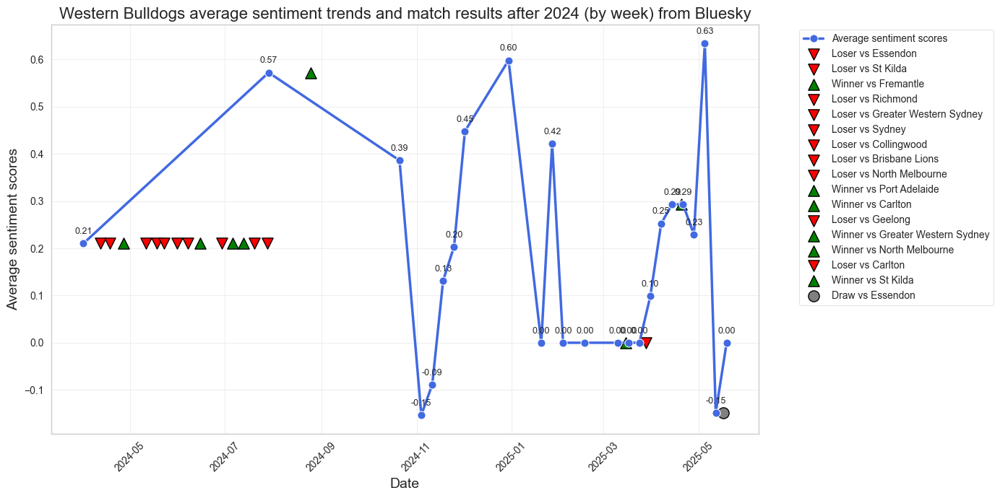

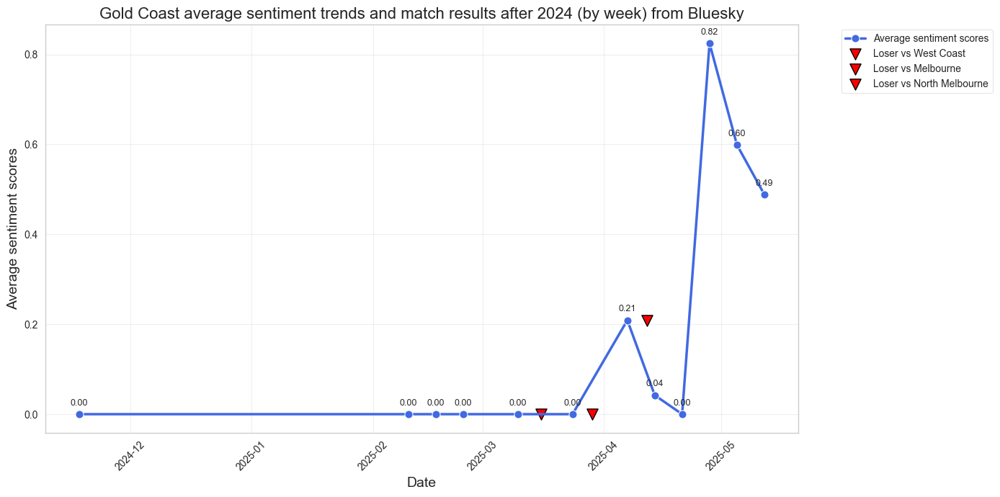

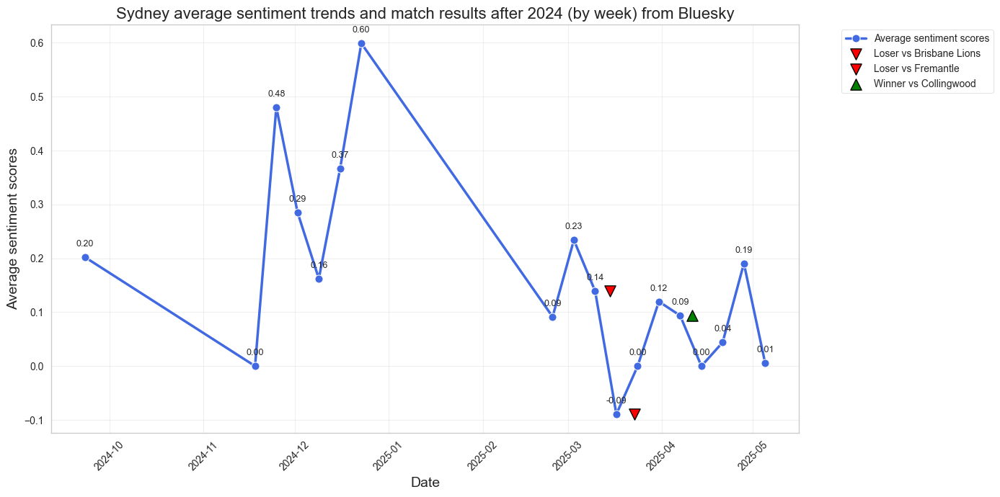

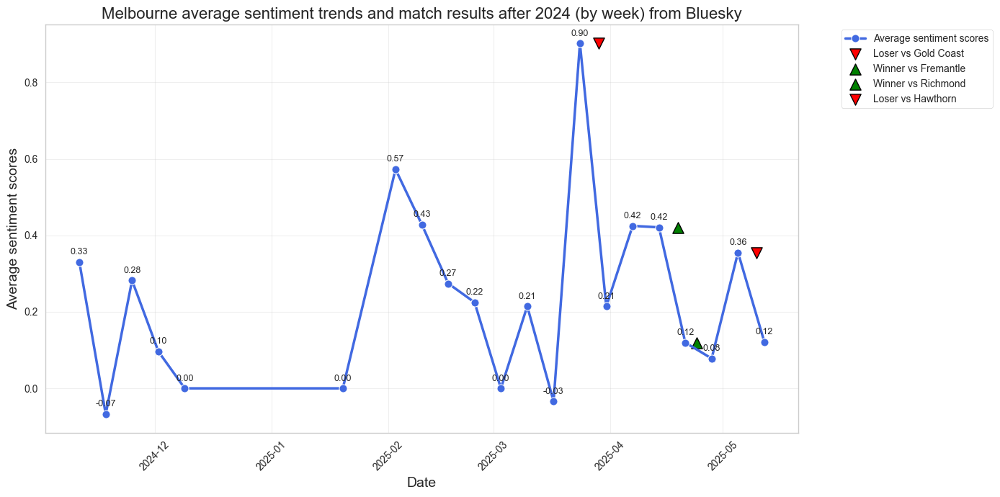

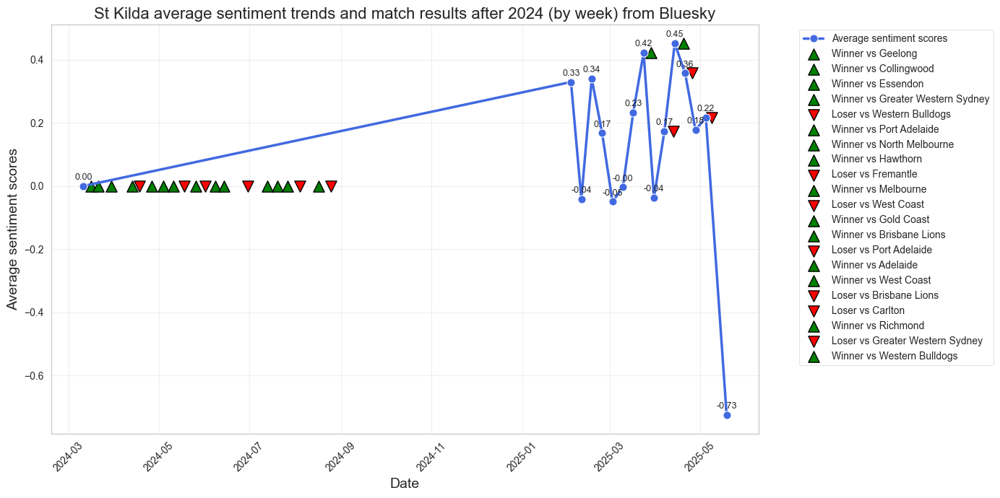

In [784]:
# Average sentiment trends and match results after 2024 (by week) for top 5 teams
response = requests.get('http://localhost:8080/afl/result/sentiment/bluesky', headers={'X-Date-Format': 'week'})
data = response.json()

# Extract data
sentiment_data = data['sentiment_data']
all_teams = sentiment_data['all_teams']
top_teams_data = sentiment_data['top_5']
TEAM_MAPPING = data['team_mapping']
top_teams = [TEAM_MAPPING.get(t['name'], t['name']) for t in top_teams_data]

# Create a sentiment time series DataFrame and standardise the team names
time_dfs = []
for team in all_teams:
    df = pd.DataFrame(team['time_series'])
    standardised_name = TEAM_MAPPING.get(team['name'], team['name'])
    df['team'] = standardised_name
    time_dfs.append(df)
time_df = pd.concat(time_dfs)
time_df['date'] = pd.to_datetime(time_df['date'])
time_df = time_df[time_df['date'] >= '2024-01-01']

# Prepare match data and standardise team names
matches_df = pd.DataFrame(data['match_data'])
matches_df['date'] = pd.to_datetime(matches_df['date'].str.split().str[0])
matches_df['team'] = matches_df['team'].apply(lambda x: TEAM_MAPPING.get(x, x))

# Create a chart for each top 5 team
for team in top_teams:
    plt.figure(figsize=(14, 7))

    team_sentiment = time_df[time_df['team'] == team]
    if team_sentiment.empty:
        print(f"[Warning] cannot find sentiment data of {team}, skip.")
        continue

    sns.lineplot(x='date', y='avg_sentiment', 
                 data=team_sentiment, 
                 color='royalblue',
                 linewidth=2.5,
                 marker='o',
                 markersize=8,
                 label='Average sentiment scores')

    team_matches = matches_df[matches_df['team'] == team].sort_values('date')
    for _, match in team_matches.iterrows():
        # Find the sentiment data point closest to the date before the game
        past_data = team_sentiment[team_sentiment['date'] <= match['date']]
        if past_data.empty:
            continue
        closest_idx = past_data['date'].idxmax()
        sentiment_value = team_sentiment.loc[closest_idx, 'avg_sentiment']

        # Mark the results of the match
        if match['result'] == "Winner":
            marker = '^'
            color = 'green'
            label = f"Winner vs {match['opponent']}"
        elif match['result'] == "Loser":
            marker = 'v'
            color = 'red'
            label = f"Loser vs {match['opponent']}"
        else:
            marker = 'o'
            color = 'gray'
            label = f"Draw vs {match['opponent']}"

        plt.scatter(match['date'], sentiment_value,
                    marker=marker, color=color, s=120,
                    edgecolors='black', linewidths=1,
                    label=label)

    # Marking Values
    for _, row in team_sentiment.iterrows():
        plt.text(row['date'], row['avg_sentiment'] + 0.02,
                 f"{row['avg_sentiment']:.2f}",
                 fontsize=9, ha='center')

    plt.title(f'{team} average sentiment trends and match results after 2024 (by week) from Bluesky', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Average sentiment scores', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)

    # Remove duplicate legends
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),
               bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

- Average sentiment trends and match results after 2024 (by week) for bottom 5 teams

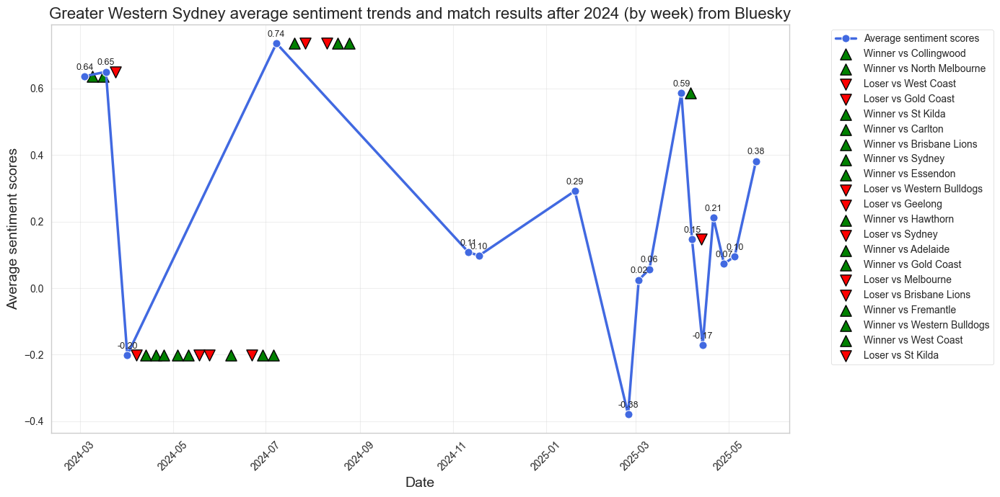

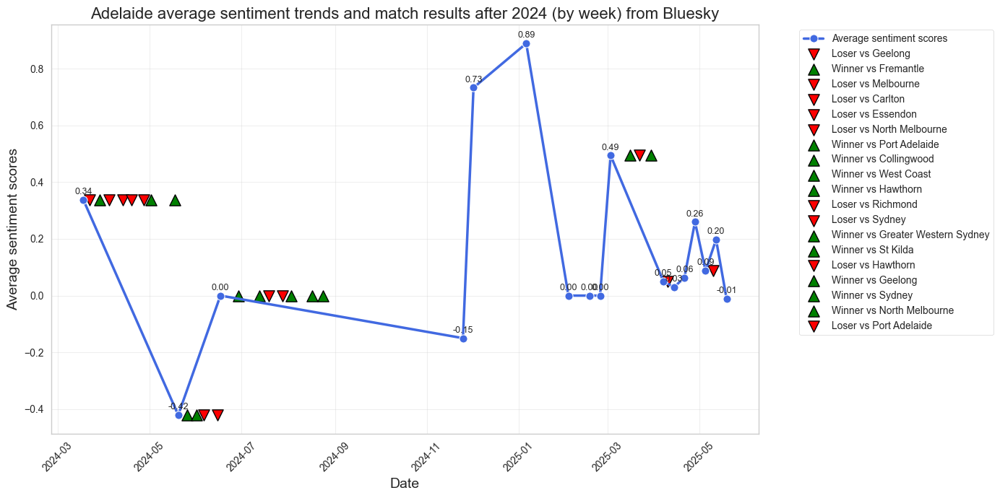

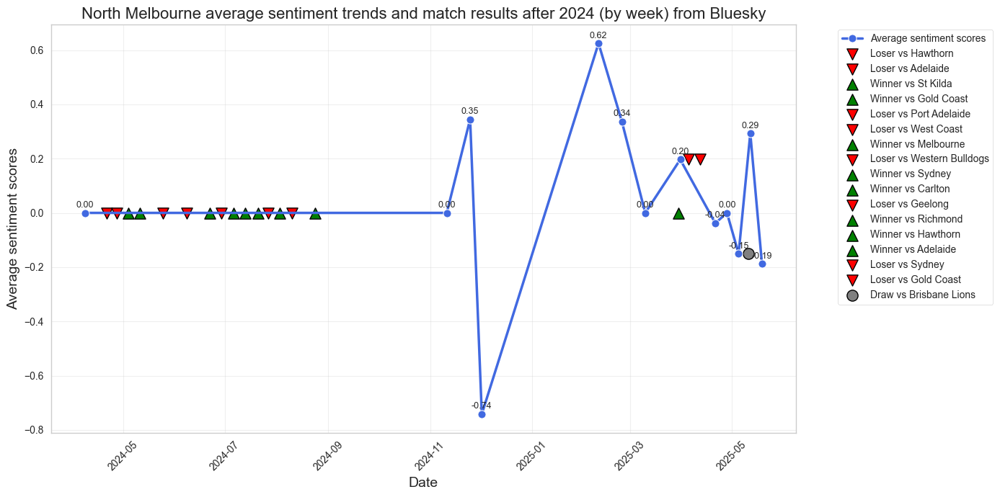

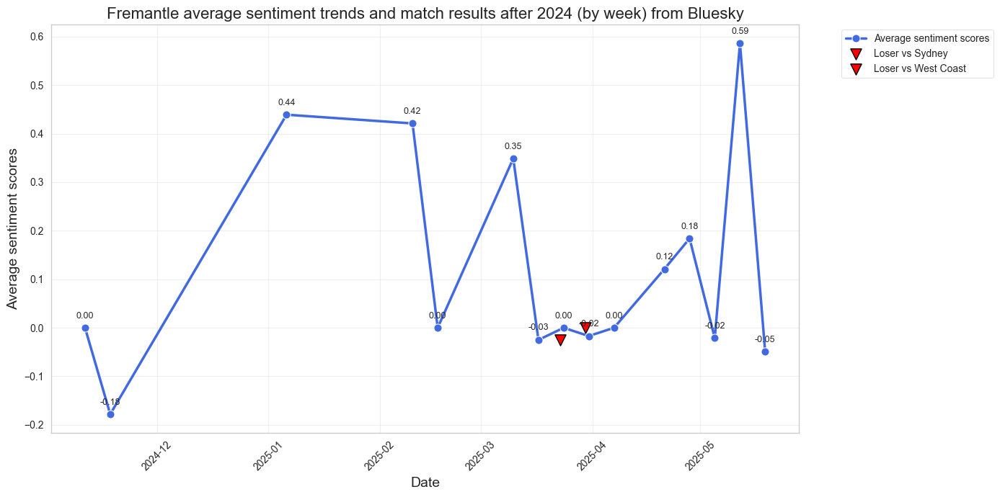

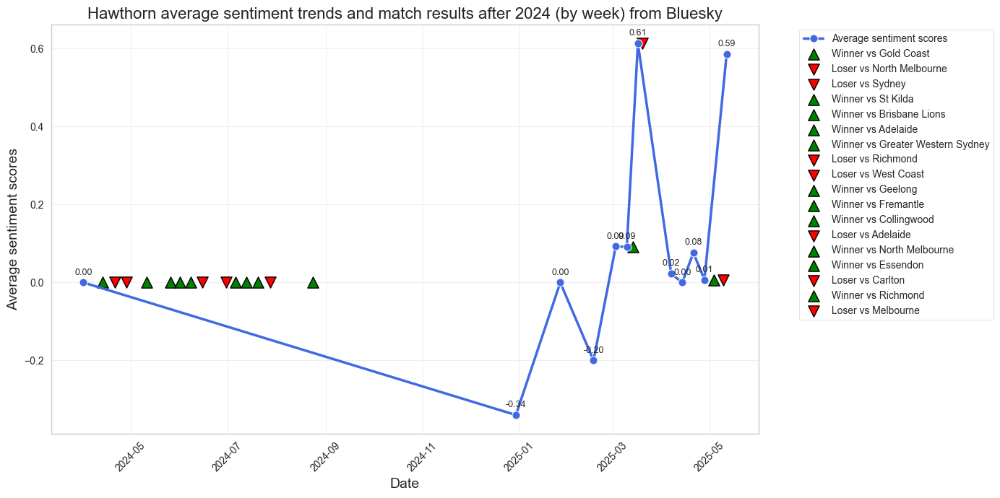

In [786]:
# Average sentiment trends and match results after 2024 (by week) for bottom 5 teams
response = requests.get('http://localhost:8080/afl/result/sentiment/bluesky', headers={'X-Date-Format': 'week'})
data = response.json()

# Extract data
sentiment_data = data['sentiment_data']
all_teams = sentiment_data['all_teams']
bottom_teams_data = sentiment_data['bottom_5']
TEAM_MAPPING = data['team_mapping']
bottom_teams = [TEAM_MAPPING.get(t['name'], t['name']) for t in bottom_teams_data]

# Create a sentiment time series DataFrame and standardise the team names
time_dfs = []
for team in all_teams:
    df = pd.DataFrame(team['time_series'])
    standardised_name = TEAM_MAPPING.get(team['name'], team['name'])
    df['team'] = standardised_name
    time_dfs.append(df)
time_df = pd.concat(time_dfs)
time_df['date'] = pd.to_datetime(time_df['date'])
time_df = time_df[time_df['date'] >= '2024-01-01']

# Prepare match data and standardise team names
matches_df = pd.DataFrame(data['match_data'])
matches_df['date'] = pd.to_datetime(matches_df['date'].str.split().str[0])
matches_df['team'] = matches_df['team'].apply(lambda x: TEAM_MAPPING.get(x, x))

# Create a chart for each bottom 5 team
for team in bottom_teams:
    plt.figure(figsize=(14, 7))

    team_sentiment = time_df[time_df['team'] == team]
    if team_sentiment.empty:
        print(f"[Warning] cannot find sentiment data of {team}, skip.")
        continue

    sns.lineplot(x='date', y='avg_sentiment', 
                 data=team_sentiment, 
                 color='royalblue',
                 linewidth=2.5,
                 marker='o',
                 markersize=8,
                 label='Average sentiment scores')

    team_matches = matches_df[matches_df['team'] == team].sort_values('date')
    for _, match in team_matches.iterrows():
        # Find the sentiment data point closest to the date before the game
        past_data = team_sentiment[team_sentiment['date'] <= match['date']]
        if past_data.empty:
            continue
        closest_idx = past_data['date'].idxmax()
        sentiment_value = team_sentiment.loc[closest_idx, 'avg_sentiment']

        # Mark the results of the match
        if match['result'] == "Winner":
            marker = '^'
            color = 'green'
            label = f"Winner vs {match['opponent']}"
        elif match['result'] == "Loser":
            marker = 'v'
            color = 'red'
            label = f"Loser vs {match['opponent']}"
        else:
            marker = 'o'
            color = 'gray'
            label = f"Draw vs {match['opponent']}"

        plt.scatter(match['date'], sentiment_value,
                    marker=marker, color=color, s=120,
                    edgecolors='black', linewidths=1,
                    label=label)

    # Marking Values
    for _, row in team_sentiment.iterrows():
        plt.text(row['date'], row['avg_sentiment'] + 0.02,
                 f"{row['avg_sentiment']:.2f}",
                 fontsize=9, ha='center')

    plt.title(f'{team} average sentiment trends and match results after 2024 (by week) from Bluesky', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Average sentiment scores', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)

    # Remove duplicate legends
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),
               bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

- Total sentiment trends and match results after 2024 (by week) for top 5 teams

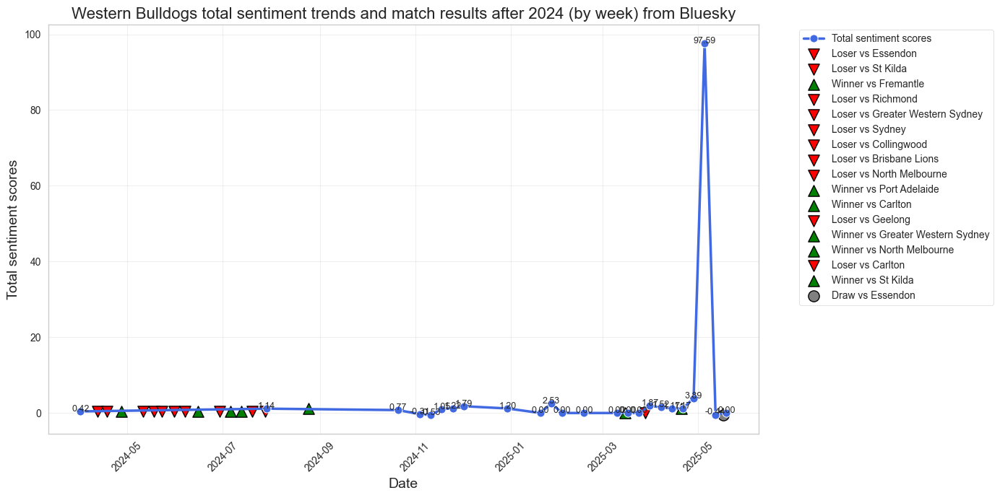

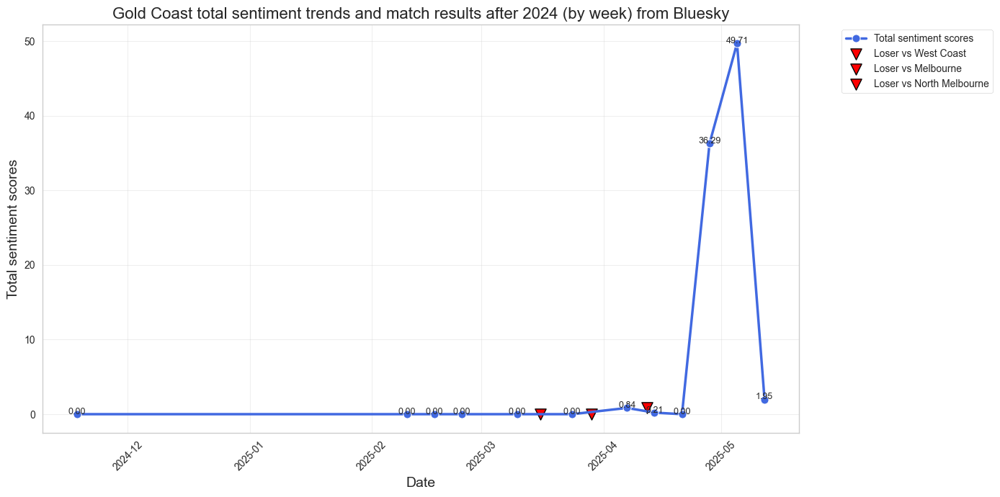

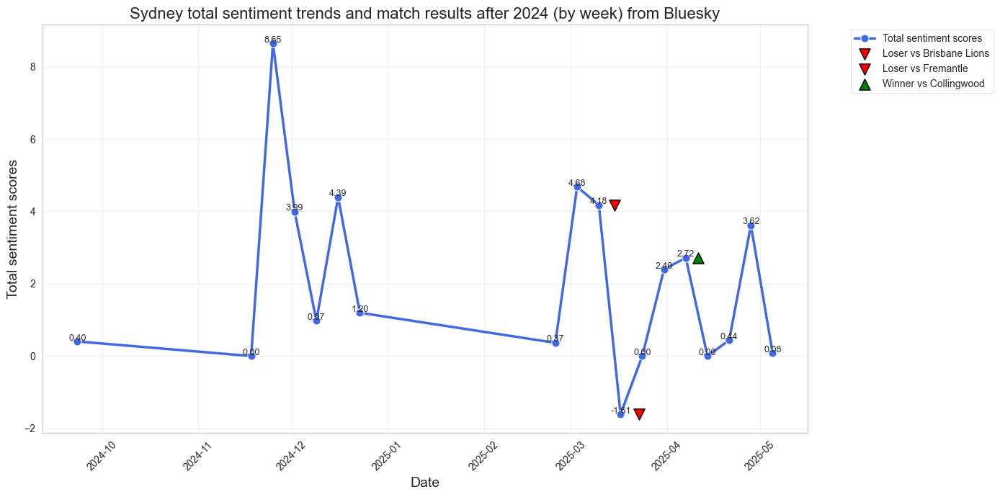

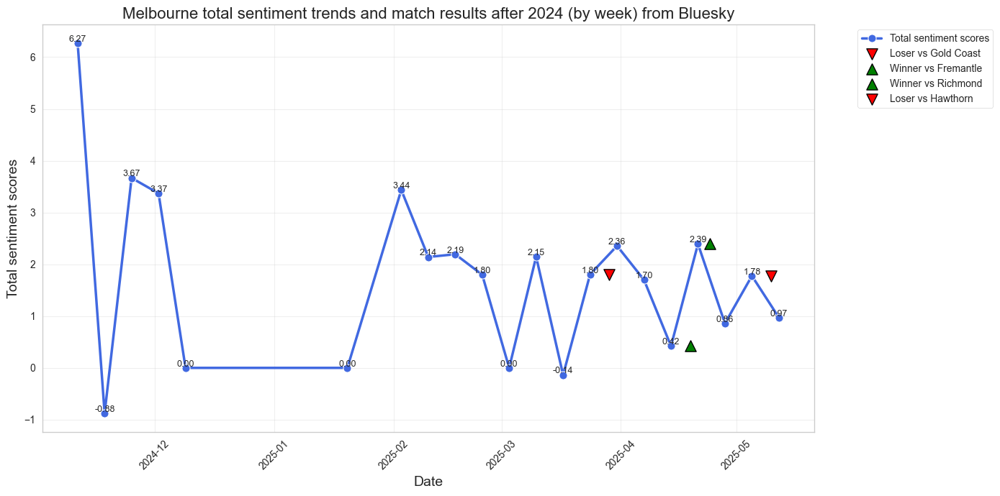

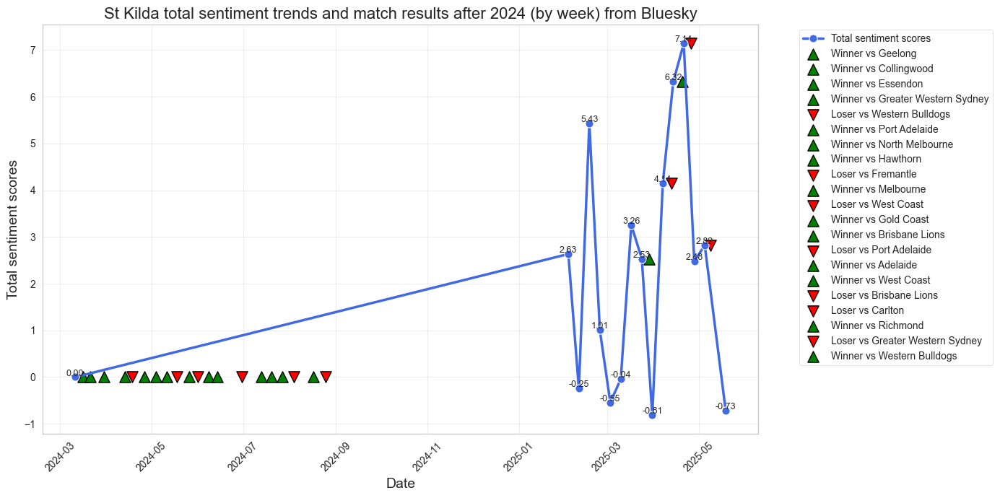

In [788]:
# Total sentiment trends and match results after 2024 (by week) for top 5 teams
response = requests.get('http://localhost:8080/afl/result/sentiment/bluesky', headers={'X-Date-Format': 'week'})
data = response.json()

# Extract data
sentiment_data = data['sentiment_data']
all_teams = sentiment_data['all_teams']
top_teams_data = sentiment_data['top_5']
TEAM_MAPPING = data['team_mapping']
top_teams = [TEAM_MAPPING.get(t['name'], t['name']) for t in top_teams_data]

# Create a sentiment time series DataFrame and standardise the team names
time_dfs = []
for team in all_teams:
    df = pd.DataFrame(team['time_series'])
    standardised_name = TEAM_MAPPING.get(team['name'], team['name'])
    df['team'] = standardised_name
    time_dfs.append(df)
time_df = pd.concat(time_dfs)
time_df['date'] = pd.to_datetime(time_df['date'])
time_df = time_df[time_df['date'] >= '2024-01-01']

# Prepare match data and standardise team names
matches_df = pd.DataFrame(data['match_data'])
matches_df['date'] = pd.to_datetime(matches_df['date'].str.split().str[0])
matches_df['team'] = matches_df['team'].apply(lambda x: TEAM_MAPPING.get(x, x))

# Create a chart for each top 5 team
for team in top_teams:
    plt.figure(figsize=(14, 7))

    team_sentiment = time_df[time_df['team'] == team]
    if team_sentiment.empty:
        print(f"[Warning] cannot find sentiment data of {team}, skip.")
        continue

    sns.lineplot(x='date', y='total_sentiment', 
                 data=team_sentiment, 
                 color='royalblue',
                 linewidth=2.5,
                 marker='o',
                 markersize=8,
                 label='Total sentiment scores')

    team_matches = matches_df[matches_df['team'] == team].sort_values('date')
    for _, match in team_matches.iterrows():
        # Find the sentiment data point closest to the date before the game
        past_data = team_sentiment[team_sentiment['date'] <= match['date']]
        if past_data.empty:
            continue
        closest_idx = past_data['date'].idxmax()
        sentiment_value = team_sentiment.loc[closest_idx, 'total_sentiment']

        # Mark the results of the match
        if match['result'] == "Winner":
            marker = '^'
            color = 'green'
            label = f"Winner vs {match['opponent']}"
        elif match['result'] == "Loser":
            marker = 'v'
            color = 'red'
            label = f"Loser vs {match['opponent']}"
        else:
            marker = 'o'
            color = 'gray'
            label = f"Draw vs {match['opponent']}"

        plt.scatter(match['date'], sentiment_value,
                    marker=marker, color=color, s=120,
                    edgecolors='black', linewidths=1,
                    label=label)

    # Marking Values
    for _, row in team_sentiment.iterrows():
        plt.text(row['date'], row['total_sentiment'] + 0.03,
                 f"{row['total_sentiment']:.2f}",
                 fontsize=9, ha='center')

    plt.title(f'{team} total sentiment trends and match results after 2024 (by week) from Bluesky', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Total sentiment scores', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)

    # Remove duplicate legends
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),
               bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

- Total sentiment trends and match results after 2024 (by week) for bottom 5 teams

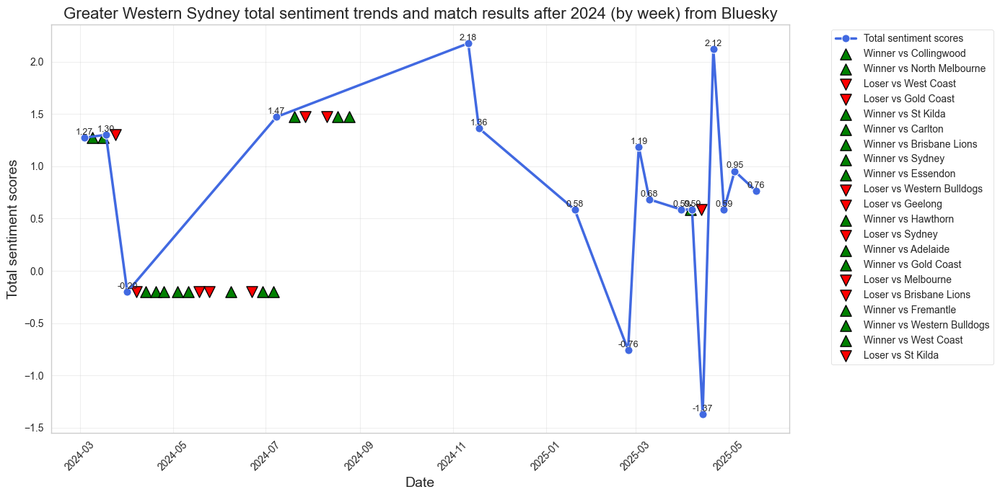

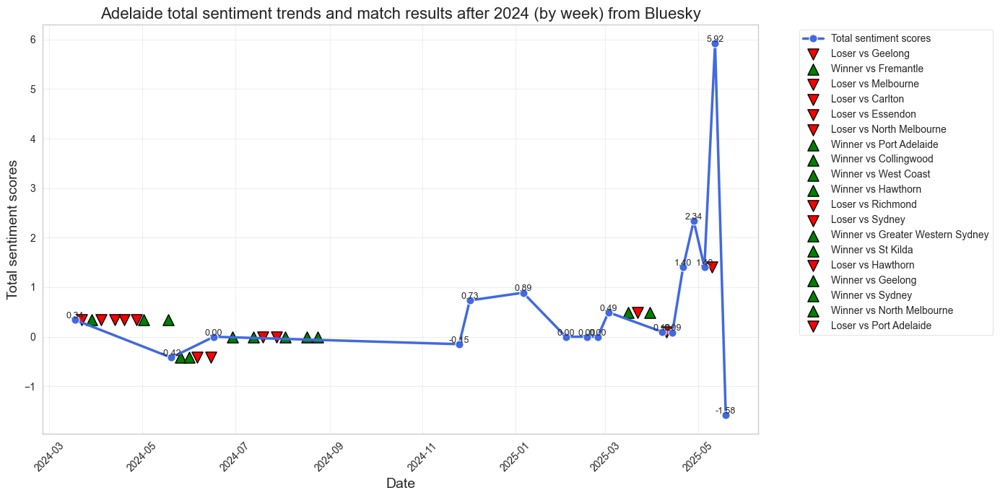

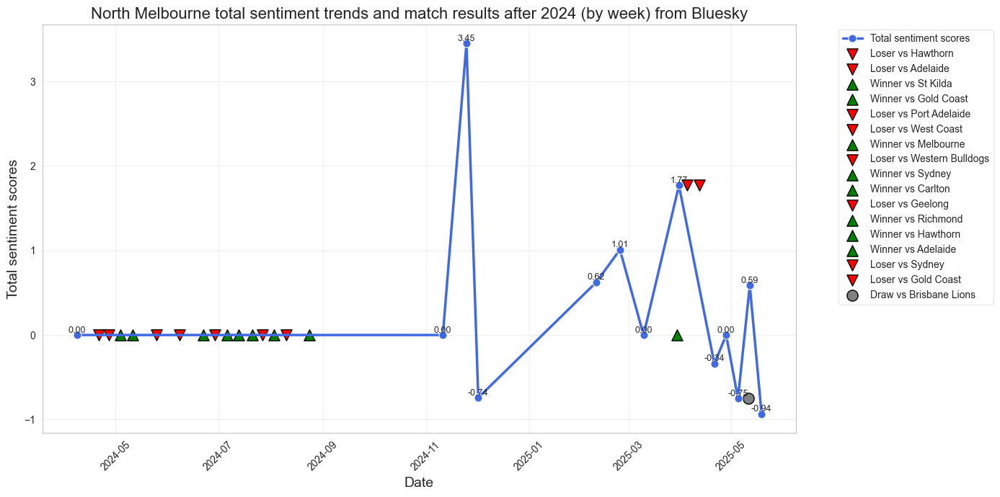

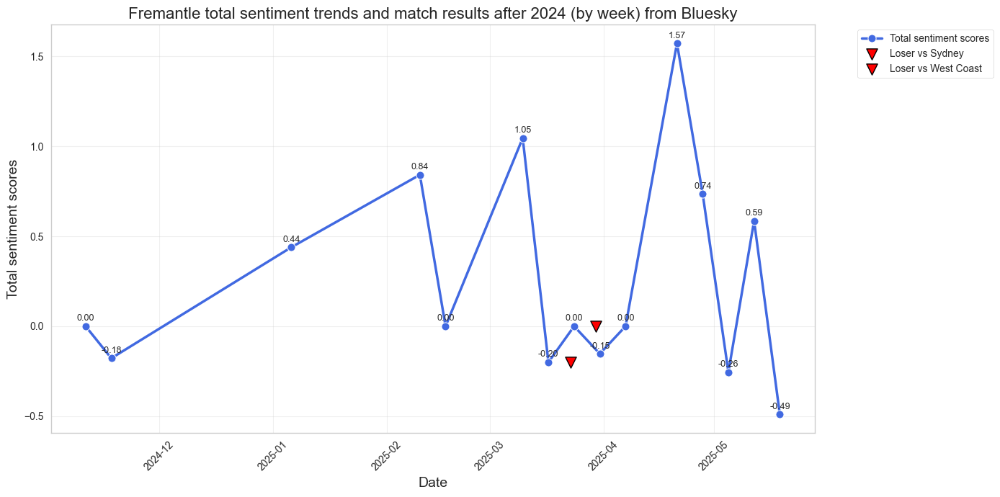

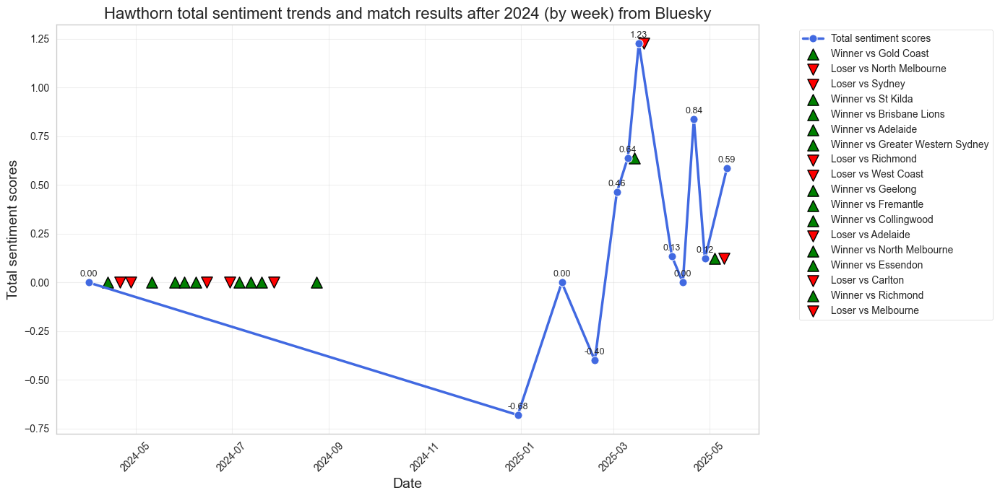

In [790]:
# Total sentiment trends and match results after 2024 (by week) for bottom 5 teams
response = requests.get('http://localhost:8080/afl/result/sentiment/bluesky', headers={'X-Date-Format': 'week'})
data = response.json()

# Extract data
sentiment_data = data['sentiment_data']
all_teams = sentiment_data['all_teams']
bottom_teams_data = sentiment_data['bottom_5']
TEAM_MAPPING = data['team_mapping']
bottom_teams = [TEAM_MAPPING.get(t['name'], t['name']) for t in bottom_teams_data]

# Create a sentiment time series DataFrame and standardise the team names
time_dfs = []
for team in all_teams:
    df = pd.DataFrame(team['time_series'])
    standardised_name = TEAM_MAPPING.get(team['name'], team['name'])
    df['team'] = standardised_name
    time_dfs.append(df)
time_df = pd.concat(time_dfs)
time_df['date'] = pd.to_datetime(time_df['date'])
time_df = time_df[time_df['date'] >= '2024-01-01']

# Prepare match data and standardise team names
matches_df = pd.DataFrame(data['match_data'])
matches_df['date'] = pd.to_datetime(matches_df['date'].str.split().str[0])
matches_df['team'] = matches_df['team'].apply(lambda x: TEAM_MAPPING.get(x, x))

# Create a chart for each bottom 5 team
for team in bottom_teams:
    plt.figure(figsize=(14, 7))

    team_sentiment = time_df[time_df['team'] == team]
    if team_sentiment.empty:
        print(f"[Warning] cannot find sentiment data of {team}, skip.")
        continue

    sns.lineplot(x='date', y='total_sentiment', 
                 data=team_sentiment, 
                 color='royalblue',
                 linewidth=2.5,
                 marker='o',
                 markersize=8,
                 label='Total sentiment scores')

    team_matches = matches_df[matches_df['team'] == team].sort_values('date')
    for _, match in team_matches.iterrows():
        # Find the sentiment data point closest to the date before the game
        past_data = team_sentiment[team_sentiment['date'] <= match['date']]
        if past_data.empty:
            continue
        closest_idx = past_data['date'].idxmax()
        sentiment_value = team_sentiment.loc[closest_idx, 'total_sentiment']

        # Mark the results of the match
        if match['result'] == "Winner":
            marker = '^'
            color = 'green'
            label = f"Winner vs {match['opponent']}"
        elif match['result'] == "Loser":
            marker = 'v'
            color = 'red'
            label = f"Loser vs {match['opponent']}"
        else:
            marker = 'o'
            color = 'gray'
            label = f"Draw vs {match['opponent']}"

        plt.scatter(match['date'], sentiment_value,
                    marker=marker, color=color, s=120,
                    edgecolors='black', linewidths=1,
                    label=label)

    # Marking Values
    for _, row in team_sentiment.iterrows():
        plt.text(row['date'], row['total_sentiment'] + 0.03,
                 f"{row['total_sentiment']:.2f}",
                 fontsize=9, ha='center')

    plt.title(f'{team} total sentiment trends and match results after 2024 (by week) from Bluesky', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Total sentiment scores', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)

    # Remove duplicate legends
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),
               bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

### 5. Cross-Platform Sentiment Trends and Match Win Rates Comparison in 2024 for Top/Bottom 5 Team
#### Reddit
- Total Sentiment Scores vs Win Rate for Top/Bottom 5 Team

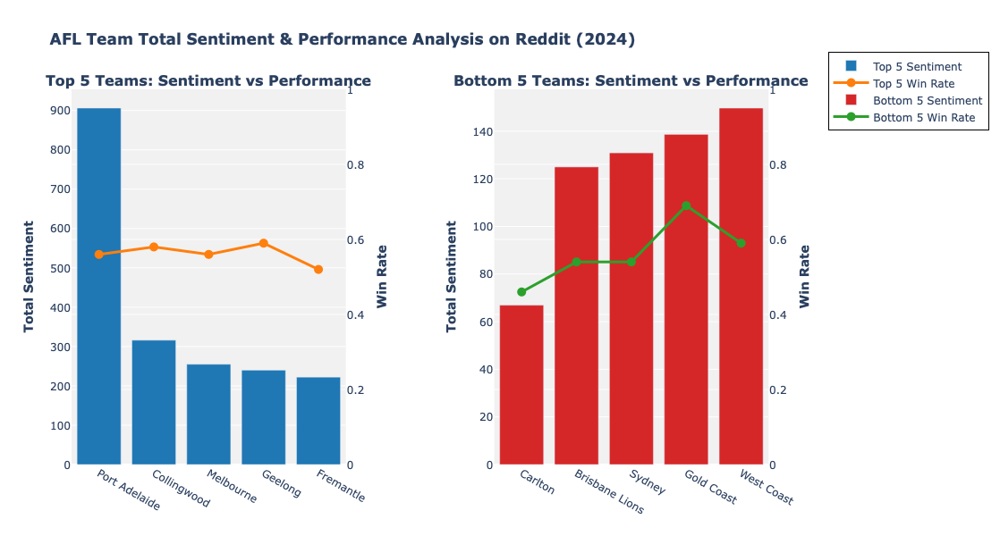

In [792]:
response = requests.get('http://localhost:8080/afl/sentiment/winloss/reddit')
data = response.json()

# Process data
teams_sentiment = data['all_teams']
matches_data = data['matches_data']
TEAM_MAPPING = data['team_mapping']

# Create analysis DataFrame
sentiment_df = pd.DataFrame(teams_sentiment)
sentiment_df['team_name'] = sentiment_df['name'].map(lambda x: TEAM_MAPPING.get(x, x))

match_list = [{'team': k, **v} for k, v in matches_data.items()]
match_df = pd.DataFrame(match_list)

analysis_df = pd.merge(
    sentiment_df,
    match_df,
    left_on='team_name',
    right_on='team',
    how='inner'
)

# Calculate correlation
corr, p_value = stats.pearsonr(analysis_df['total_sentiment'], analysis_df['win_rate'])

# Performance chart
fig8 = make_subplots(rows=1, cols=2, 
                   subplot_titles=(
                       "<b>Top 5 Teams: Sentiment vs Performance</b>",
                       "<b>Bottom 5 Teams: Sentiment vs Performance</b>"
                   ),
                   specs=[[{"secondary_y": True}, {"secondary_y": True}]])

# Top 5 Teams
top_df = analysis_df[analysis_df['team_name'].isin(data['top_5'])].sort_values('total_sentiment', ascending=False)
fig8.add_trace(
    go.Bar(
        x=top_df['team_name'],
        y=top_df['total_sentiment'],
        name='Top 5 Sentiment',
        marker_color='#1f77b4',
        hovertemplate='<b>%{x}</b><br>Total Sentiment: %{y:.0f}<extra></extra>'
    ),
    row=1, col=1,
    secondary_y=False
)

fig8.add_trace(
    go.Scatter(
        x=top_df['team_name'],
        y=top_df['win_rate'],
        name='Top 5 Win Rate',
        mode='lines+markers',
        line=dict(color='#ff7f0e', width=3),
        marker=dict(size=10),
        hovertemplate='<b>%{x}</b><br>Win Rate: %{y:.2f}<extra></extra>'
    ),
    row=1, col=1,
    secondary_y=True
)

# Bottom 5 Teams
bottom_df = analysis_df[analysis_df['team_name'].isin(data['bottom_5'])].sort_values('total_sentiment')
fig8.add_trace(
    go.Bar(
        x=bottom_df['team_name'],
        y=bottom_df['total_sentiment'],
        name='Bottom 5 Sentiment',
        marker_color='#d62728',
        hovertemplate='<b>%{x}</b><br>Total Sentiment: %{y:.0f}<extra></extra>'
    ),
    row=1, col=2,
    secondary_y=False
)

fig8.add_trace(
    go.Scatter(
        x=bottom_df['team_name'],
        y=bottom_df['win_rate'],
        name='Bottom 5 Win Rate',
        mode='lines+markers',
        line=dict(color='#2ca02c', width=3),
        marker=dict(size=10),
        hovertemplate='<b>%{x}</b><br>Win Rate: %{y:.2f}<extra></extra>'
    ),
    row=1, col=2,
    secondary_y=True
)

# Update layout
fig8.update_layout(
    plot_bgcolor='rgba(240,240,240,0.9)',
    title_text="<b>AFL Team Total Sentiment & Performance Analysis on Reddit (2024)</b>",
    height=600,
    hovermode="x unified",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=1.02,
        bordercolor="Black",
        borderwidth=1,
        itemwidth=40,
        font=dict(size=12)
    ),
    margin=dict(t=100, b=80, l=80, r=150)
)

# Set y-axes titles and ranges
fig8.update_yaxes(title_text="<b>Total Sentiment</b>", secondary_y=False, row=1, col=1)
fig8.update_yaxes(title_text="<b>Win Rate</b>", secondary_y=True, row=1, col=1, range=[0, 1])
fig8.update_yaxes(title_text="<b>Total Sentiment</b>", secondary_y=False, row=1, col=2)
fig8.update_yaxes(title_text="<b>Win Rate</b>", secondary_y=True, row=1, col=2, range=[0, 1])

fig8.show()

- Scatter plot of Total Sentiment vs Win Rate for Top/Bottom 5 Team

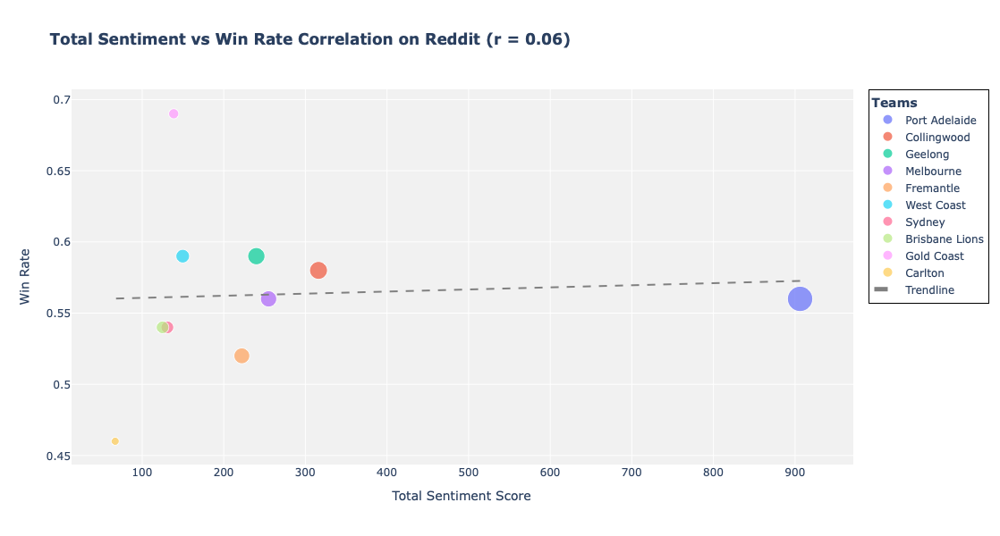

In [794]:
# Interactive Correlation Scatter Plot
fig9 = px.scatter(
    analysis_df,
    x='total_sentiment',
    y='win_rate',
    color='team_name',
    size='doc_count',
    hover_name='team_name',
    hover_data=['avg_sentiment', 'played', 'wins'],
    labels={
        'total_sentiment': 'Total Sentiment Score',
        'win_rate': 'Win Rate',
        'team_name': 'Team',
        'doc_count': 'Post Count',
        'avg_sentiment': 'Avg Sentiment'
    },
    title=f"<b>Total Sentiment vs Win Rate Correlation on Reddit (r = {corr:.2f})</b>",
    height=600,
    color_discrete_sequence=px.colors.qualitative.Plotly
)

# Add trendline
fig9.add_trace(
    go.Scatter(
        x=analysis_df['total_sentiment'],
        y=stats.linregress(analysis_df['total_sentiment'], analysis_df['win_rate']).intercept + 
           stats.linregress(analysis_df['total_sentiment'], analysis_df['win_rate']).slope * 
           analysis_df['total_sentiment'],
        mode='lines',
        line=dict(color='gray', dash='dash'),
        name='Trendline'
    )
)

# Update layout
fig9.update_layout(
    plot_bgcolor='rgba(240,240,240,0.9)',
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    ),
    xaxis=dict(
        gridcolor='white',
        showgrid=True
    ),
    yaxis=dict(
        gridcolor='white',
        showgrid=True
    ),
    legend=dict(
        title_text='<b>Teams</b>',
        orientation="v",  # Vertical orientation
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.02,  # Position outside the plot area
        bordercolor="Black",
        borderwidth=1,
        itemwidth=30,  
        itemsizing='constant'  
    ),
    margin=dict(r=120) 
)

fig9.show()

#### Bluesky
- Total Sentiment Scores vs Win Rate for Top/Bottom 5 Team

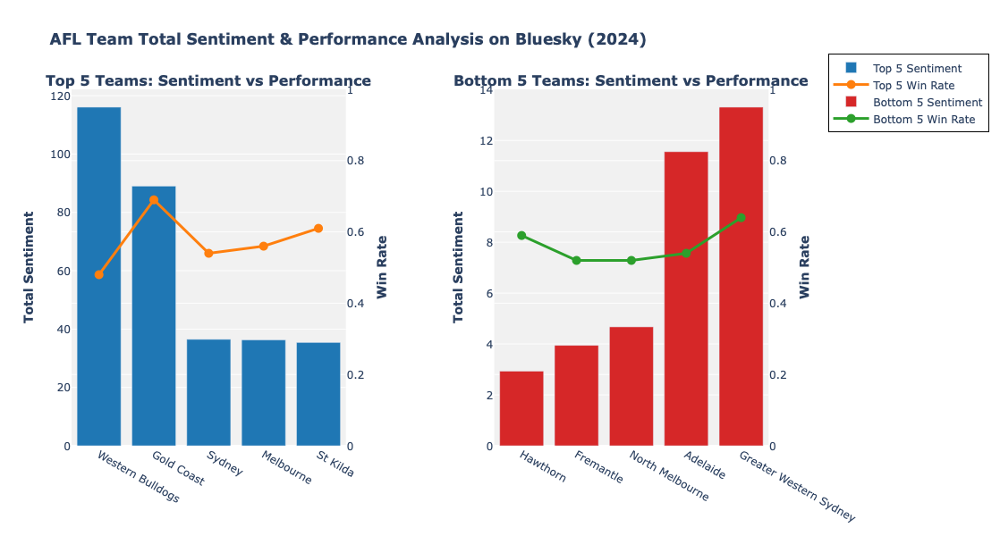

In [796]:
response = requests.get('http://localhost:8080/afl/sentiment/winloss/bluesky')
data = response.json()

# Process data
teams_sentiment = data['all_teams']
matches_data = data['matches_data']
TEAM_MAPPING = data['team_mapping']

# Create analysis DataFrame
sentiment_df = pd.DataFrame(teams_sentiment)
sentiment_df['team_name'] = sentiment_df['name'].map(lambda x: TEAM_MAPPING.get(x, x))

match_list = [{'team': k, **v} for k, v in matches_data.items()]
match_df = pd.DataFrame(match_list)

analysis_df = pd.merge(
    sentiment_df,
    match_df,
    left_on='team_name',
    right_on='team',
    how='inner'
)

# Calculate correlation
corr, p_value = stats.pearsonr(analysis_df['total_sentiment'], analysis_df['win_rate'])

# Performance chart
fig10 = make_subplots(rows=1, cols=2, 
                   subplot_titles=(
                       "<b>Top 5 Teams: Sentiment vs Performance</b>",
                       "<b>Bottom 5 Teams: Sentiment vs Performance</b>"
                   ),
                   specs=[[{"secondary_y": True}, {"secondary_y": True}]])

# Top 5 Teams
top_df = analysis_df[analysis_df['team_name'].isin(data['top_5'])].sort_values('total_sentiment', ascending=False)
fig10.add_trace(
    go.Bar(
        x=top_df['team_name'],
        y=top_df['total_sentiment'],
        name='Top 5 Sentiment',
        marker_color='#1f77b4',
        hovertemplate='<b>%{x}</b><br>Total Sentiment: %{y:.0f}<extra></extra>'
    ),
    row=1, col=1,
    secondary_y=False
)

fig10.add_trace(
    go.Scatter(
        x=top_df['team_name'],
        y=top_df['win_rate'],
        name='Top 5 Win Rate',
        mode='lines+markers',
        line=dict(color='#ff7f0e', width=3),
        marker=dict(size=10),
        hovertemplate='<b>%{x}</b><br>Win Rate: %{y:.2f}<extra></extra>'
    ),
    row=1, col=1,
    secondary_y=True
)

# Bottom 5 Teams
bottom_df = analysis_df[analysis_df['team_name'].isin(data['bottom_5'])].sort_values('total_sentiment')
fig10.add_trace(
    go.Bar(
        x=bottom_df['team_name'],
        y=bottom_df['total_sentiment'],
        name='Bottom 5 Sentiment',
        marker_color='#d62728',
        hovertemplate='<b>%{x}</b><br>Total Sentiment: %{y:.0f}<extra></extra>'
    ),
    row=1, col=2,
    secondary_y=False
)

fig10.add_trace(
    go.Scatter(
        x=bottom_df['team_name'],
        y=bottom_df['win_rate'],
        name='Bottom 5 Win Rate',
        mode='lines+markers',
        line=dict(color='#2ca02c', width=3),
        marker=dict(size=10),
        hovertemplate='<b>%{x}</b><br>Win Rate: %{y:.2f}<extra></extra>'
    ),
    row=1, col=2,
    secondary_y=True
)

# Update layout
fig10.update_layout(
    plot_bgcolor='rgba(240,240,240,0.9)',
    title_text="<b>AFL Team Total Sentiment & Performance Analysis on Bluesky (2024)</b>",
    height=600,
    hovermode="x unified",
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=1.02,
        bordercolor="Black",
        borderwidth=1,
        itemwidth=40,
        font=dict(size=12)
    ),
    margin=dict(t=100, b=80, l=80, r=150)
)

# Set y-axes titles and ranges
fig10.update_yaxes(title_text="<b>Total Sentiment</b>", secondary_y=False, row=1, col=1)
fig10.update_yaxes(title_text="<b>Win Rate</b>", secondary_y=True, row=1, col=1, range=[0, 1])
fig10.update_yaxes(title_text="<b>Total Sentiment</b>", secondary_y=False, row=1, col=2)
fig10.update_yaxes(title_text="<b>Win Rate</b>", secondary_y=True, row=1, col=2, range=[0, 1])

fig10.show()

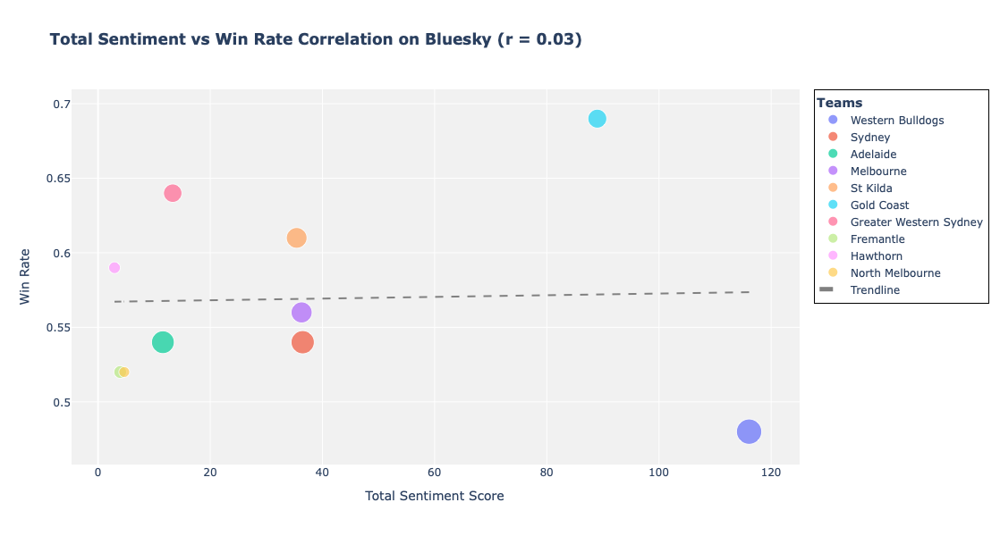

In [797]:
# Interactive Correlation Scatter Plot
fig11 = px.scatter(
    analysis_df,
    x='total_sentiment',
    y='win_rate',
    color='team_name',
    size='doc_count',
    hover_name='team_name',
    hover_data=['avg_sentiment', 'played', 'wins'],
    labels={
        'total_sentiment': 'Total Sentiment Score',
        'win_rate': 'Win Rate',
        'team_name': 'Team',
        'doc_count': 'Post Count',
        'avg_sentiment': 'Avg Sentiment'
    },
    title=f"<b>Total Sentiment vs Win Rate Correlation on Bluesky (r = {corr:.2f})</b>",
    height=600,
    color_discrete_sequence=px.colors.qualitative.Plotly
)

# Add trendline
fig11.add_trace(
    go.Scatter(
        x=analysis_df['total_sentiment'],
        y=stats.linregress(analysis_df['total_sentiment'], analysis_df['win_rate']).intercept + 
           stats.linregress(analysis_df['total_sentiment'], analysis_df['win_rate']).slope * 
           analysis_df['total_sentiment'],
        mode='lines',
        line=dict(color='gray', dash='dash'),
        name='Trendline'
    )
)

# Update layout
fig11.update_layout(
    plot_bgcolor='rgba(240,240,240,0.9)',
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    ),
    xaxis=dict(
        gridcolor='white',
        showgrid=True
    ),
    yaxis=dict(
        gridcolor='white',
        showgrid=True
    ),
    legend=dict(
        title_text='<b>Teams</b>',
        orientation="v",  # Vertical orientation
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.02,  # Position outside the plot area
        bordercolor="Black",
        borderwidth=1,
        itemwidth=30,  
        itemsizing='constant'  
    ),
    margin=dict(r=120) 
)

fig11.show()

### 6. Home Advantage Analytics

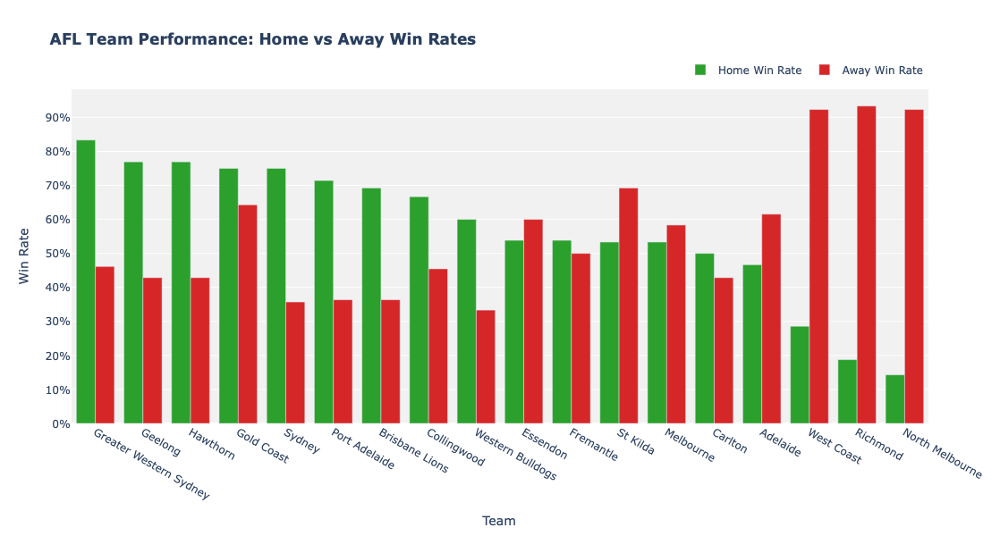

In [799]:
response = requests.get('http://localhost:8080/afl/result/home')
data = response.json()

# Create DataFrame
df = pd.DataFrame(data['teams_performance'])

# Sort by home win rate
df = df.sort_values('home_win_rate', ascending=False)

# Create interactive visualization
fig12 = make_subplots(specs=[[{"secondary_y": False}]])

# Add home win rate bars
fig12.add_trace(
    go.Bar(
        x=df['team'],
        y=df['home_win_rate'],
        name='Home Win Rate',
        marker_color='#2ca02c',  # Green
        hovertemplate='<b>%{x}</b><br>Home Win Rate: %{y:.1%}<br>Games: %{customdata[0]}<extra></extra>',
        customdata=df[['home_games']],
        width=0.4
    )
)

# Add away win rate bars
fig12.add_trace(
    go.Bar(
        x=df['team'],
        y=df['away_win_rate'],
        name='Away Win Rate',
        marker_color='#d62728',  # Red
        hovertemplate='<b>%{x}</b><br>Away Win Rate: %{y:.1%}<br>Games: %{customdata[0]}<extra></extra>',
        customdata=df[['away_games']],
        width=0.4
    )
)

# Update layout
fig12.update_layout(
    title='<b>AFL Team Performance: Home vs Away Win Rates</b>',
    xaxis_title="Team",
    yaxis_title="Win Rate",
    yaxis_tickformat=".0%",
    barmode='group',
    height=600,
    plot_bgcolor='rgba(240,240,240,0.9)',
    hoverlabel=dict(
        bgcolor="white",
        font_size=12,
        font_family="Arial"
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    margin=dict(t=100, b=100, l=80, r=80)
)

fig12.show()

### 7. Cross-Platform Subscribers Comparison: Top/Bottom 5 Teams by Number of Subscribers
#### Reddit

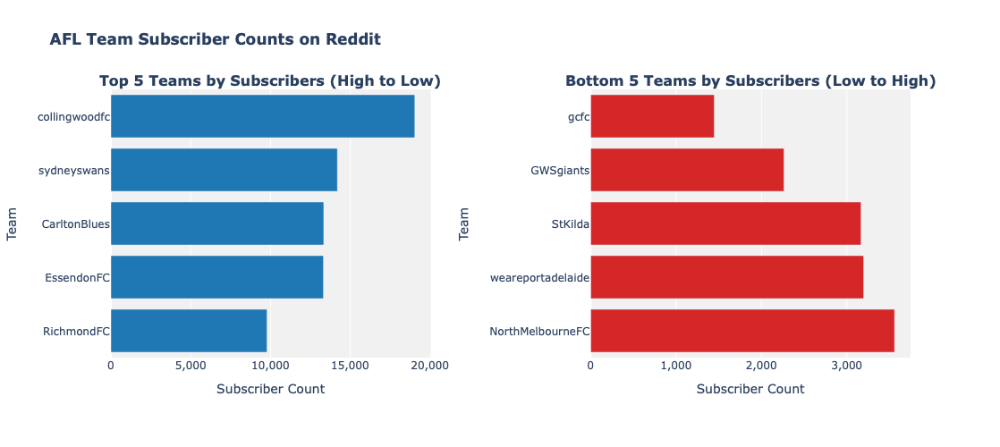

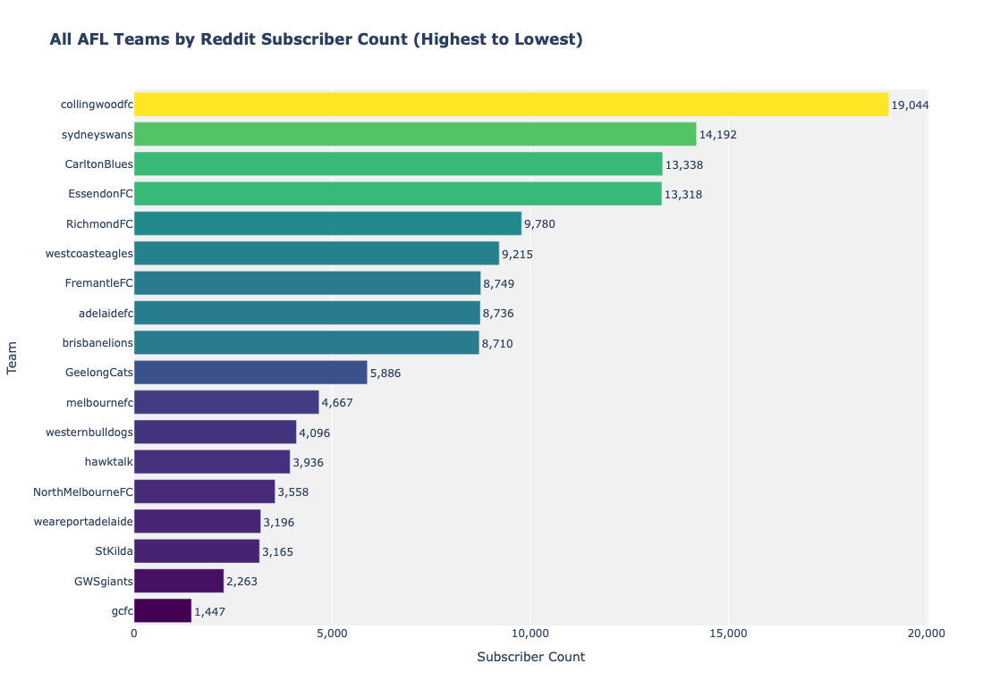

In [801]:
response = requests.get('http://localhost:8080/afl/subscribers/reddit')
data = response.json()

if 'top_5_teams_subscribers' not in data:
    print("Error:", data.get('error', 'data error'))
else:
    # Create and sort DataFrames
    top_df = pd.DataFrame(data['top_5_teams_subscribers']).sort_values('subscribers', ascending=False)
    bottom_df = pd.DataFrame(data['bottom_5_teams_subscribers']).sort_values('subscribers', ascending=True)
    all_df = pd.DataFrame(data['all_teams_subscribers'])
    all_df_sorted = all_df.sort_values('subscribers', ascending=False)
    
    # Top/Bottom Teams Comparison
    fig13 = make_subplots(
        rows=1, 
        cols=2, 
        subplot_titles=(
            '<b>Top 5 Teams by Subscribers (High to Low)</b>', 
            '<b>Bottom 5 Teams by Subscribers (Low to High)</b>'
        ),
        horizontal_spacing=0.2,  
        column_widths=[0.5, 0.5]  
    )
    
    # Add top teams data
    fig13.add_trace(
        go.Bar(
            y=top_df['name'],
            x=top_df['subscribers'],
            name='Most Subscribers',
            orientation='h',
            marker_color='#1f77b4',
            hovertemplate='<b>%{y}</b><br>Subscribers: %{x:,}<extra></extra>'
        ),
        row=1, 
        col=1
    )
    
    # Add bottom teams data
    fig13.add_trace(
        go.Bar(
            y=bottom_df['name'],
            x=bottom_df['subscribers'],
            name='Least Subscribers',
            orientation='h',
            marker_color='#d62728',
            hovertemplate='<b>%{y}</b><br>Subscribers: %{x:,}<extra></extra>'
        ),
        row=1, 
        col=2
    )
    
    # Update layout 
    fig13.update_layout(
        plot_bgcolor='rgba(240,240,240,0.9)',
        title_text='<b>AFL Team Subscriber Counts on Reddit</b>',
        height=500,
        showlegend=False,
        margin=dict(t=100, b=100, l=100, r=100),  
        xaxis_title="Subscriber Count",
        xaxis2_title="Subscriber Count",
        yaxis_title=dict(text="Team", standoff=20),  
        yaxis2_title=dict(text="Team", standoff=20),  
        yaxis={'categoryorder':'total ascending'},
        yaxis2={'categoryorder':'total descending'}
    )
    
    # Format x-axes
    fig13.update_xaxes(tickformat=",", row=1, col=1)
    fig13.update_xaxes(tickformat=",", row=1, col=2)
    
    fig13.show()

    # All Teams Visualisation (sorted high to low)
    fig14 = px.bar(
        all_df_sorted,  
        x='subscribers',
        y='name',
        orientation='h',
        color='subscribers',
        color_continuous_scale='Viridis',
        labels={'subscribers': 'Subscriber Count', 'name': 'Team'},
        title='<b>All AFL Teams by Reddit Subscriber Count (Highest to Lowest)</b>',
        height=600 + len(all_df)*10  
    )

    # Update layout
    fig14.update_layout(
        plot_bgcolor='rgba(240,240,240,0.9)',
        xaxis=dict(tickformat=","),
        yaxis={'categoryorder':'total ascending'},  
        coloraxis_showscale=False,
        hoverlabel=dict(bgcolor="white", font_size=12)
    )

    # Add value labels
    fig14.update_traces(
        texttemplate='%{x:,}',
        textposition='outside',
        hovertemplate='<b>%{y}</b><br>Subscribers: %{x:,}<extra></extra>'
    )

    fig14.show()

#### Bluesky

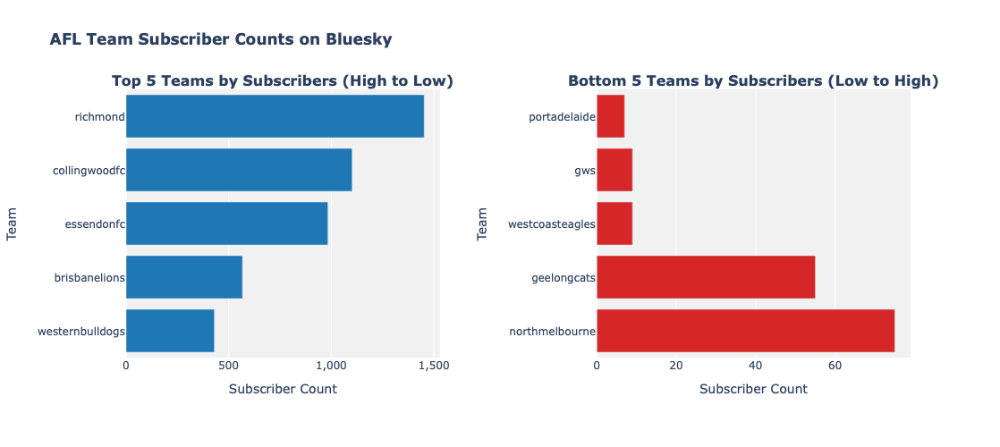

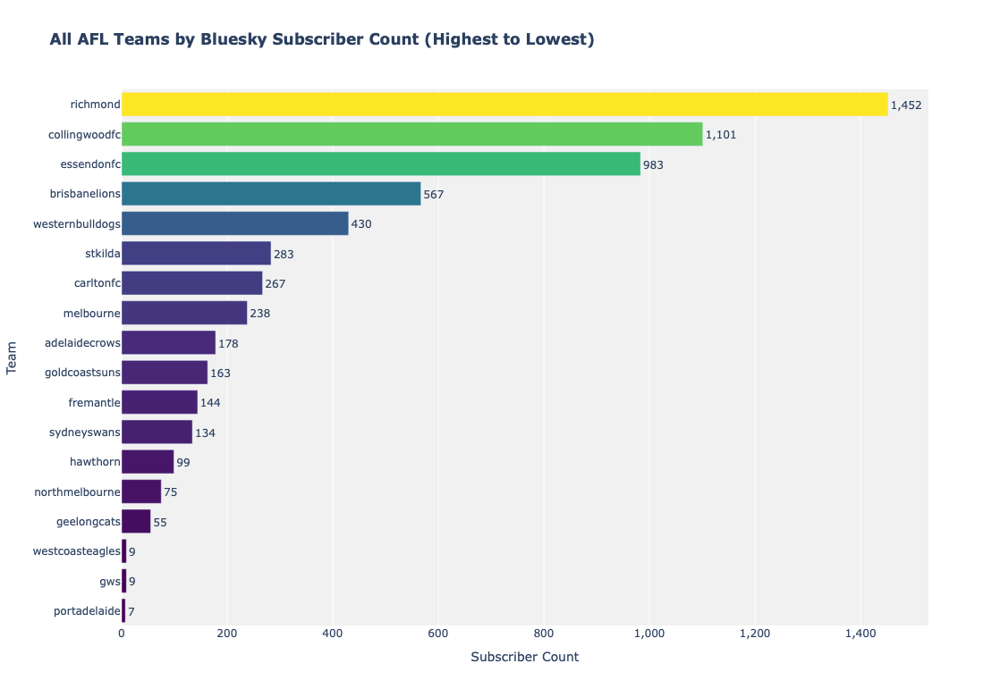

In [803]:
response = requests.get('http://localhost:8080/afl/subscribers/bluesky')
data = response.json()

if 'top_5_teams_subscribers' not in data:
    print("Error:", data.get('error', 'data error'))
else:
    # Create and sort DataFrames
    top_df = pd.DataFrame(data['top_5_teams_subscribers']).sort_values('followers', ascending=False)
    bottom_df = pd.DataFrame(data['bottom_5_teams_subscribers']).sort_values('followers', ascending=True)
    all_df = pd.DataFrame(data['all_teams_subscribers'])
    all_df_sorted = all_df.sort_values('followers', ascending=False)
    
    # Top/Bottom Teams Comparison
    fig15 = make_subplots(
        rows=1, 
        cols=2, 
        subplot_titles=(
            '<b>Top 5 Teams by Subscribers (High to Low)</b>', 
            '<b>Bottom 5 Teams by Subscribers (Low to High)</b>'
        ),
        horizontal_spacing=0.2,  
        column_widths=[0.5, 0.5]  
    )
    
    # Add top teams data
    fig15.add_trace(
        go.Bar(
            y=top_df['name'],
            x=top_df['followers'],
            name='Most Subscribers',
            orientation='h',
            marker_color='#1f77b4',
            hovertemplate='<b>%{y}</b><br>Subscribers: %{x:,}<extra></extra>'
        ),
        row=1, 
        col=1
    )
    
    # Add bottom teams data
    fig15.add_trace(
        go.Bar(
            y=bottom_df['name'],
            x=bottom_df['followers'],
            name='Least Subscribers',
            orientation='h',
            marker_color='#d62728',
            hovertemplate='<b>%{y}</b><br>Subscribers: %{x:,}<extra></extra>'
        ),
        row=1, 
        col=2
    )
    
    # Update layout 
    fig15.update_layout(
        plot_bgcolor='rgba(240,240,240,0.9)',
        title_text='<b>AFL Team Subscriber Counts on Bluesky</b>',
        height=500,
        showlegend=False,
        margin=dict(t=100, b=100, l=100, r=100),  
        xaxis_title="Subscriber Count",
        xaxis2_title="Subscriber Count",
        yaxis_title=dict(text="Team", standoff=20),  
        yaxis2_title=dict(text="Team", standoff=20),  
        yaxis={'categoryorder':'total ascending'},
        yaxis2={'categoryorder':'total descending'}
    )
    
    # Format x-axes
    fig15.update_xaxes(tickformat=",", row=1, col=1)
    fig15.update_xaxes(tickformat=",", row=1, col=2)
    
    fig15.show()

    # All Teams Visualisation (sorted high to low)
    fig16 = px.bar(
        all_df_sorted,  
        x='followers',
        y='name',
        orientation='h',
        color='followers',
        color_continuous_scale='Viridis',
        labels={'followers': 'Subscriber Count', 'name': 'Team'},
        title='<b>All AFL Teams by Bluesky Subscriber Count (Highest to Lowest)</b>',
        height=600 + len(all_df)*10  
    )

    # Update layout
    fig16.update_layout(
        plot_bgcolor='rgba(240,240,240,0.9)',
        xaxis=dict(tickformat=","),
        yaxis={'categoryorder':'total ascending'},  
        coloraxis_showscale=False,
        hoverlabel=dict(bgcolor="white", font_size=12)
    )

    # Add value labels
    fig16.update_traces(
        texttemplate='%{x:,}',
        textposition='outside',
        hovertemplate='<b>%{y}</b><br>Subscribers: %{x:,}<extra></extra>'
    )

    fig16.show()

### 8. Sentiments and Subscribers Analytics after 2025-05-01 (by day) for Top/Bottom 5 Team
#### Reddit
- Average sentiment Trends vs Subscriber Changes after 2025-05-01 (by day) for top 5 teams

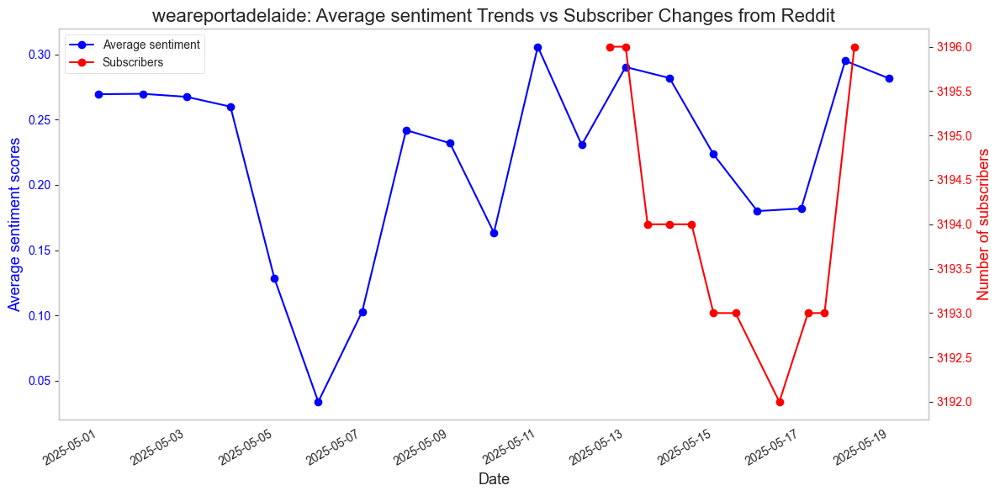

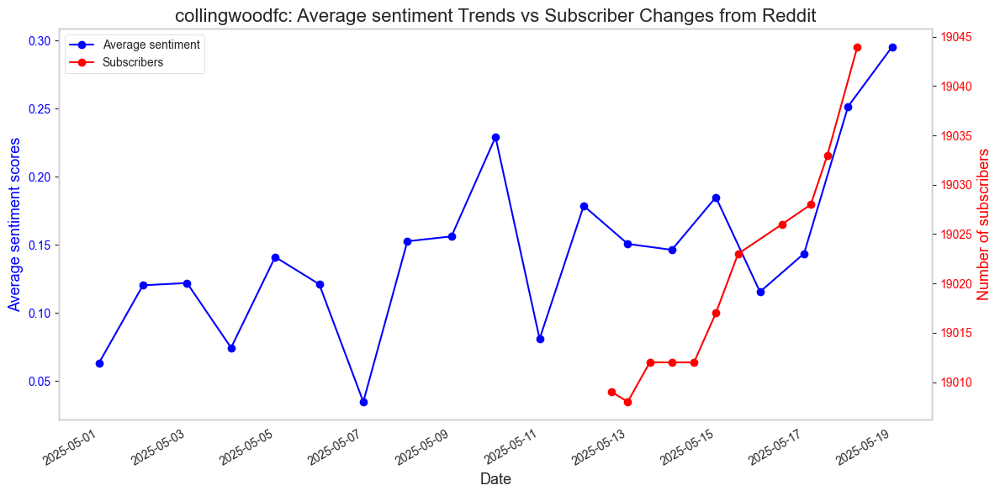

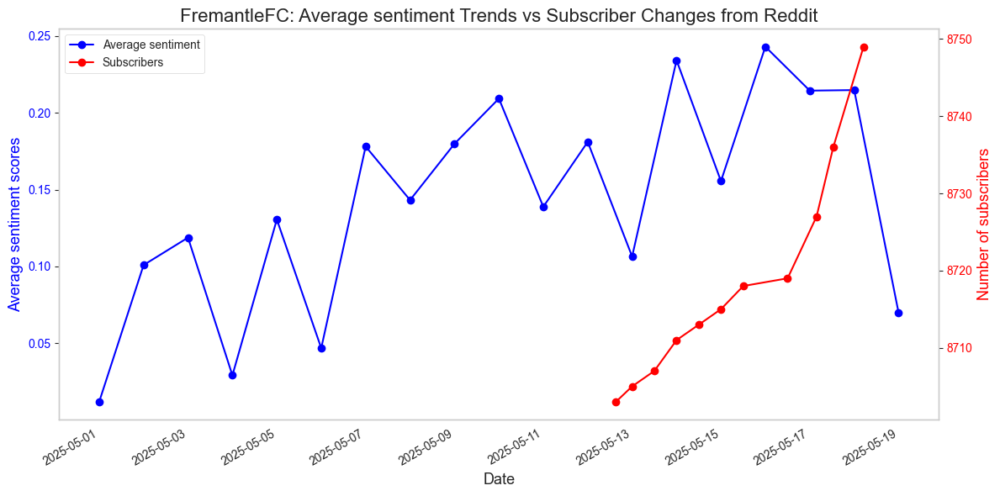

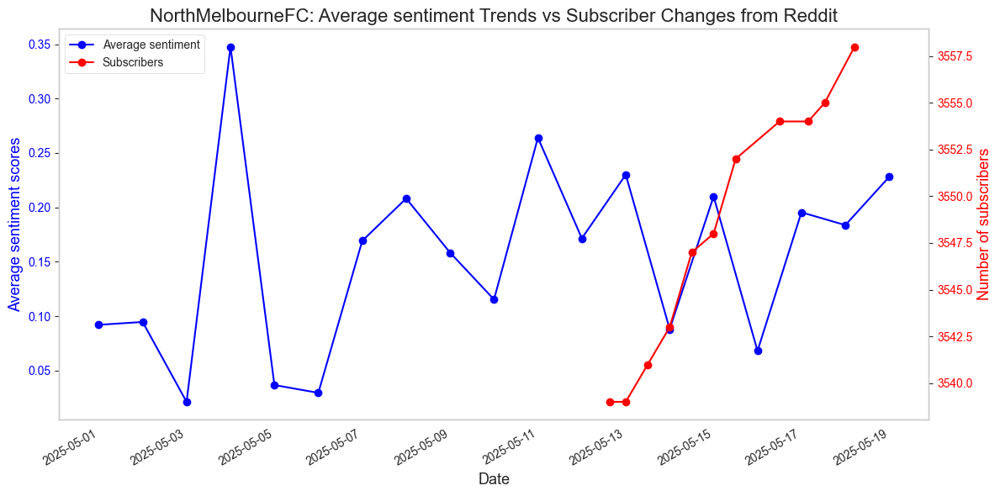

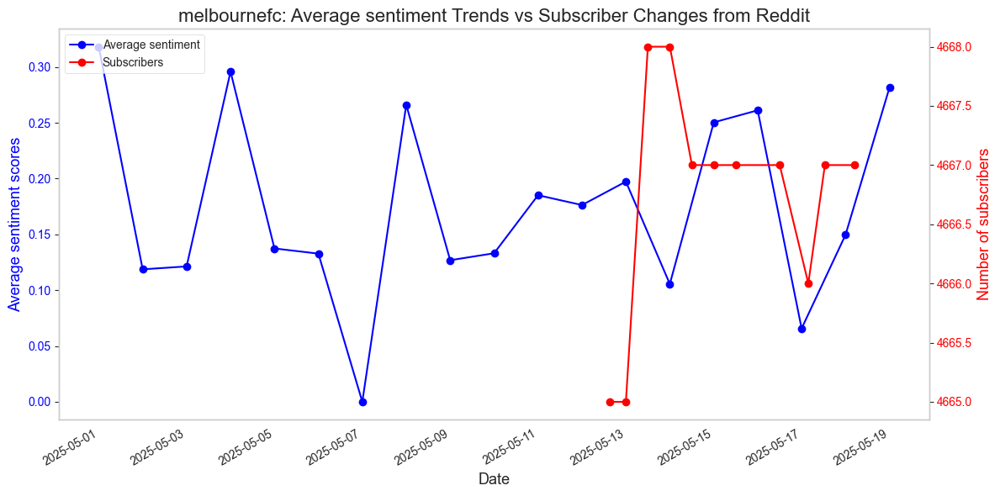

In [805]:
# Average sentiment Trends vs Subscriber Changes after 2025-05-01 (by day) for top 5 teams
response = requests.get('http://localhost:8080/afl/sentiment/subscribers/reddit')
data = response.json()

top_5 = data['sentiment_time_series']['top_5']
bottom_5 = data['sentiment_time_series']['bottom_5']
subs_data = data['subscribers_time_series']
team_mapping = data['team_mapping']

# Organise data into DataFrame
def extract_sentiment_df(team_list):
    records = []
    for team in team_list:
        for record in team['time_series']:
            records.append({
                'team': team['mapped_name'],
                'date': pd.to_datetime(record['date']),
                'avg_sentiment': record['avg_sentiment'],
                'total_sentiment': record['total_sentiment'],
                'doc_count': record['doc_count']
            })
    return pd.DataFrame(records)

def extract_subscriber_df(subs_dict):
    records = []
    for team, entries in subs_dict.items():
        for record in entries:
            try:
                # Standardised time format: Convert 2025-05-14T00-01-45.413232 to 2025-05-14T00:01:45.413232
                # Extract the date part (first 11 characters): "2025-05-14T"
                # Extract the time part (after the 11th character): "00-01-45.413232"
                # Replace the first two '-' with ':'
                fixed_date = record['date'][:11] + record['date'][11:].replace('-', ':', 2)
                date = pd.to_datetime(fixed_date)
                records.append({
                    'team': team,
                    'date': date,
                    'subscribers': record['subscribers']
                })
            except Exception:
                continue
    return pd.DataFrame(records)

# Convert to DataFrame
sentiment_df = extract_sentiment_df(top_5)
subs_df = extract_subscriber_df(subs_data)

# Visualisation
analysed_teams = sentiment_df['team'].unique()

for team in analysed_teams:
    team_sentiment = sentiment_df[sentiment_df['team'] == team]
    team_subs = subs_df[subs_df['team'] == team]

    # Draw graph
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Average sentiment scores - Left y axis
    line1, = ax1.plot(team_sentiment['date'], team_sentiment['avg_sentiment'],
                    color='blue', marker='o', label='Average sentiment')
    ax1.set_xlabel('Date', fontsize=13)
    ax1.set_ylabel('Average sentiment scores', fontsize=13, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(False)

    # Subscribers - Right y axis
    ax2 = ax1.twinx()
    line2, = ax2.plot(team_subs['date'], team_subs['subscribers'],
                    color='red', marker='o', label='Subscribers')
    ax2.set_ylabel('Number of subscribers', fontsize=13, color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.grid(False)

    # Merge Legend
    ax1.legend(handles=[line1, line2], loc='upper left')

    plt.title(f"{team}: Average sentiment Trends vs Subscriber Changes from Reddit", fontsize=16)
    fig.autofmt_xdate()
    plt.tight_layout()
    plt.show()

- Average sentiment Trends vs Subscriber Changes after 2025-05-01 (by day) for bottom 5 teams

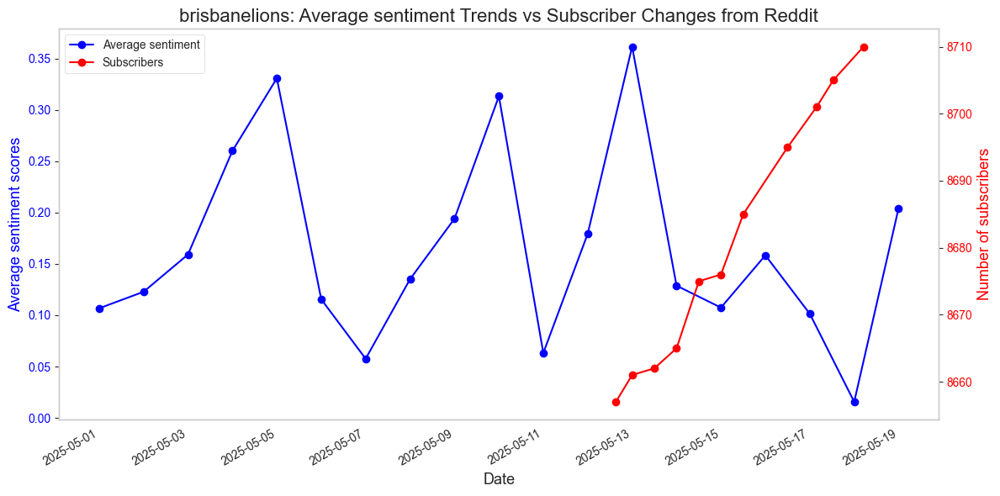

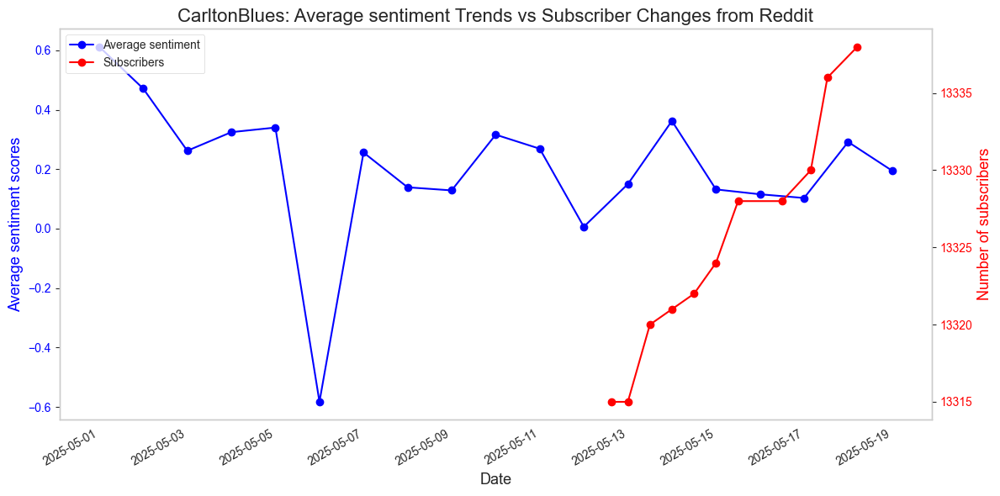

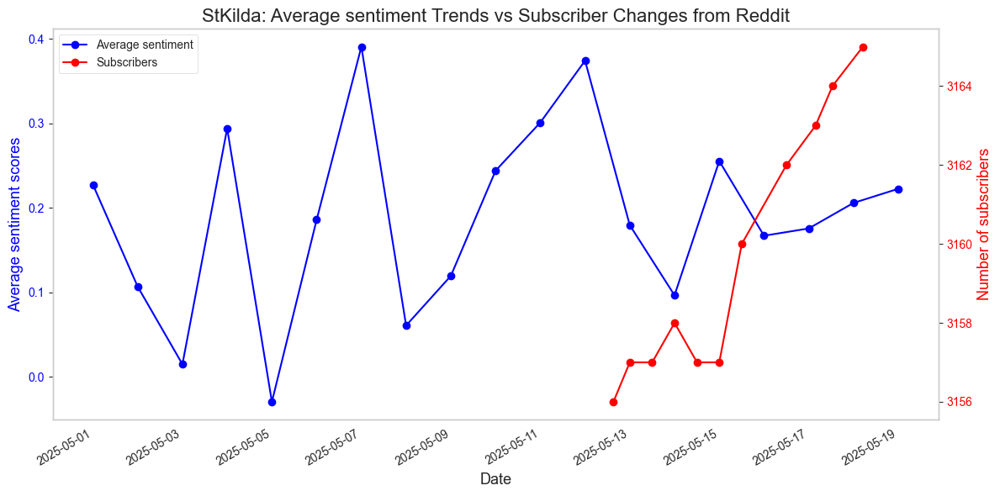

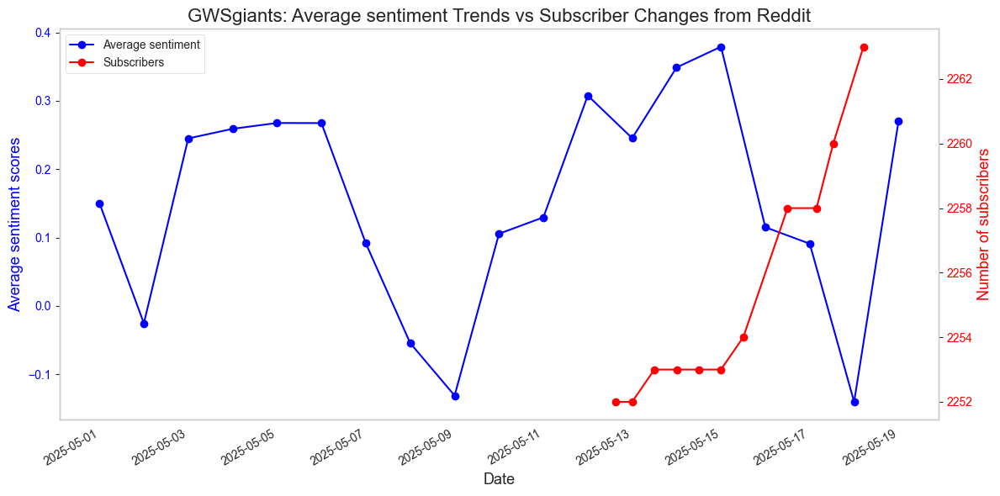

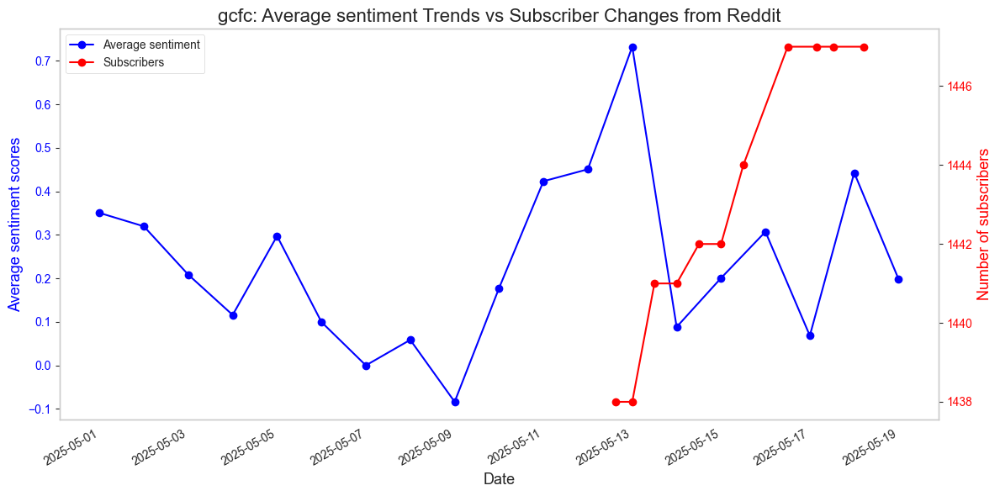

In [807]:
# Average sentiment Trends vs Subscriber Changes after 2025-05-01 (by day) for bottom 5 teams
response = requests.get('http://localhost:8080/afl/sentiment/subscribers/reddit')
data = response.json()

top_5 = data['sentiment_time_series']['top_5']
bottom_5 = data['sentiment_time_series']['bottom_5']
subs_data = data['subscribers_time_series']
team_mapping = data['team_mapping']

# Organise data into DataFrame
def extract_sentiment_df(team_list):
    records = []
    for team in team_list:
        for record in team['time_series']:
            records.append({
                'team': team['mapped_name'],
                'date': pd.to_datetime(record['date']),
                'avg_sentiment': record['avg_sentiment'],
                'total_sentiment': record['total_sentiment'],
                'doc_count': record['doc_count']
            })
    return pd.DataFrame(records)

def extract_subscriber_df(subs_dict):
    records = []
    for team, entries in subs_dict.items():
        for record in entries:
            try:
                # Standardised time format: Convert 2025-05-14T00-01-45.413232 to 2025-05-14T00:01:45.413232
                # Extract the date part (first 11 characters): "2025-05-14T"
                # Extract the time part (after the 11th character): "00-01-45.413232"
                # Replace the first two '-' with ':'
                fixed_date = record['date'][:11] + record['date'][11:].replace('-', ':', 2)
                date = pd.to_datetime(fixed_date)
                records.append({
                    'team': team,
                    'date': date,
                    'subscribers': record['subscribers']
                })
            except Exception:
                continue
    return pd.DataFrame(records)

# Convert to DataFrame
sentiment_df = extract_sentiment_df(bottom_5)
subs_df = extract_subscriber_df(subs_data)

# Visualisation
analysed_teams = sentiment_df['team'].unique()

for team in analysed_teams:
    team_sentiment = sentiment_df[sentiment_df['team'] == team]
    team_subs = subs_df[subs_df['team'] == team]

    # Draw graph
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Average sentiment scores - Left y axis
    line1, = ax1.plot(team_sentiment['date'], team_sentiment['avg_sentiment'],
                    color='blue', marker='o', label='Average sentiment')
    ax1.set_xlabel('Date', fontsize=13)
    ax1.set_ylabel('Average sentiment scores', fontsize=13, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(False)

    # Subscribers - Right y axis
    ax2 = ax1.twinx()
    line2, = ax2.plot(team_subs['date'], team_subs['subscribers'],
                    color='red', marker='o', label='Subscribers')
    ax2.set_ylabel('Number of subscribers', fontsize=13, color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.grid(False)

    # Merge Legend
    ax1.legend(handles=[line1, line2], loc='upper left')

    plt.title(f"{team}: Average sentiment Trends vs Subscriber Changes from Reddit", fontsize=16)
    fig.autofmt_xdate()
    plt.tight_layout()
    plt.show()

- Total sentiment Trends vs Subscriber Changes after 2025-05-01 (by day) for top 5 teams

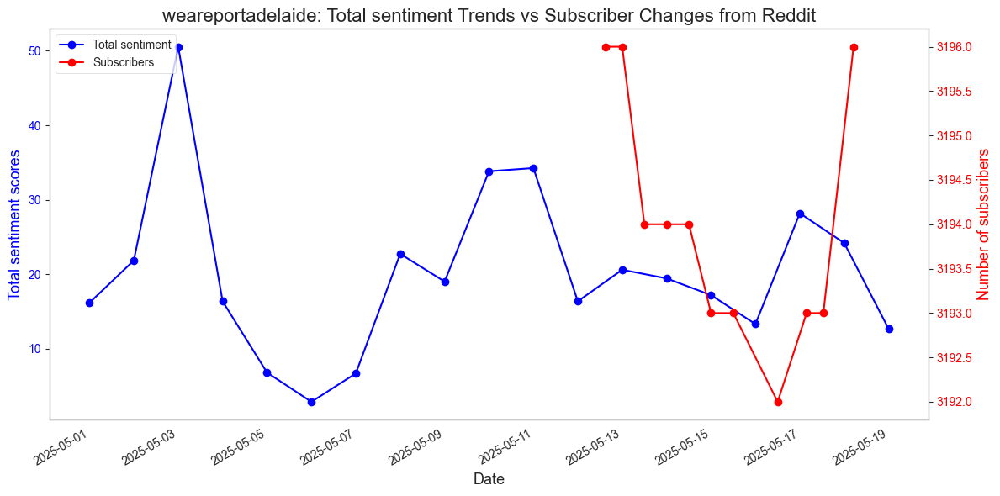

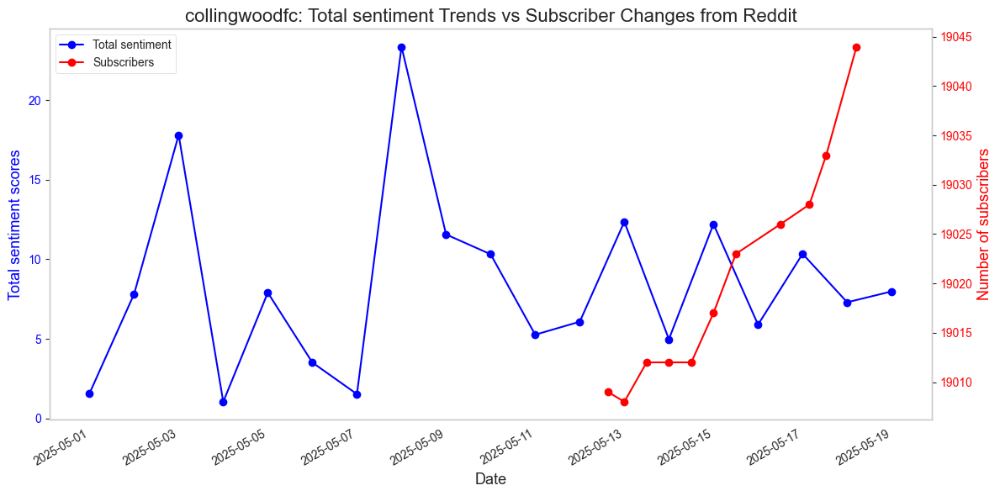

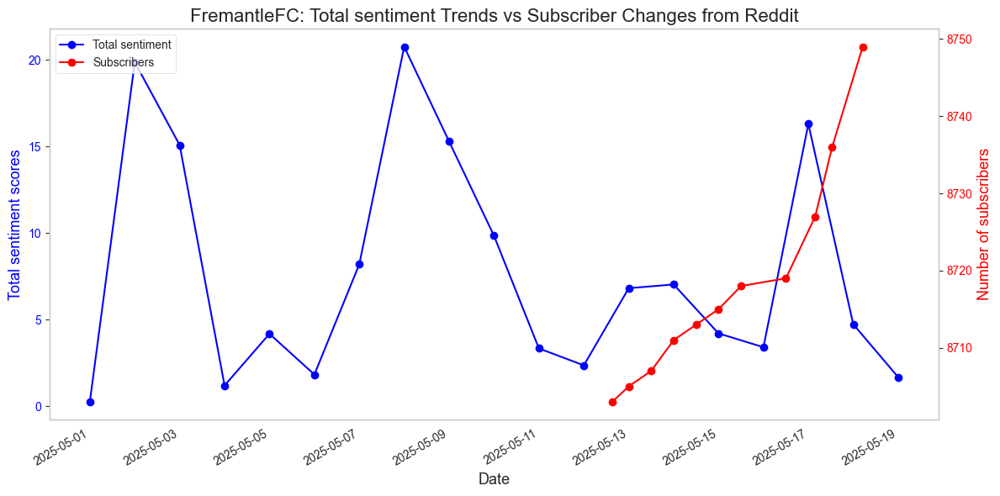

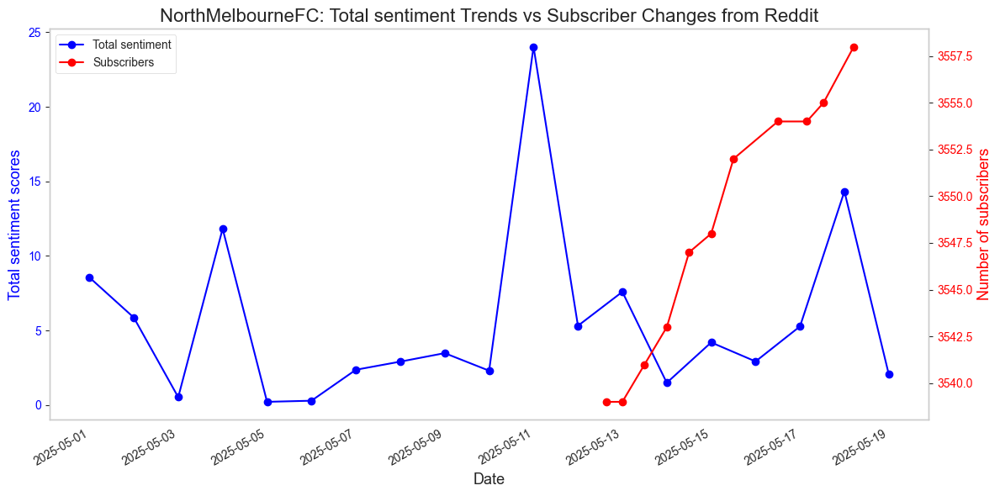

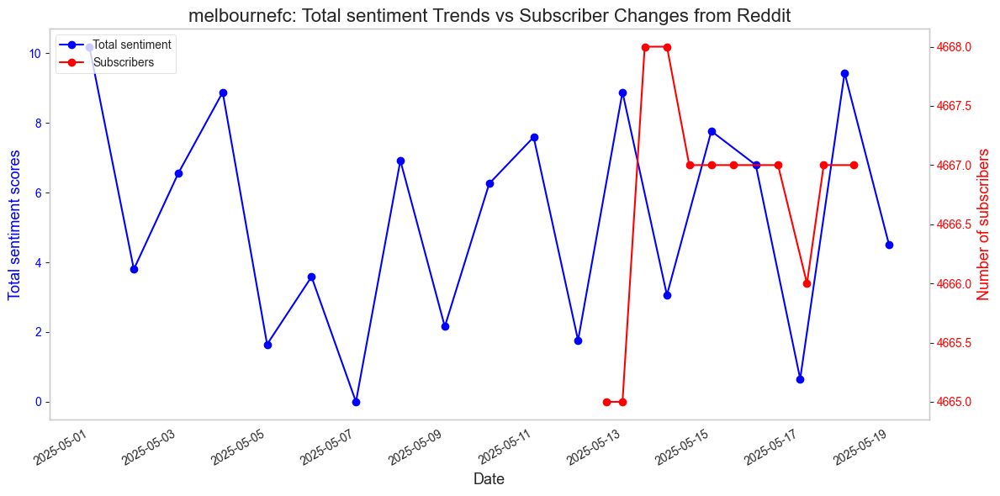

In [809]:
# Total sentiment Trends vs Subscriber Changes after 2025-05-01 (by day) for top 5 teams
response = requests.get('http://localhost:8080/afl/sentiment/subscribers/reddit')
data = response.json()

top_5 = data['sentiment_time_series']['top_5']
bottom_5 = data['sentiment_time_series']['bottom_5']
subs_data = data['subscribers_time_series']
team_mapping = data['team_mapping']

# Organise data into DataFrame
def extract_sentiment_df(team_list):
    records = []
    for team in team_list:
        for record in team['time_series']:
            records.append({
                'team': team['mapped_name'],
                'date': pd.to_datetime(record['date']),
                'avg_sentiment': record['avg_sentiment'],
                'total_sentiment': record['total_sentiment'],
                'doc_count': record['doc_count']
            })
    return pd.DataFrame(records)

def extract_subscriber_df(subs_dict):
    records = []
    for team, entries in subs_dict.items():
        for record in entries:
            try:
                # Standardised time format: Convert 2025-05-14T00-01-45.413232 to 2025-05-14T00:01:45.413232
                # Extract the date part (first 11 characters): "2025-05-14T"
                # Extract the time part (after the 11th character): "00-01-45.413232"
                # Replace the first two '-' with ':'
                fixed_date = record['date'][:11] + record['date'][11:].replace('-', ':', 2)
                date = pd.to_datetime(fixed_date)
                records.append({
                    'team': team,
                    'date': date,
                    'subscribers': record['subscribers']
                })
            except Exception:
                continue
    return pd.DataFrame(records)

# Convert to DataFrame
sentiment_df = extract_sentiment_df(top_5)
subs_df = extract_subscriber_df(subs_data)

# Visualisation
analysed_teams = sentiment_df['team'].unique()

for team in analysed_teams:
    team_sentiment = sentiment_df[sentiment_df['team'] == team]
    team_subs = subs_df[subs_df['team'] == team]

    # Draw graph
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Average sentiment scores - Left y axis
    line1, = ax1.plot(team_sentiment['date'], team_sentiment['total_sentiment'],
                    color='blue', marker='o', label='Total sentiment')
    ax1.set_xlabel('Date', fontsize=13)
    ax1.set_ylabel('Total sentiment scores', fontsize=13, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(False)

    # Subscribers - Right y axis
    ax2 = ax1.twinx()
    line2, = ax2.plot(team_subs['date'], team_subs['subscribers'],
                    color='red', marker='o', label='Subscribers')
    ax2.set_ylabel('Number of subscribers', fontsize=13, color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.grid(False)

    # Merge Legend
    ax1.legend(handles=[line1, line2], loc='upper left')

    plt.title(f"{team}: Total sentiment Trends vs Subscriber Changes from Reddit", fontsize=16)
    fig.autofmt_xdate()
    plt.tight_layout()
    plt.show()

- Total sentiment Trends vs Subscriber Changes after 2025-05-01 (by day) for bottom 5 teams

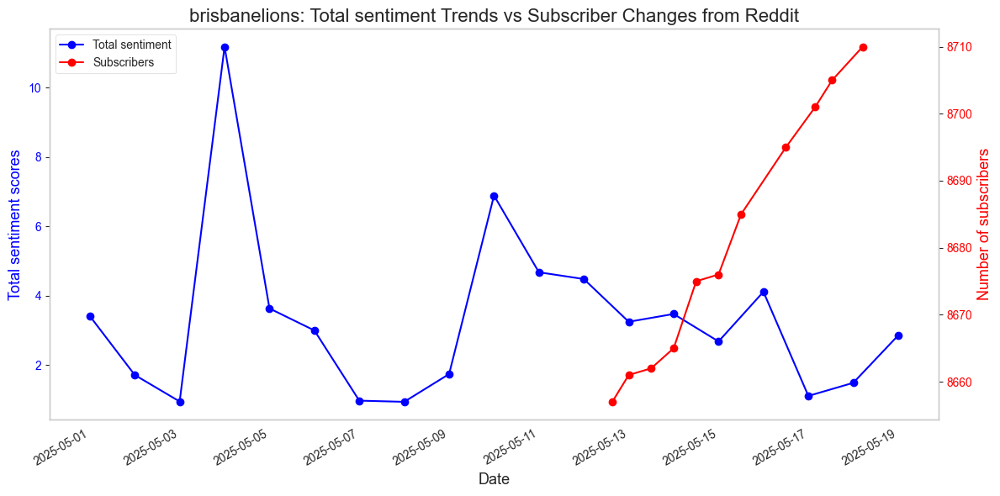

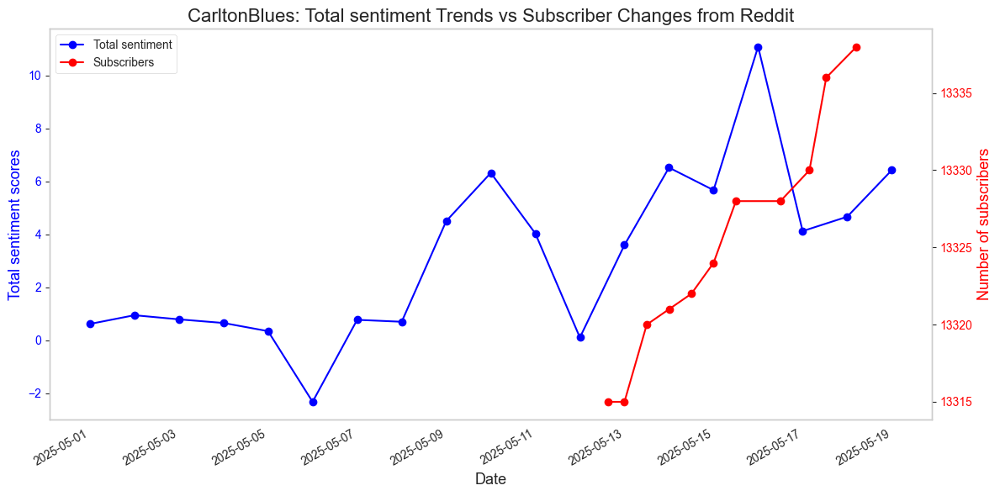

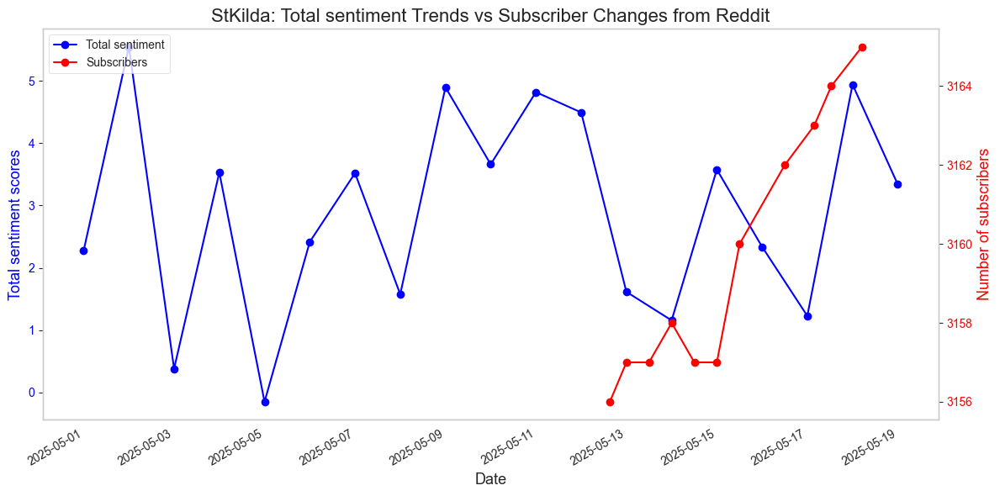

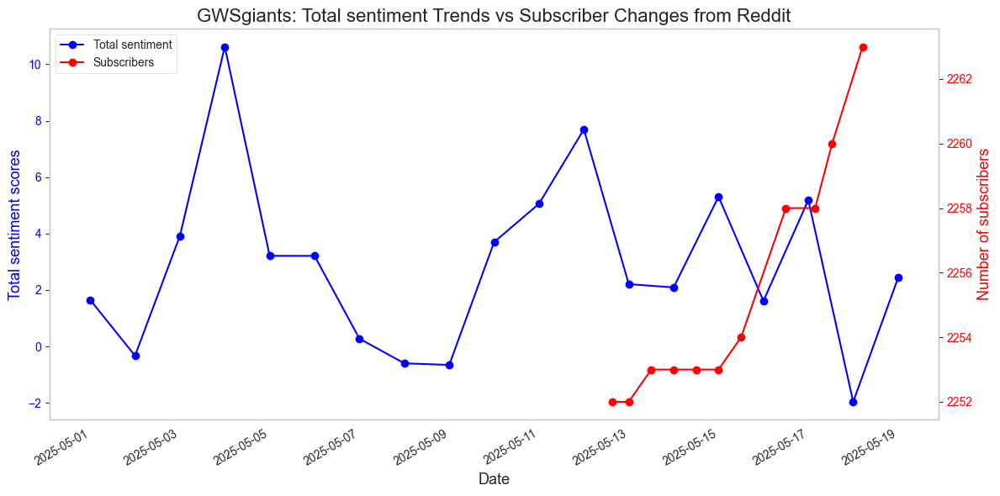

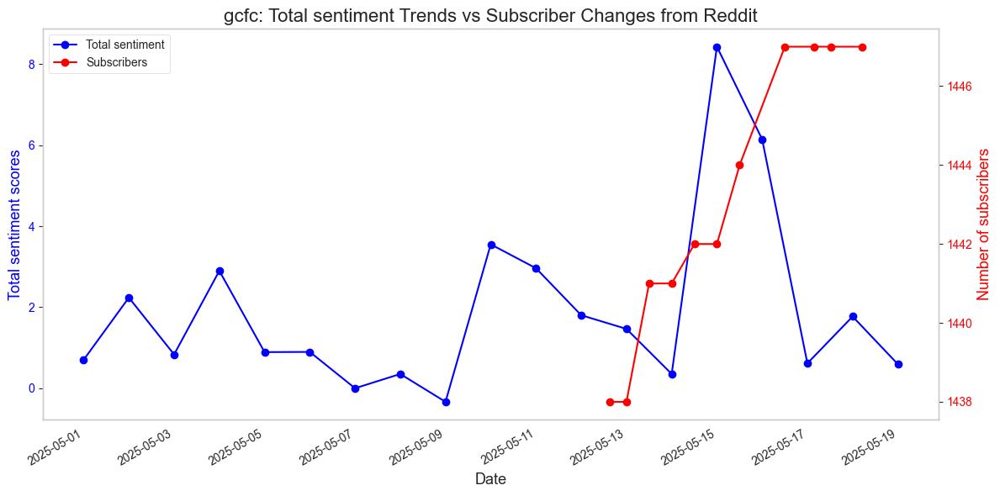

In [811]:
# Total sentiment Trends vs Subscriber Changes after 2025-05-01 (by day) for bottom 5 teams
response = requests.get('http://localhost:8080/afl/sentiment/subscribers/reddit')
data = response.json()

top_5 = data['sentiment_time_series']['top_5']
bottom_5 = data['sentiment_time_series']['bottom_5']
subs_data = data['subscribers_time_series']
team_mapping = data['team_mapping']

# Organise data into DataFrame
def extract_sentiment_df(team_list):
    records = []
    for team in team_list:
        for record in team['time_series']:
            records.append({
                'team': team['mapped_name'],
                'date': pd.to_datetime(record['date']),
                'avg_sentiment': record['avg_sentiment'],
                'total_sentiment': record['total_sentiment'],
                'doc_count': record['doc_count']
            })
    return pd.DataFrame(records)

def extract_subscriber_df(subs_dict):
    records = []
    for team, entries in subs_dict.items():
        for record in entries:
            try:
                # Standardised time format: Convert 2025-05-14T00-01-45.413232 to 2025-05-14T00:01:45.413232
                # Extract the date part (first 11 characters): "2025-05-14T"
                # Extract the time part (after the 11th character): "00-01-45.413232"
                # Replace the first two '-' with ':'
                fixed_date = record['date'][:11] + record['date'][11:].replace('-', ':', 2)
                date = pd.to_datetime(fixed_date)
                records.append({
                    'team': team,
                    'date': date,
                    'subscribers': record['subscribers']
                })
            except Exception:
                continue
    return pd.DataFrame(records)

# Convert to DataFrame
sentiment_df = extract_sentiment_df(bottom_5)
subs_df = extract_subscriber_df(subs_data)

# Visualisation
analysed_teams = sentiment_df['team'].unique()

for team in analysed_teams:
    team_sentiment = sentiment_df[sentiment_df['team'] == team]
    team_subs = subs_df[subs_df['team'] == team]

    # Draw graph
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Average sentiment scores - Left y axis
    line1, = ax1.plot(team_sentiment['date'], team_sentiment['total_sentiment'],
                    color='blue', marker='o', label='Total sentiment')
    ax1.set_xlabel('Date', fontsize=13)
    ax1.set_ylabel('Total sentiment scores', fontsize=13, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(False)

    # Subscribers - Right y axis
    ax2 = ax1.twinx()
    line2, = ax2.plot(team_subs['date'], team_subs['subscribers'],
                    color='red', marker='o', label='Subscribers')
    ax2.set_ylabel('Number of subscribers', fontsize=13, color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.grid(False)

    # Merge Legend
    ax1.legend(handles=[line1, line2], loc='upper left')

    plt.title(f"{team}: Total sentiment Trends vs Subscriber Changes from Reddit", fontsize=16)
    fig.autofmt_xdate()
    plt.tight_layout()
    plt.show()

## Scenario 2: Public Transport Analysis in Major Australian Cities
#### Data: Mastodon and Reddit
#### Analytics：
- Overall Comparative Analytics of Posts from Mastodon and Reddit
- Cross-Platform Sentiment Comparison: Top/Bottom City by Sentiment Score
- Cross-Platform Feedback Comparison
### 1. Overall Comparative Analytics of Posts from Mastodon and Reddit
#### 1.1 Comparison of Post Volumes

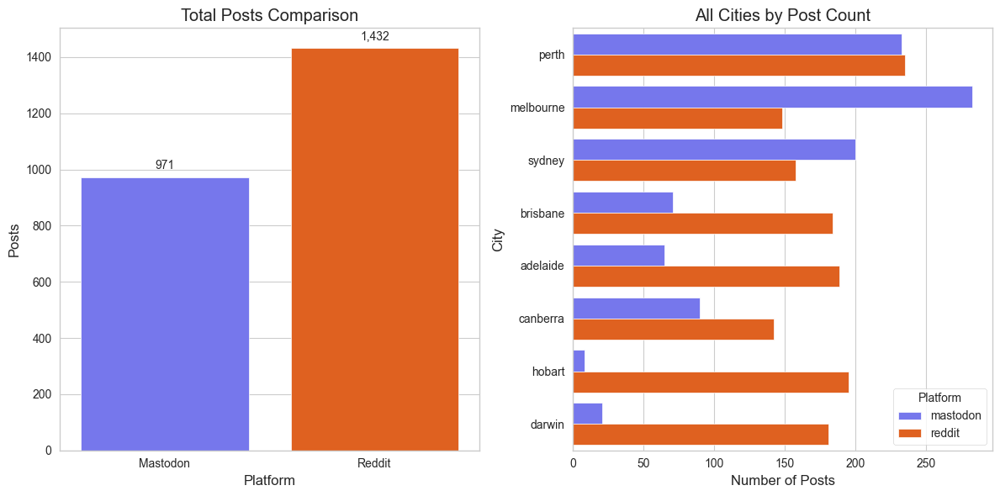

In [813]:
response = requests.get('http://localhost:8080/transportation/post/comparison')
data = response.json()

# Prepare data
total_posts = pd.DataFrame({
    'Platform': ['Mastodon', 'Reddit'],
    'Posts': [data['total_posts']['mastodon'], data['total_posts']['reddit']]
})

city_comparison = pd.DataFrame(data['city_comparison'])
all_cities = city_comparison['name'].tolist()


# Comparison of total number of posts comparison
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x='Platform', y='Posts', data=total_posts, palette=['#6364FF', '#FF5700'])
plt.title('Total Posts Comparison')
for p in ax1.patches:
    ax1.annotate(f"{p.get_height():,.0f}", 
                (p.get_x() + p.get_width()/2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Comparison of the number of posts in each city
plt.subplot(1, 2, 2)
comparison_melted = city_comparison[city_comparison['name'].isin(all_cities)].melt(
    id_vars='name', 
    value_vars=['mastodon_posts', 'reddit_posts'],
    var_name='Platform', 
    value_name='Posts'
)
comparison_melted['Platform'] = comparison_melted['Platform'].str.replace('_posts', '')

ax2 = sns.barplot(x='Posts', y='name', hue='Platform', data=comparison_melted,
                 palette={'mastodon': '#6364FF', 'reddit': '#ff5700'})
plt.title('All Cities by Post Count')
plt.ylabel('City')
plt.xlabel('Number of Posts')
plt.legend(title='Platform')

plt.tight_layout()
plt.show()

#### 1.2 Comparison of Sentiment Scores

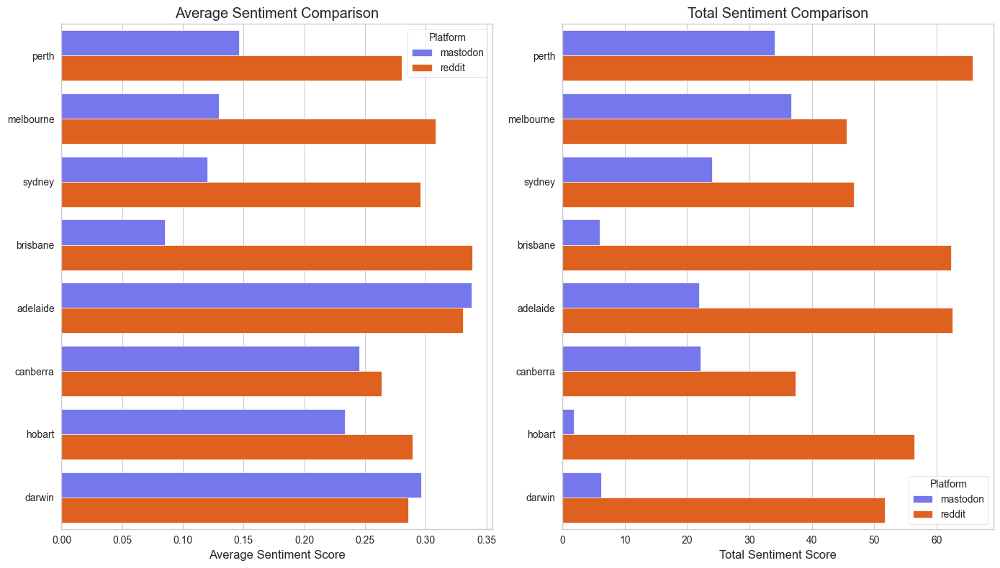

In [815]:
# Sentiment comparison
plt.figure(figsize=(14, 8))

# Average
plt.subplot(1, 2, 1)
avg_sentiment = city_comparison[city_comparison['name'].isin(all_cities)].melt(
    id_vars='name',
    value_vars=['mastodon_avg_sentiment', 'reddit_avg_sentiment'],
    var_name='Platform',
    value_name='Avg_Sentiment'
)
avg_sentiment['Platform'] = avg_sentiment['Platform'].str.replace('_avg_sentiment', '')

sns.barplot(x='Avg_Sentiment', y='name', hue='Platform', data=avg_sentiment,
           palette={'mastodon': '#6364FF', 'reddit': '#ff5700'})
plt.title('Average Sentiment Comparison')
plt.ylabel('')
plt.xlabel('Average Sentiment Score')
plt.legend(title='Platform')

# Total
plt.subplot(1, 2, 2)
total_sentiment = city_comparison[city_comparison['name'].isin(all_cities)].melt(
    id_vars='name',
    value_vars=['mastodon_total_sentiment', 'reddit_total_sentiment'],
    var_name='Platform',
    value_name='Total_Sentiment'
)
total_sentiment['Platform'] = total_sentiment['Platform'].str.replace('_total_sentiment', '')

sns.barplot(x='Total_Sentiment', y='name', hue='Platform', data=total_sentiment,
           palette={'mastodon': '#6364FF', 'reddit': '#ff5700'})
plt.title('Total Sentiment Comparison')
plt.ylabel('')
plt.xlabel('Total Sentiment Score')
plt.legend(title='Platform')

plt.tight_layout()
plt.show()

### 2. Cross-Platform Sentiment Comparison: Top/Bottom City by Sentiment Score
#### Mastodon
- Average sentiment score

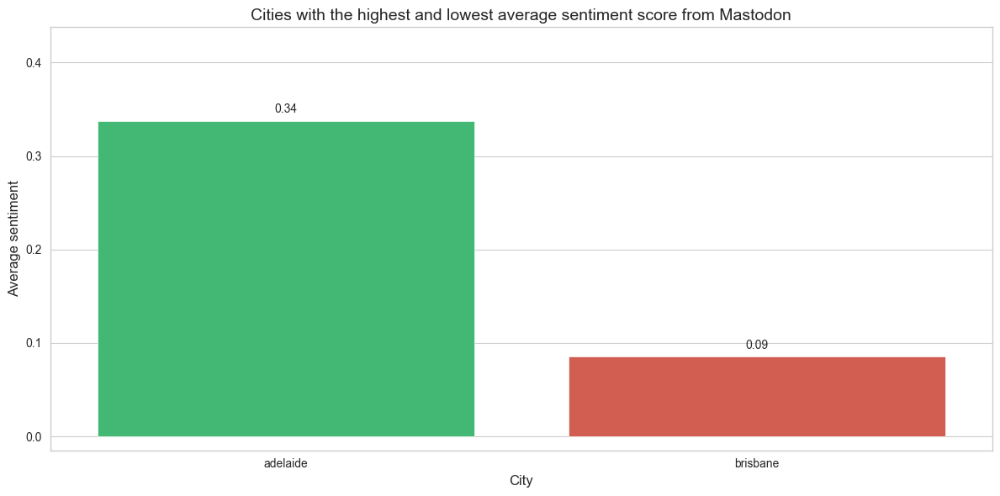

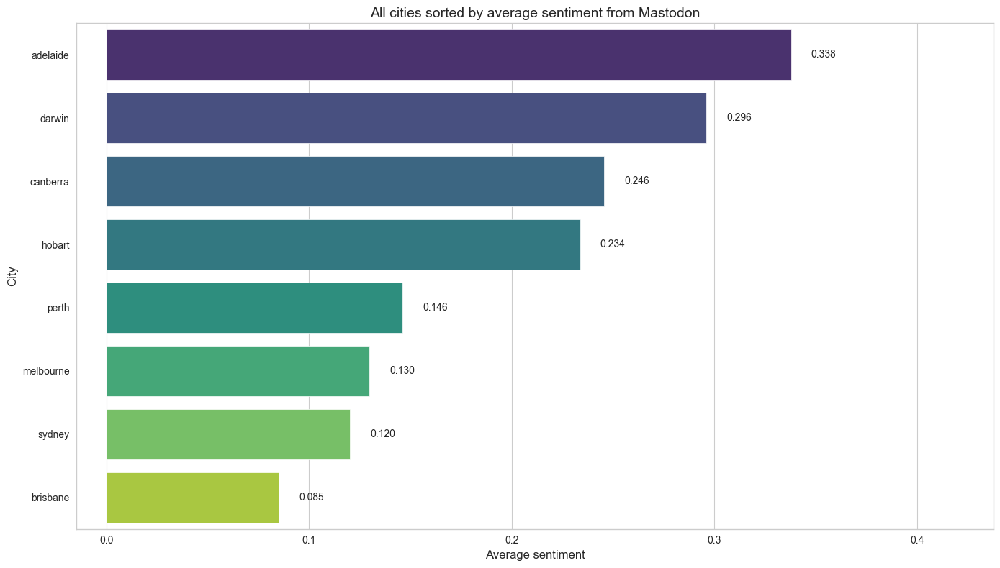

In [817]:
response = requests.get('http://localhost:8080/transportation/sentiment/mastodon')
data = response.json()

# Create DataFrame
df = pd.DataFrame(data['all_cities_avg_mastodon'])

# Highest and lowest
plt.figure(figsize=(12, 6))

top_bottom_avg = pd.concat([
    pd.DataFrame([data['highest_city_avg_mastodon']]), 
    pd.DataFrame([data['lowest_city_avg_mastodon']])
])

barplot = sns.barplot(
    x='name', 
    y='avg_sentiment_mastodon', 
    data=top_bottom_avg,
    palette=['#2ecc71', '#e74c3c']  
)

plt.title('Cities with the highest and lowest average sentiment score from Mastodon', fontsize=14)
plt.xlabel('City', fontsize=12)
plt.ylabel('Average sentiment', fontsize=12)
plt.ylim(min(df['avg_sentiment_mastodon']) - 0.1, max(df['avg_sentiment_mastodon']) + 0.1)

for p in barplot.patches:
    barplot.annotate(
        format(p.get_height(), '.2f'),  
        (p.get_x() + p.get_width() / 2., p.get_height()), 
        ha='center',  
        va='center', 
        xytext=(0, 10), 
        textcoords='offset points'
    )
plt.tight_layout()
plt.show()

# All cities
plt.figure(figsize=(14, 8))
all_cities = sns.barplot(
    x='avg_sentiment_mastodon', 
    y='name', 
    data=df.sort_values('avg_sentiment_mastodon', ascending=False), # Descending order
    palette='viridis'  
)

plt.title('All cities sorted by average sentiment from Mastodon', fontsize=14)
plt.xlabel('Average sentiment', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.xlim(min(df['avg_sentiment_mastodon']) - 0.1, max(df['avg_sentiment_mastodon']) + 0.1)   

for p in all_cities.patches:
    width = p.get_width() 
    plt.text(
        width + 0.01,  
        p.get_y() + p.get_height() / 2,  
        f'{width:.3f}',  
        va='center'  
    )

plt.tight_layout()  
plt.show()

- Total sentiment score

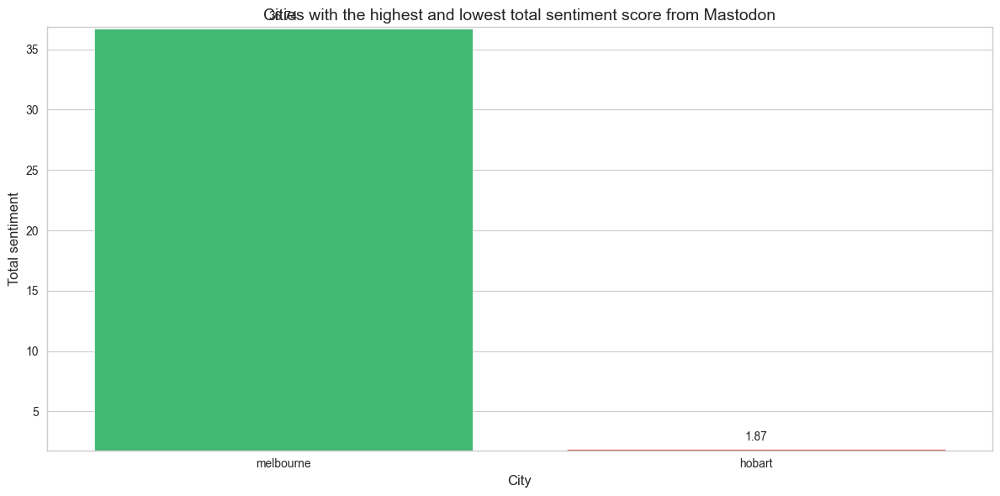

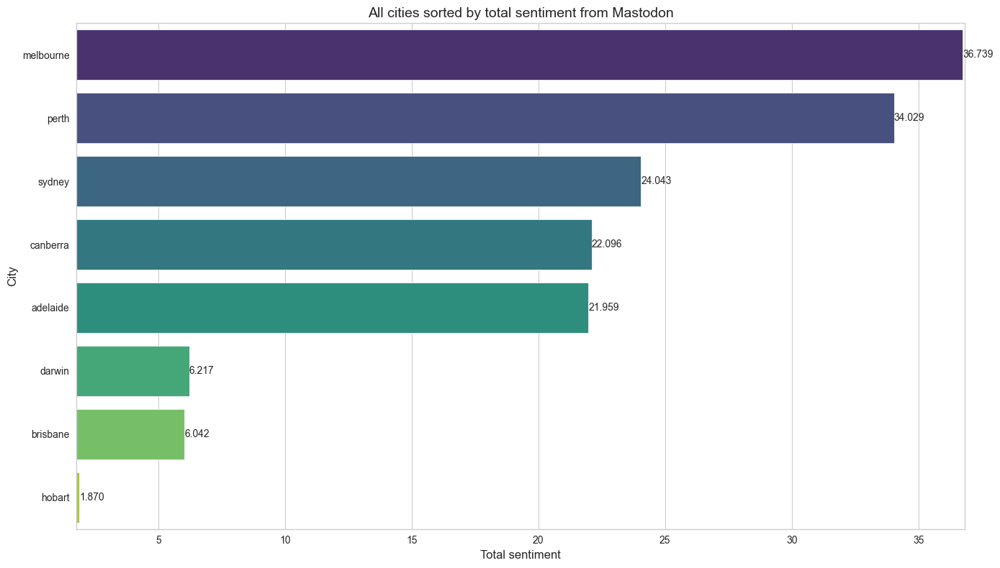

In [819]:
response = requests.get('http://localhost:8080/transportation/sentiment/mastodon')
data = response.json()

# Create DataFrame
df = pd.DataFrame(data['all_cities_total_mastodon'])

# Highest and lowest
plt.figure(figsize=(12, 6))

top_bottom_total = pd.concat([
    pd.DataFrame([data['highest_city_total_mastodon']]), 
    pd.DataFrame([data['lowest_city_total_mastodon']])
])

barplot = sns.barplot(
    x='name', 
    y='total_sentiment_mastodon', 
    data=top_bottom_total,
    palette=['#2ecc71', '#e74c3c']  
)

plt.title('Cities with the highest and lowest total sentiment score from Mastodon', fontsize=14)
plt.xlabel('City', fontsize=12)
plt.ylabel('Total sentiment', fontsize=12)
plt.ylim(min(df['total_sentiment_mastodon']) - 0.1, max(df['total_sentiment_mastodon']) + 0.1)

for p in barplot.patches:
    barplot.annotate(
        format(p.get_height(), '.2f'),  
        (p.get_x() + p.get_width() / 2., p.get_height()), 
        ha='center',  
        va='center',  
        xytext=(0, 10),  
        textcoords='offset points'
    )
plt.tight_layout()
plt.show()

# All cities
plt.figure(figsize=(14, 8))

all_cities = sns.barplot(
    x='total_sentiment_mastodon', 
    y='name', 
    data=df.sort_values('total_sentiment_mastodon', ascending=False),
    palette='viridis' 
)

plt.title('All cities sorted by total sentiment from Mastodon', fontsize=14)
plt.xlabel('Total sentiment', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.xlim(min(df['total_sentiment_mastodon']) - 0.1, max(df['total_sentiment_mastodon']) + 0.1)

for p in all_cities.patches:
    width = p.get_width() 
    plt.text(
        width + 0.01,  
        p.get_y() + p.get_height() / 2,  
        f'{width:.3f}',  
        va='center'  
    )

plt.tight_layout() 
plt.show()

#### Reddit
- Average sentiment score

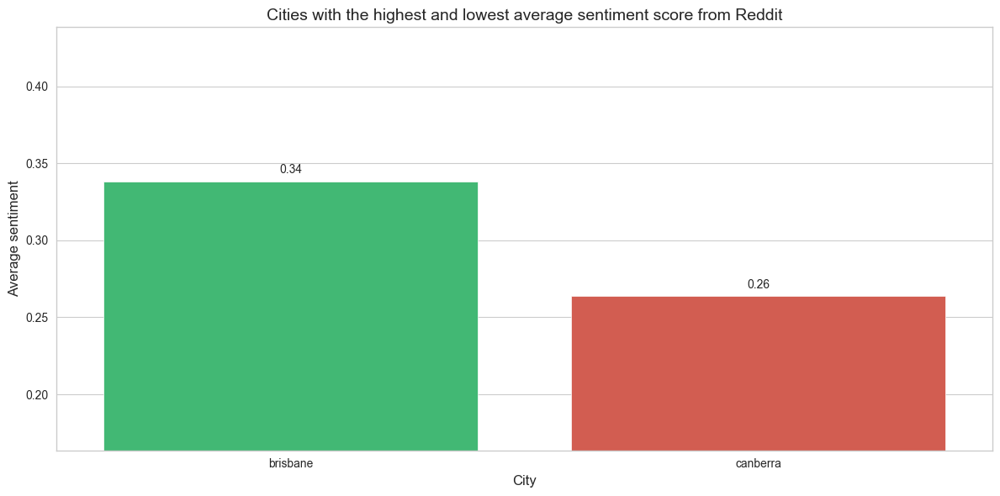

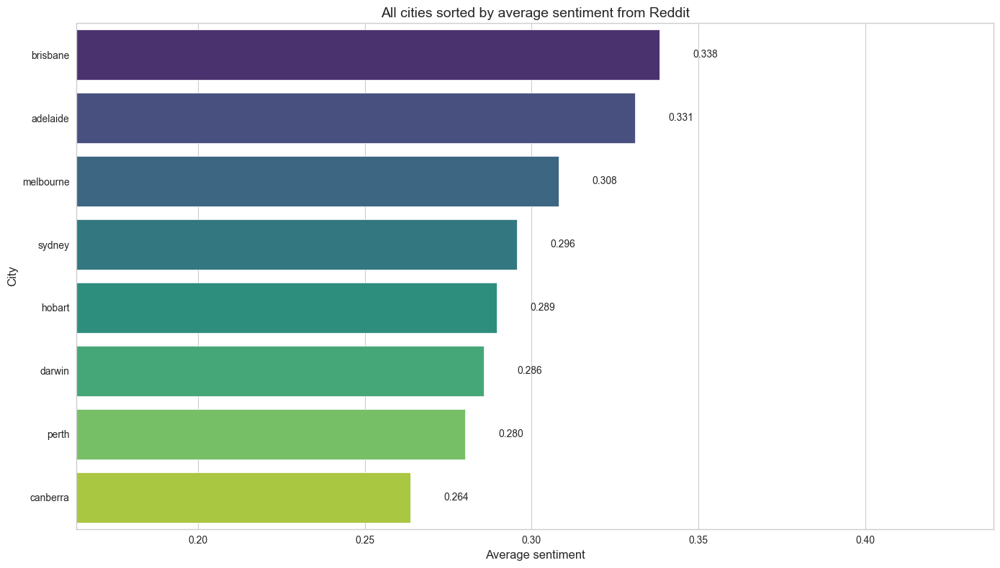

In [821]:
response = requests.get('http://localhost:8080/transportation/sentiment/reddit')
data = response.json()

# Create DataFrame
df = pd.DataFrame(data['all_cities_avg_reddit'])

# Highest and lowest
plt.figure(figsize=(12, 6))

top_bottom_avg = pd.concat([
    pd.DataFrame([data['highest_city_avg_reddit']]), 
    pd.DataFrame([data['lowest_city_avg_reddit']])
])

barplot = sns.barplot(
    x='name', 
    y='avg_sentiment_reddit', 
    data=top_bottom_avg,
    palette=['#2ecc71', '#e74c3c']  
)

plt.title('Cities with the highest and lowest average sentiment score from Reddit', fontsize=14)
plt.xlabel('City', fontsize=12)
plt.ylabel('Average sentiment', fontsize=12)
plt.ylim(min(df['avg_sentiment_reddit']) - 0.1, max(df['avg_sentiment_reddit']) + 0.1)

for p in barplot.patches:
    barplot.annotate(
        format(p.get_height(), '.2f'),  
        (p.get_x() + p.get_width() / 2., p.get_height()), 
        ha='center',  
        va='center', 
        xytext=(0, 10), 
        textcoords='offset points'
    )
plt.tight_layout()
plt.show()

# All cities
plt.figure(figsize=(14, 8))
all_cities = sns.barplot(
    x='avg_sentiment_reddit', 
    y='name', 
    data=df.sort_values('avg_sentiment_reddit', ascending=False), # Descending order
    palette='viridis'  
)

plt.title('All cities sorted by average sentiment from Reddit', fontsize=14)
plt.xlabel('Average sentiment', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.xlim(min(df['avg_sentiment_reddit']) - 0.1, max(df['avg_sentiment_reddit']) + 0.1)   

for p in all_cities.patches:
    width = p.get_width() 
    plt.text(
        width + 0.01,  
        p.get_y() + p.get_height() / 2,  
        f'{width:.3f}',  
        va='center'  
    )

plt.tight_layout()  
plt.show()

- Total sentiment score

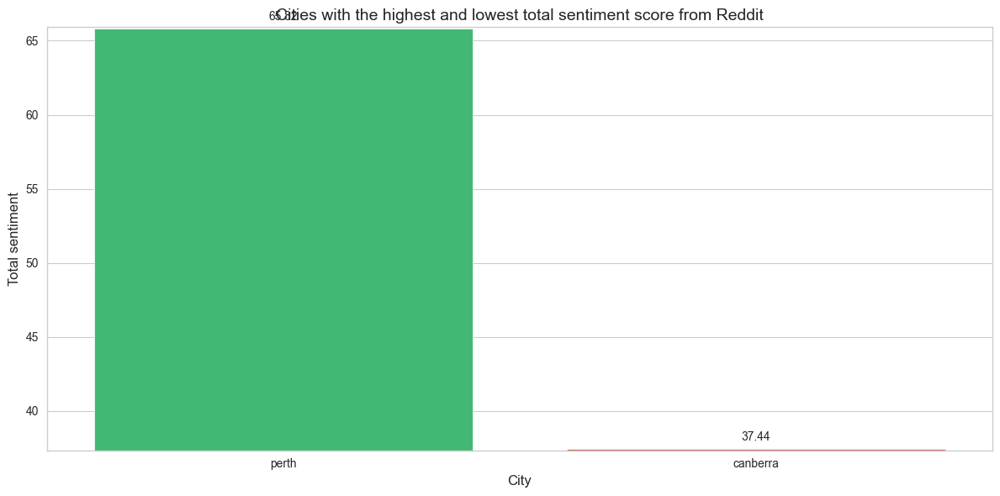

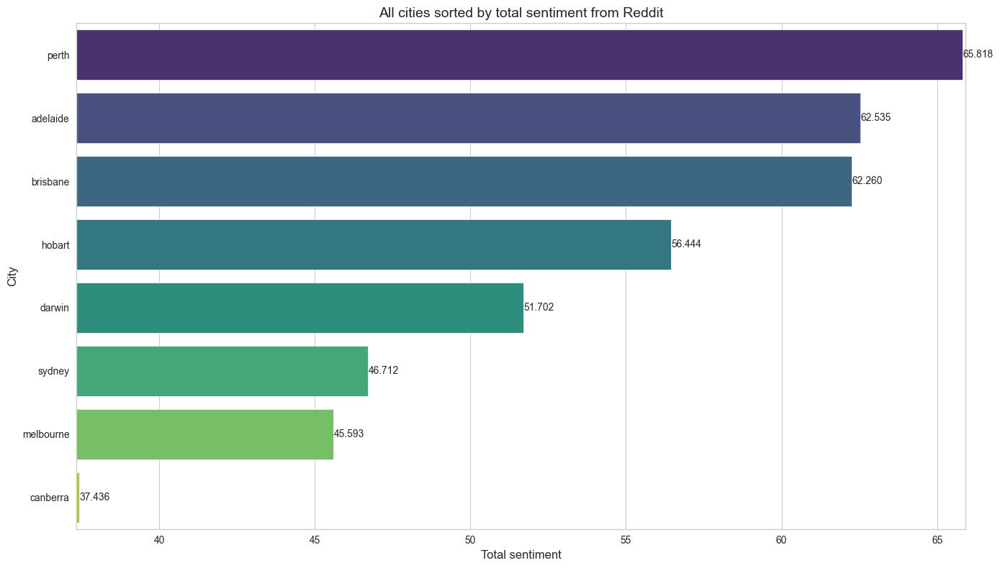

In [823]:
response = requests.get('http://localhost:8080/transportation/sentiment/reddit')
data = response.json()

# Create DataFrame
df = pd.DataFrame(data['all_cities_total_reddit'])

# Highest and lowest
plt.figure(figsize=(12, 6))

top_bottom_total = pd.concat([
    pd.DataFrame([data['highest_city_total_reddit']]), 
    pd.DataFrame([data['lowest_city_total_reddit']])
])

barplot = sns.barplot(
    x='name', 
    y='total_sentiment_reddit', 
    data=top_bottom_total,
    palette=['#2ecc71', '#e74c3c']  
)

plt.title('Cities with the highest and lowest total sentiment score from Reddit', fontsize=14)
plt.xlabel('City', fontsize=12)
plt.ylabel('Total sentiment', fontsize=12)
plt.ylim(min(df['total_sentiment_reddit']) - 0.1, max(df['total_sentiment_reddit']) + 0.1)

for p in barplot.patches:
    barplot.annotate(
        format(p.get_height(), '.2f'),  
        (p.get_x() + p.get_width() / 2., p.get_height()), 
        ha='center',  
        va='center',  
        xytext=(0, 10),  
        textcoords='offset points'
    )
plt.tight_layout()
plt.show()

# All cities
plt.figure(figsize=(14, 8))

all_cities = sns.barplot(
    x='total_sentiment_reddit', 
    y='name', 
    data=df.sort_values('total_sentiment_reddit', ascending=False),
    palette='viridis' 
)

plt.title('All cities sorted by total sentiment from Reddit', fontsize=14)
plt.xlabel('Total sentiment', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.xlim(min(df['total_sentiment_reddit']) - 0.1, max(df['total_sentiment_reddit']) + 0.1)

for p in all_cities.patches:
    width = p.get_width() 
    plt.text(
        width + 0.01,  
        p.get_y() + p.get_height() / 2,  
        f'{width:.3f}',  
        va='center'  
    )

plt.tight_layout() 
plt.show()

### 3. Cross-Platform Feedback Comparison
#### Mastodon

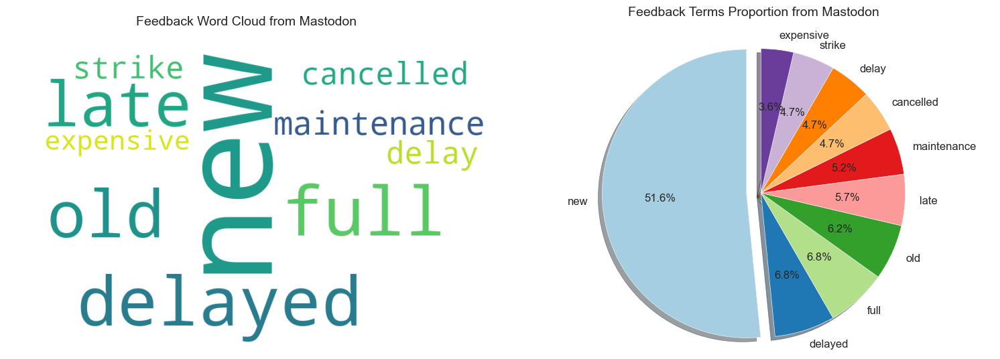

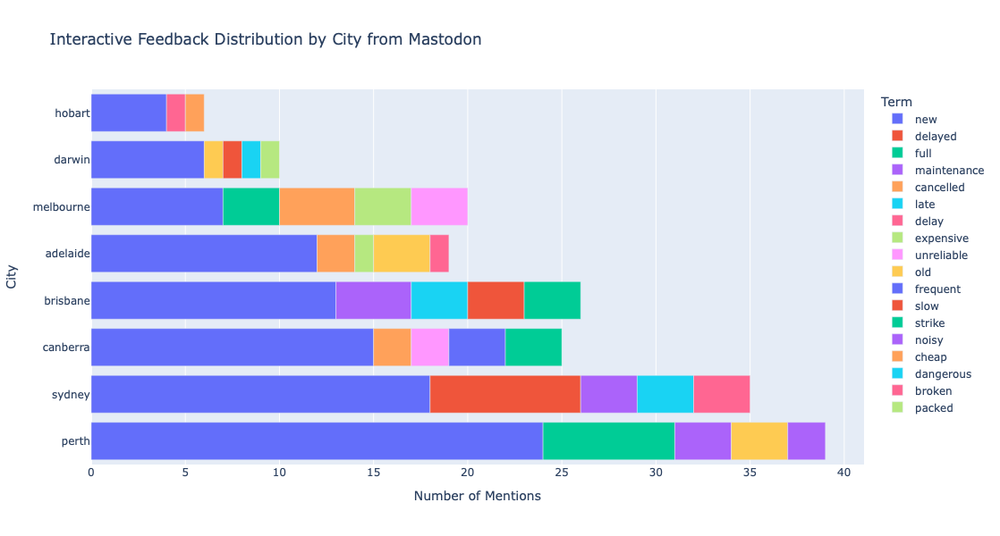

In [825]:
response = requests.get('http://localhost:8080/transportation/feedback/mastodon')
data = response.json()

# Prepare data
city_data = []
for city, feedback in data['city_feedback'].items():
    for term, count in feedback['top_terms']:
        city_data.append({
            'City': city,
            'Term': term,
            'Count': count,
            'Total Mentions': feedback['total_mentions']
        })
city_df = pd.DataFrame(city_data)
top_feedback = pd.DataFrame(data['top_feedback'], columns=['Term', 'Count'])


plt.style.use('ggplot')
plt.figure(figsize=(16, 6)) 

# Wordcloud
plt.subplot(1, 2, 1)  
word_freq = dict(zip(top_feedback['Term'], top_feedback['Count']))
wordcloud = WordCloud(width=800, height=500, background_color='white', 
                      colormap='viridis').generate_from_frequencies(word_freq)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Feedback Word Cloud from Mastodon', pad=20, fontsize=14)

# Pie chart
plt.subplot(1, 2, 2)  
pie_data = top_feedback.sort_values('Count', ascending=False)
explode = [0.1] + [0]*(len(pie_data)-1)  # Highlight top 1 feedback
colors = plt.cm.Paired(range(len(pie_data)))  
plt.pie(pie_data['Count'], labels=pie_data['Term'], autopct='%1.1f%%',
        startangle=90, explode=explode, shadow=True, colors=colors,
        textprops={'fontsize': 12})
plt.title('Feedback Terms Proportion from Mastodon', pad=20, fontsize=14)
plt.axis('equal')  

plt.tight_layout(pad=3.0)  
plt.show()

# Interactive bar chart
fig_interactive = px.bar(city_df.sort_values('Count', ascending=False),
                        x='Count',
                        y='City',
                        color='Term',
                        title='Interactive Feedback Distribution by City from Mastodon',
                        labels={'Count': 'Number of Mentions'},
                        height=600)
fig_interactive.show()

#### Reddit

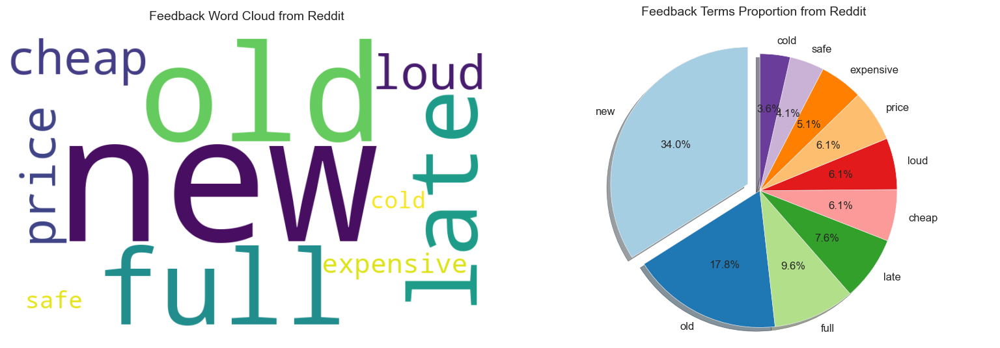

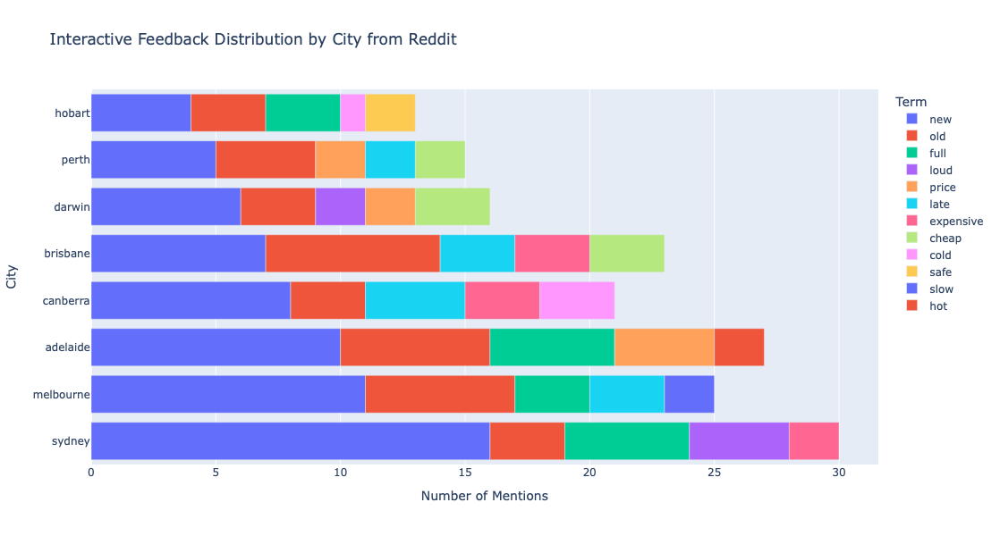

In [827]:
response = requests.get('http://localhost:8080/transportation/feedback/reddit')
data = response.json()

# Prepare data
city_data = []
for city, feedback in data['city_feedback'].items():
    for term, count in feedback['top_terms']:
        city_data.append({
            'City': city,
            'Term': term,
            'Count': count,
            'Total Mentions': feedback['total_mentions']
        })
city_df = pd.DataFrame(city_data)
top_feedback = pd.DataFrame(data['top_feedback'], columns=['Term', 'Count'])


plt.style.use('ggplot')
plt.figure(figsize=(16, 6)) 

# Wordcloud
plt.subplot(1, 2, 1)  
word_freq = dict(zip(top_feedback['Term'], top_feedback['Count']))
wordcloud = WordCloud(width=800, height=500, background_color='white', 
                      colormap='viridis').generate_from_frequencies(word_freq)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Feedback Word Cloud from Reddit', pad=20, fontsize=14)

# Pie chart
plt.subplot(1, 2, 2)  
pie_data = top_feedback.sort_values('Count', ascending=False)
explode = [0.1] + [0]*(len(pie_data)-1)  # Highlight top 1 feedback
colors = plt.cm.Paired(range(len(pie_data)))  
plt.pie(pie_data['Count'], labels=pie_data['Term'], autopct='%1.1f%%',
        startangle=90, explode=explode, shadow=True, colors=colors,
        textprops={'fontsize': 12})
plt.title('Feedback Terms Proportion from Reddit', pad=20, fontsize=14)
plt.axis('equal')  

plt.tight_layout(pad=3.0)  
plt.show()

# Interactive bar chart
fig_interactive = px.bar(city_df.sort_values('Count', ascending=False),
                        x='Count',
                        y='City',
                        color='Term',
                        title='Interactive Feedback Distribution by City from Reddit',
                        labels={'Count': 'Number of Mentions'},
                        height=600)
fig_interactive.show()